# <a id = 'top0'>About LendingClub</a> [\[1\]](#ref1)

**LendingClub** is a financial services company headquartered in San Francisco, California. It was the **first peer-to-peer (P2P) lender** to register its offerings as securities with the Securities and Exchange Commission (SEC), and to offer loan trading on a secondary market.

- LendingClub enabled borrowers to create **unsecured personal loans** between $\$$1,000 and $\$$40,000. 
- The standard loan period was **three years**. 
- Investors were able to search and browse the loan listings on LendingClub website and select loans that they wanted to invest in based on the information supplied about the **borrower**, **amount of loan**, **loan grade**, and **loan purpose**. 
- Investors made money from the **interest** on these loans. 
- LendingClub made money by charging borrowers an origination fee and investors a service fee.

# <a id = 'top'>Outline</a>

1. [General Information](#general-information)
    1. [Importing Required Libraries](#importing-required-libraries)
    2. [Understanding the Loan Dataset](#understanding-the-loan-dataset)
    3. [Analysing Columns with All Missing Values](#analysing-columns-with-all-missing-values)
    4. [Analysing the Column data types](#analysing-the-column-data-types)
    5. [Analysing the TARGET variable](#analysing-the-target-variable)
    6. [Getting rid of all the 'Current' rows](#getting-rid-of-all-the-current-rows)
    7. [Loan Status Breakdown](#loan-status-breakdown)
<br/>
2. [Data Cleaning and Manipulation](#data-cleaning-and-manipulation)
    1. [Dropping all the columns with all-null values](#dropping-all-the-columns-with-all-null-values)
    2. [Dropping all the single-valued columns](#dropping-all-the-single-valued-columns)
    3. [Dropping all columns with entirely unique values, except for one.](#dropping-all-columns-with-entirely-unique-values-except-for-one)
    4. [Dropping all sparsely populated columns](#dropping-all-sparsely-populated-columns)
    5. [Dropping all irrelevant columns that are derived post-approval](#dropping-all-irrelevant-columns-that-are-derived-post-approval)
    6. [Imputing missing values in a Categorical variable](#imputing-missing-values-in-a-categorical-variable)
    7. [Imputing missing values in a Numerical variable with discrete values](#imputing-missing-values-in-a-numerical-variable-with-discrete-values)
    8. [Correcting the data type of numerical columns that have '%' symbols](#correcting-the-data-type-of-numerical-columns-that-have-symbols)
    9. [Imputing missing values in a Numerical variable with continuous values](#imputing-missing-values-in-a-numerical-variable-with-continuous-values)
    10. [Final Check for Missing Values](#final-check-for-missing-values)
    11. [Date Conversions](#date-conversions)
    12. [Deriving new Columns using Derived Metrics](#deriving-new-columns-using-derived-metrics)
    13. [Data Summary Statistics](#data-summary-statistics)
    14. [Handling Outliers](#handling-outliers)
<br/>    
3. [Function Definitions](#function-definitions)
    1. [Functions for Univariate Analysis (Numerical)](#functions-for-univariate-analysis)
    2. [Functions for Univariate Analysis (Categorical)](#functions-for-univariate-analysis-categorical)
    3. [Functions for Segmented Univariate Analysis (Num. by Cat.)](#functions-for-segmented-univariate-analysis-numerical)
    4. [Functions for Segmented Univariate Analysis (Cat. by Cat.)](#functions-for-segmented-univariate-analysis-categorical)
    5. [Functions for Correlation Matrices](#functions-for-correlation-matrices)
    6. [Functions for Bivariate Analysis (Num. vs Num.)](#functions-for-bivariate-analysis-num-vs-num)
    7. [Functions for Bivariate Analysis (Cat. vs Cat.)](#functions-for-bivariate-analysis-cat-vs-cat)
    8. [Functions for Bivariate Analysis (Num. vs Cat.)](#functions-for-bivariate-analysis-num-vs-cat)
    9. [Functions for Multivariate Analysis](#functions-for-multivariate-analysis)
<br/>
4. [Business Overview](#business-overview)
<br/>
5. [Univariate and Segmented Univariate Analysis](#univariate-and-segmented-univariate-analysis)
    1. [Numerical Variables](#numerical-variables)
    2. [Categorical Variables](#categorical-variables)
<br/>
7. [Bivariate Analysis](#bivariate-analysis)
    1. [Numerical Variables vs Numerical Variables](#numerical-vs-numerical)
    2. [Categorical Variables vs Categorical Variables](#categorical-vs-categorical)
    3. [Numerical Variables vs Categorical Variables](#numerical-vs-categorical)
<br/>
8. [Multivariate Analysis](#multivariate-analysis)
    1. [Three Variable Analysis](#three-variable-analysis)
    2. [Four Variable Analysis](#four-variable-analysis)

## _<a id='ref'>References</a>_

<a id='ref1'>1.</a> [Wikipedia Page: LendingClub](https://en.wikipedia.org/wiki/LendingClub)

<a id='ref2'>2.</a> [United States Regions](https://education.nationalgeographic.org/resource/united-states-regions/)

<a id='ref3'>3.</a> [List of U.S. States with Codes and Abbreviations](https://www23.statcan.gc.ca/imdb/p3VD.pl?Function=getVD&TVD=53971)

<a id='ref4'>4.</a> [List of regions of the United States](https://en.wikipedia.org/wiki/List_of_regions_of_the_United_States)

# <a id = 'general-information'>1. General Information</a>

### _<a id='importing-required-libraries'><font color='RebeccaPurple'>Importing Required Libraries</font></a>_ [▲](#top)

In [1]:
# Import the libraries that we are going to use for our data analysis.
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import seaborn as sns
import plotly.express as px

# Suppress any unnecessary warning that may appear.
import warnings
warnings.filterwarnings(action='ignore')

%matplotlib inline

In [2]:
# To display maximum rows and columns
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

### _<a id='understanding-the-loan-dataset'><font color='RebeccaPurple'>Understanding the Loan Dataset</font></a>_ [▲](#top)

In [3]:
# Load the Dataset
loan_df0 = pd.read_csv('loan.csv', low_memory=False)

# First five rows of the dataset
loan_df0.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,NaN,10,0,5598,21%,37,f,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,NaN,Apr-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [4]:
# Number of rows and Columns
rows, cols = loan_df0.shape
print(f'The Loan Dataset has {rows} rows and {cols} columns.')

The Loan Dataset has 39717 rows and 111 columns.


> The Loan Dataset has **39717 rows** and **111 columns**.

### _<a id='analysing-columns-with-all-missing-values'><font color='RebeccaPurple'>Analysing Columns with All Missing Values</font></a>_ [▲](#top)

In [5]:
# Information on the Missing Values in the Columns
loan_df0.info(verbose = True, show_counts = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 111 columns):
 #    Column                          Non-Null Count  Dtype  
---   ------                          --------------  -----  
 0    id                              39717 non-null  int64  
 1    member_id                       39717 non-null  int64  
 2    loan_amnt                       39717 non-null  int64  
 3    funded_amnt                     39717 non-null  int64  
 4    funded_amnt_inv                 39717 non-null  float64
 5    term                            39717 non-null  object 
 6    int_rate                        39717 non-null  object 
 7    installment                     39717 non-null  float64
 8    grade                           39717 non-null  object 
 9    sub_grade                       39717 non-null  object 
 10   emp_title                       37258 non-null  object 
 11   emp_length                      38642 non-null  object 
 12   home_ownership  

> We can see that there are a lot of columns with **ZERO Non-Null** Values.
> And, we must get rid of i.e. **drop** these columns.

In [6]:
# Columns with All Missing Values
loan_df0.columns[loan_df0.isna().all()]

Index(['mths_since_last_major_derog', 'annual_inc_joint', 'dti_joint',
       'verification_status_joint', 'tot_coll_amt', 'tot_cur_bal',
       'open_acc_6m', 'open_il_6m', 'open_il_12m', 'open_il_24m',
       'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m',
       'open_rv_24m', 'max_bal_bc', 'all_util', 'total_rev_hi_lim', 'inq_fi',
       'total_cu_tl', 'inq_last_12m', 'acc_open_past_24mths', 'avg_cur_bal',
       'bc_open_to_buy', 'bc_util', 'mo_sin_old_il_acct',
       'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl',
       'mort_acc', 'mths_since_recent_bc', 'mths_since_recent_bc_dlq',
       'mths_since_recent_inq', 'mths_since_recent_revol_delinq',
       'num_accts_ever_120_pd', 'num_actv_bc_tl', 'num_actv_rev_tl',
       'num_bc_sats', 'num_bc_tl', 'num_il_tl', 'num_op_rev_tl',
       'num_rev_accts', 'num_rev_tl_bal_gt_0', 'num_sats', 'num_tl_120dpd_2m',
       'num_tl_30dpd', 'num_tl_90g_dpd_24m', 'num_tl_op_past_12m',
       'pct_tl_nvr_dl

In [7]:
null_cols = loan_df0.columns[loan_df0.isna().all()].shape[0]
print(f'The Loan Dataset has {null_cols} cols that have ALL NULL VALUES.')

The Loan Dataset has 54 cols that have ALL NULL VALUES.


> The Loan Dataset has **54 columns** that have **ALL NULL** values.

### _<a id='analysing-the-column-data-types'><font color='RebeccaPurple'>Analysing the Column data types</font></a>_ [▲](#top)

In [8]:
# Number of numerical and categorical variables
numerical = loan_df0.select_dtypes(include=np.number).shape[1]
categorical = loan_df0.select_dtypes(exclude=np.number).shape[1]

print(f'There are {numerical} numerical variables and {categorical} categorical variables.')

There are 87 numerical variables and 24 categorical variables.


> There are **87 numerical** variables and **24 categorical** variables **including** the columns with all null values.

In [9]:
# Number of numerical and categorical non-null variables 
numerical = loan_df0[loan_df0.columns[~loan_df0.isnull().all()]].select_dtypes(include=np.number).shape[1]
categorical = loan_df0[loan_df0.columns[~loan_df0.isnull().all()]].select_dtypes(exclude=np.number).shape[1]

print(f'There are {numerical} numerical variables and {categorical} categorical variables.')

There are 33 numerical variables and 24 categorical variables.


> There are **33 numerical** variables and **24 categorical** variables **excluding** the columns with all null values.

### _<a id='analysing-the-target-variable'><font color='RebeccaPurple'>Analysing the TARGET variable</font></a>_ [▲](#top)

Target Variable is the **loan_status**, which is the key identifier about the status of the accepted loans by the company.

In [10]:
# Information on the Missing Values in loan_status
loan_df0['loan_status'].isnull().sum()

0

> The target variable has **no null values**

In [11]:
# Analyse the Values of the Target Variable
loan_df0['loan_status'].value_counts()

loan_status
Fully Paid     32950
Charged Off     5627
Current         1140
Name: count, dtype: int64

> The loan_status has 3 Unique Values: **Fully Paid**, **Charged Off** and **Current**

> If the loan_status is **'Fully Paid'**, then the loan can be classified as a **'GOOD LOAN'**.

> But, if the loan_status is **'Charged Off'**, then the loan can be classified as a **'BAD LOAN'**.

> However, if the loan_status is **'Current'**, then the loan **cannot be classified** in either of the above categories. So it is better to drop all the rows where the Loan status is 'Current'.

### _<a id='getting-rid-of-all-the-current-rows'><font color='RebeccaPurple'>Getting rid of all the 'Current' rows</font></a>_ [▲](#top)

In [12]:
# Missing Data Check - Before
# Output: 54, 57
# print('Before Drop:', len(loan_df0.columns[loan_df0.isna().all()]))
# print('After Drop:', len(loan_df0.dropna(axis='columns', how="all").columns))

In [13]:
# Slicing the required rows
loan = loan_df0[loan_df0['loan_status'] != "Current"]
loan.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.0,0.0,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,0.0,0.0,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,NaN,10,0,5598,21%,37,f,0.0,0.0,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,NaN,Apr-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [14]:
# Missing Data Check - After
# Output: 55, 56
# print('Before Drop:', len(loan.columns[loan.isna().all()]))
# print('After Drop:', len(loan.dropna(axis='columns', how="all").columns))

In [15]:
# Checking for any duplicate rows in the dataset
duplicate_rows = loan.duplicated().sum()
print("Duplicate Rows: ", duplicate_rows)

Duplicate Rows:  0


> Since there are **NO Duplicate Rows** in the dataset, we don't need to drop any rows.

### _<a id='loan-status-breakdown'><font color='RebeccaPurple'>Loan Status Breakdown</font></a>_ [▲](#top)

In [16]:
# Filtered Target Data for Visualisation
target = loan['loan_status'].value_counts()[['Fully Paid', 'Charged Off']] 

target

loan_status
Fully Paid     32950
Charged Off     5627
Name: count, dtype: int64

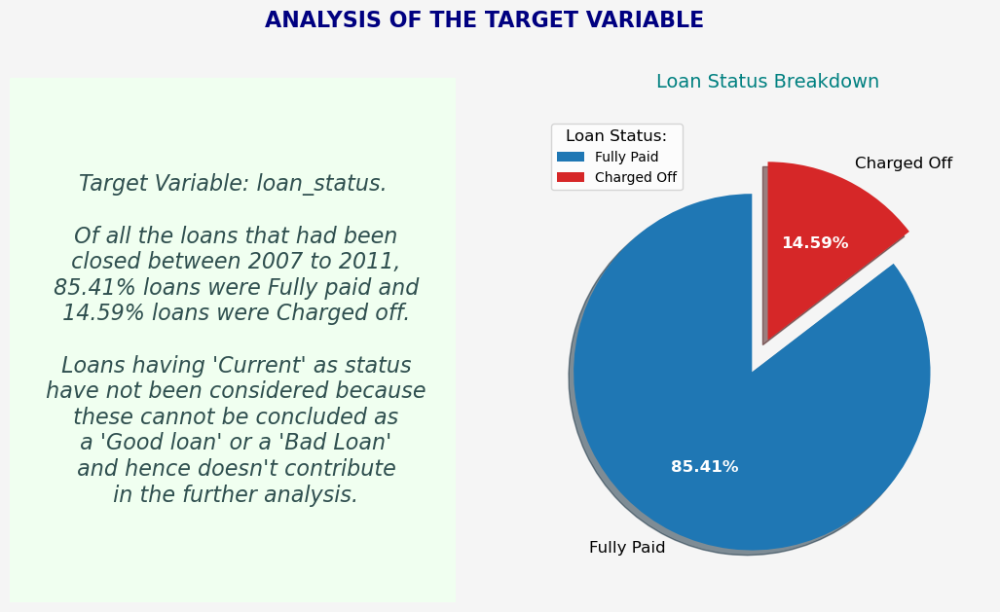

In [17]:
# Creating subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (13, 7))

# Formatting Figure
fig.suptitle('ANALYSIS OF THE TARGET VARIABLE\n', fontsize=16, fontweight='bold', color='navy')
fig.patch.set_facecolor('whitesmoke')  # Background color for the figure

# Inference Text
paid, defaulted = round((target/target.sum()*100), 2)
inference = f'Target Variable: loan_status.\n\n \
Of all the loans that had been\n closed between 2007 to 2011,\n \
{paid}% loans were Fully paid and\n {defaulted}% loans were Charged off.\n\n \
Loans having \'Current\' as status\n have not been considered because\n these cannot be concluded as\n \
a \'Good loan\' or a \'Bad Loan\'\n and hence doesn\'t contribute\n in the further analysis.'
ax1.text(0.5, 0.5, inference, ha='center', va='center', fontsize=16, fontstyle='italic', color='darkslategray')
ax1.axis('off')
ax1.add_patch(plt.Rectangle((0, 0), 1, 1, color='honeydew', transform=ax1.transAxes, zorder=-1))

# Plotting Graph
pie_labels = target.index
pie_colors = ['tab:blue', 'tab:red']
wedges, texts, autotexts = ax2.pie(target.values, explode=[0.2,0], labels=pie_labels, colors=pie_colors, autopct='%.2f%%', startangle=90, shadow = True, textprops={'fontsize': 12})
plt.setp(autotexts, color='white', weight="bold")

ax2.set_title('Loan Status Breakdown\n', fontsize=14, color='teal')
ax2.legend(title = 'Loan Status:', fontsize=10, title_fontsize=12, loc='upper left')

plt.show()

## <a id = 'data-cleaning-and-manipulation'>2. Data Cleaning and Manipulation</a>

### _<a id='dropping-all-the-columns-with-all-null-values'><font color='RebeccaPurple'>Dropping all the columns with all-null values</font></a>_ [▲](#top)

In [18]:
# Number of columns with all Null values
print("Total columns with values NA: ", len(loan.columns[loan.isna().all()]))

Total columns with values NA:  55


In [19]:
# Drop the columns with all Null values
loan.dropna(axis='columns', how="all", inplace=True)
loan.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.0,0.0,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,Sep-13,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,0.0,0.0,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,NaN,10,0,5598,21%,37,f,0.0,0.0,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
5,1075269,1311441,5000,5000,5000.0,36 months,7.90%,156.46,A,A4,Veolia Transportaton,3 years,RENT,36000.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,wedding,My wedding loan I promise to pay back,852xx,AZ,11.20,0,Nov-04,3,NaN,NaN,9,0,7963,28.30%,12,f,0.0,0.0,5632.210000,5632.21,5000.00,632.21,0.00,0.00,0.00,Jan-15,161.03,Jan-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0


In [20]:
# Number of rows and Columns
rows, cols = loan.shape
print(f'The Loan Dataset has {rows} rows and {cols} columns.')

The Loan Dataset has 38577 rows and 56 columns.


> The Loan Dataset now has **38577 rows** and **56 columns**. That is we dropped a total of 55 columns having all null values.

### _<a id='dropping-all-the-single-valued-columns'><font color='RebeccaPurple'>Dropping all the single-valued columns</font></a>_ [▲](#top)

In [21]:
# Check no. of unique values in each column
loan.nunique(dropna=True)

id                            38577
member_id                     38577
loan_amnt                       870
funded_amnt                    1019
funded_amnt_inv                8050
term                              2
int_rate                        370
installment                   15022
grade                             7
sub_grade                        35
emp_title                     28027
emp_length                       11
home_ownership                    5
annual_inc                     5215
verification_status               3
issue_d                          55
loan_status                       2
pymnt_plan                        1
url                           38577
desc                          25802
purpose                          14
title                         19297
zip_code                        822
addr_state                       50
dti                            2853
delinq_2yrs                      11
earliest_cr_line                524
inq_last_6mths              

> 11 columns have **ONLY ONE** unique values. These columns are not relevant for any further analysis. So we can drop these columns

> However for some columns all the values are unique. These are usually ids that serve as index. But one such row should be sufficient in the dataset and the rest can be dropped.

In [22]:
# Drop the columns with only one unique value
columns_to_drop = [col for col in loan.columns if loan[col].nunique() == 1]
loan.drop(columns=columns_to_drop, inplace=True)

In [23]:
loan.shape

(38577, 45)

### _<a id='dropping-all-columns-with-entirely-unique-values-except-for-one'><font color='RebeccaPurple'>Dropping all columns with entirely unique values, except for one.</font></a>_ [▲](#top)

In [24]:
# Finding columns with all unique values
columns_to_drop = [col for col in loan.columns if loan[col].nunique() == loan.shape[0]]
columns_to_drop

['id', 'member_id', 'url']

In [25]:
# Dropping 'id' and 'url' because they have lesser utility than 'member_id' in analysis
columns_to_drop.remove('member_id')
loan.drop(columns=columns_to_drop, inplace=True)
loan.columns

Index(['member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term',
       'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'desc', 'purpose', 'title', 'zip_code',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'mths_since_last_delinq', 'mths_since_last_record',
       'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d',
       'pub_rec_bankruptcies'],
      dtype='object')

In [26]:
loan.shape

(38577, 43)

### _<a id='dropping-all-sparsely-populated-columns'><font color='RebeccaPurple'>Dropping all sparsely populated columns</font></a>_ [▲](#top)

In [27]:
# Finding the percentage of Missing Values in each Column
null_cols_count = loan.isnull().sum()
null_cols_percent = round(null_cols_count/loan.shape[0]*100, 2)
null_cols_percent = null_cols_percent[null_cols_percent!=0]
null_cols_percent.sort_values(ascending=False) # Prints only those columns that have any Missing Values

mths_since_last_record    92.90
mths_since_last_delinq    64.56
desc                      32.48
emp_title                  6.19
emp_length                 2.68
pub_rec_bankruptcies       1.81
last_pymnt_d               0.18
revol_util                 0.13
title                      0.03
last_credit_pull_d         0.01
dtype: float64

> Two columns: **mths_since_last_record**, and **mths_since_last_delinq** have **more than 60% of empty records**. These cannot be imputed so we must drop these columns.

In [28]:
# Drop the columns with very high percentage of null values
columns_to_drop = ['mths_since_last_record', 'mths_since_last_delinq']
loan.drop(columns=columns_to_drop, inplace=True)

In [29]:
# Checking the percentage of Missing Values in each Column
null_cols_count = loan.isnull().sum()
null_cols_percent = round(null_cols_count/loan.shape[0]*100, 2)
null_cols_percent = null_cols_percent[null_cols_percent!=0]
null_cols_percent.sort_values(ascending=False) # Prints only those columns that have any Missing Values

desc                    32.48
emp_title                6.19
emp_length               2.68
pub_rec_bankruptcies     1.81
last_pymnt_d             0.18
revol_util               0.13
title                    0.03
last_credit_pull_d       0.01
dtype: float64

In [30]:
loan.shape

(38577, 41)

### _<a id='dropping-all-irrelevant-columns-that-are-derived-post-approval'><font color='RebeccaPurple'>Dropping all irrelevant columns that are derived post-approval</font></a>_ [▲](#top)

In [31]:
# Loading the data dictionary
data_dict = pd.read_excel('Data_Dictionary.xlsx', sheet_name='LoanStats', index_col='LoanStatNew')
data_dict.head(3)

,Description
LoanStatNew,
acc_now_delinq,The number of accounts on which the borrower i...
acc_open_past_24mths,Number of trades opened in past 24 months.
addr_state,The state provided by the borrower in the loan...


In [32]:
pd.set_option('display.max_colwidth', None)

In [33]:
# Descriptions of the remaining columns in the loan dataset
data_dict.loc[loan.columns]

,Description
member_id,A unique LC assigned Id for the borrower member.
loan_amnt,"The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value."
funded_amnt,The total amount committed to that loan at that point in time.
funded_amnt_inv,The total amount committed by investors for that loan at that point in time.
term,The number of payments on the loan. Values are in months and can be either 36 or 60.
int_rate,Interest Rate on the loan
installment,The monthly payment owed by the borrower if the loan originates.
grade,LC assigned loan grade
sub_grade,LC assigned loan subgrade
emp_title,The job title supplied by the Borrower when applying for the loan.*


In [34]:
pd.reset_option('display.max_colwidth', 0)

> By the virtue of the **nature** of the column, the following columns are not useful for analysis, because they are determined after the approval (**post-approval**) of the loan. However, it is to be noted that we need to **find the driving factors before the approval (pre-approval) of the loan** that leads to default.

    'emp_title', 'desc', 'title', 'zip_code', 'total_pymnt', 'total_pymnt_inv', 'total_rec_int', 
    'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d'

In [35]:
# Drop the Post-Approval columns 
columns_to_drop = ['emp_title', 'desc', 'title', 'zip_code', 'total_pymnt', 'total_pymnt_inv', 'total_rec_int', 
                   'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt', 
                   'last_credit_pull_d']
loan.drop(columns=columns_to_drop, inplace=True)

In [36]:
# Checking the percentage of Missing Values in each Column
null_cols_count = loan.isnull().sum()
null_cols_percent = round(null_cols_count/loan.shape[0]*100, 2)
null_cols_percent = null_cols_percent[null_cols_percent!=0]
null_cols_percent.sort_values(ascending=False) # Prints only those columns that have any Missing Values

emp_length              2.68
pub_rec_bankruptcies    1.81
revol_util              0.13
dtype: float64

> For the three columns: **emp_length**, **pub_rec_bankruptcies**, **revol_util**; the percentage of missing data is low (**less than 5%** of the sample size). Hence, these variables are eligible for **Imputation**.

In [37]:
# Number of rows and Columns
rows, cols = loan.shape
print(f'The Loan Dataset has {rows} rows and {cols} columns.')

The Loan Dataset has 38577 rows and 28 columns.


> The Loan Dataset now has **38577 rows** and **27 columns**. That is we dropped a total of 55 columns having all null values.

### _<a id='imputing-missing-values-in-a-categorical-variable'><font color='RebeccaPurple'>Imputing missing values in a Categorical variable</font></a>_ [▲](#top)

In [38]:
# Analysing emp_length
loan['emp_length'].value_counts(dropna=False)

emp_length
10+ years    8488
< 1 year     4508
2 years      4291
3 years      4012
4 years      3342
5 years      3194
1 year       3169
6 years      2168
7 years      1711
8 years      1435
9 years      1226
NaN          1033
Name: count, dtype: int64

> **Emp_Length is a Categorical Data**, but it should have been a numerical data. Numerical data is more effective in statistical analysis as compared to categorical values.

> Mode = '10+ years'. Hence we will impute Emp_Length with '10+ years'.

In [39]:
# Imputing emp_length
loan['emp_length'].fillna('10+ years', inplace=True)

In [40]:
# emp_length_labels = sorted(loan['emp_length'].unique())
emp_length_labels = ['< 1 year', '1 year', '2 years', '3 years', '4 years', '5 years', '6 years', '7 years', '8 years', '9 years',  '10+ years']

In [41]:
# Converting emp_length to integer values
loan['emp_length'] = loan['emp_length'].replace({'< 1 year': 0, '1 year': 1, '2 years': 2, '3 years': 3, 
                                                 '4 years': 4, '5 years': 5, '6 years': 6, '7 years': 7, 
                                                 '8 years': 8, '9 years': 9,  '10+ years': 10})

In [42]:
loan['emp_length'].value_counts(dropna=False) # All issues resolved.

emp_length
10    9521
0     4508
2     4291
3     4012
4     3342
5     3194
1     3169
6     2168
7     1711
8     1435
9     1226
Name: count, dtype: int64

In [43]:
verification_status_labels = ['Not Verified', 'Source Verified', 'Verified']
loan['verification_status'].unique()

array(['Verified', 'Source Verified', 'Not Verified'], dtype=object)

In [44]:
# Converting verification_status to integer values
loan['verification_status'] = loan['verification_status'].replace({'Not Verified': 0, 'Source Verified': 1, 'Verified': 2})

In [45]:
# Analysing home_ownership
loan['home_ownership'].value_counts(dropna=False)

home_ownership
RENT        18480
MORTGAGE    17021
OWN          2975
OTHER          98
NONE            3
Name: count, dtype: int64

In [46]:
# Imputing home_ownership
loan['home_ownership'] = loan['home_ownership'].replace('NONE', 'OTHER')

In [47]:
loan['home_ownership'].value_counts(dropna=False)

home_ownership
RENT        18480
MORTGAGE    17021
OWN          2975
OTHER         101
Name: count, dtype: int64

### _<a id='imputing-missing-values-in-a-numerical-variable-with-discrete-values'><font color='RebeccaPurple'>Imputing missing values in a Numerical variable with discrete values</font></a>_ [▲](#top)

In [48]:
# Analysing pub_rec_bankruptcies
loan['pub_rec_bankruptcies'].value_counts(dropna=False)

pub_rec_bankruptcies
0.0    36238
1.0     1637
NaN      697
2.0        5
Name: count, dtype: int64

> **Pub_Rec_bankruptcies is a Discrete Numerical Data**. More specifically an integer value.

> Mean = 0. Hence we will impute Pub_Rec_bankruptcies with 0.

In [49]:
# Imputing pub_rec_bankruptcies
loan['pub_rec_bankruptcies'].fillna(0, inplace=True)

In [50]:
loan['pub_rec_bankruptcies'].value_counts(dropna=False)

pub_rec_bankruptcies
0.0    36935
1.0     1637
2.0        5
Name: count, dtype: int64

### _<a id='correcting-the-data-type-of-numerical-columns-that-have-symbols'><font color='RebeccaPurple'>Correcting the data type of numerical columns that have '%' symbols</font></a>_ [▲](#top)

> In the entire dataset **two variables (int_rate and revol_util) are percentages** and, due to '%' sign present in the values, the pandas library had misinterpretated the datatype of these Numerical columns as 'Object'. Hence we need to make the necessary conversions.

In [51]:
# Remove the percentage sign
loan['int_rate'] = loan['int_rate'].str.rstrip('%')
loan['revol_util'] = loan['revol_util'].str.rstrip('%')

In [52]:
# Casting to numeric datatype
loan[['int_rate', 'revol_util']] = loan[['int_rate', 'revol_util']].apply(pd.to_numeric)

In [53]:
loan['int_rate'].dtype

dtype('float64')

In [54]:
loan['revol_util'].dtype

dtype('float64')

### _<a id='imputing-missing-values-in-a-numerical-variable-with-continuous-values'><font color='RebeccaPurple'>Imputing missing values in a Numerical variable with continuous values</font></a>_ [▲](#top)

In [55]:
# Analysing revol_util
loan['revol_util'].nunique()

1088

In [56]:
# No. of Missing values
loan['revol_util'].isna().sum()

50

In [57]:
loan['revol_util'].describe()

count    38527.000000
mean        48.702777
std         28.364741
min          0.000000
25%         25.200000
50%         49.100000
75%         72.300000
max         99.900000
Name: revol_util, dtype: float64

> **Revol_Util is a Continuous Numerical Data**. More specifically a float value.

> Mean = 48.7 and Median = 49.1 have a very small difference in values. It implies that the data is not skewed. Hence, we can either use Mean or Median value to impute the missing values. Its always advisable to use median in such a situation.

> Median = 49.10. Hence we will impute Revol_Util with median.

In [58]:
# Imputing revol_util
loan['revol_util'].fillna(49.10, inplace=True)

In [59]:
loan['revol_util'].isna().sum()

0

### _<a id='final-check-for-missing-values'><font color='RebeccaPurple'>Final Check for Missing Values</font></a>_ [▲](#top)

In [60]:
# Final Checking of the percentage of Missing Values in each Column
loan.isnull().sum().sort_values(ascending=False)

member_id               0
loan_amnt               0
total_rec_prncp         0
total_acc               0
revol_util              0
revol_bal               0
pub_rec                 0
open_acc                0
inq_last_6mths          0
earliest_cr_line        0
delinq_2yrs             0
dti                     0
addr_state              0
purpose                 0
loan_status             0
issue_d                 0
verification_status     0
annual_inc              0
home_ownership          0
emp_length              0
sub_grade               0
grade                   0
installment             0
int_rate                0
term                    0
funded_amnt_inv         0
funded_amnt             0
pub_rec_bankruptcies    0
dtype: int64

> Now the Loan Dataset has no missing values.

> Next for further analysis, we need to convert the date columns into the datetime datatype from the object datatype.

### _<a id='date-conversions'><font color='RebeccaPurple'>Date Conversions</font></a>_ [▲](#top)

In [61]:
# Analyse the data types of all remaining Columns
loan.dtypes

member_id                 int64
loan_amnt                 int64
funded_amnt               int64
funded_amnt_inv         float64
term                     object
int_rate                float64
installment             float64
grade                    object
sub_grade                object
emp_length                int64
home_ownership           object
annual_inc              float64
verification_status       int64
issue_d                  object
loan_status              object
purpose                  object
addr_state               object
dti                     float64
delinq_2yrs               int64
earliest_cr_line         object
inq_last_6mths            int64
open_acc                  int64
pub_rec                   int64
revol_bal                 int64
revol_util              float64
total_acc                 int64
total_rec_prncp         float64
pub_rec_bankruptcies    float64
dtype: object

> The following columns are supposed to be datetime objects, but they are not.

    'issue_d', 'earliest_cr_line'

In [62]:
# Type casting to datetime format:
loan['issue_d'] = pd.to_datetime(loan['issue_d'], format='%b-%y')
loan['issue_d'].dtype

dtype('<M8[ns]')

In [63]:
# Type casting to datetime format:
loan['earliest_cr_line'] = pd.to_datetime(loan['earliest_cr_line'], format='%b-%y')
loan['earliest_cr_line'].dtype

dtype('<M8[ns]')

In [64]:
# Recheck the data types using:
# loan.dtypes

### _<a id='deriving-new-columns-using-derived-metrics'><font color='RebeccaPurple'>Deriving new Columns using Derived Metrics</font></a>_ [▲](#top)

> Deriving using **issue_d**, which is the date on which the loan was issued.

In [65]:
# Derive the issue year
loan['issue_year']=loan['issue_d'].dt.year

# Derive the issue month
loan['issue_month']=loan['issue_d'].dt.month

# Derive the quarter 
loan['issue_quarter'] = loan['issue_d'].dt.quarter

# Data of the derived columns
loan[['issue_d', 'issue_year', 'issue_month', 'issue_quarter']].head()

,issue_d,issue_year,issue_month,issue_quarter
0,2011-12-01,2011,12,4
1,2011-12-01,2011,12,4
2,2011-12-01,2011,12,4
3,2011-12-01,2011,12,4
5,2011-12-01,2011,12,4


> Deriving using **earliest_cr_line**, which is the month in which the borrower's earliest reported credit line was opened.

In [66]:
# Create a function to perform the date_difference mechanism
def month_diff(date):
    date1 = min(date)
    date2 = max(date)
    return (date2.year - date1.year) * 12 + date2.month - date1.month

# Derive the no. of months since the earliest credit line was opened
loan['months_since_ecr'] = loan[['earliest_cr_line', 'issue_d']].apply(month_diff, axis=1)

# Data of the derived columns
loan[['earliest_cr_line', 'issue_d', 'months_since_ecr']].head()

,earliest_cr_line,issue_d,months_since_ecr
0,1985-01-01,2011-12-01,323
1,1999-04-01,2011-12-01,152
2,2001-11-01,2011-12-01,121
3,1996-02-01,2011-12-01,190
5,2004-11-01,2011-12-01,85


> Deriving using **addr_state**, state provided by the borrower. We want to derive the Regions of the states.

> A common way of referring to regions in the United States is grouping them into 5 regions according to their geographic position on the continent: the **Northeast**, **Southwest**, **West**, **Southeast**, and **Midwest**.[\[2\]](#ref2)

> Using the List of U.S. States with Codes and Abbreviations[\[3\]](#ref3) and the List of Regions in United States[\[4\]](#ref4) we can conclude the following:

**North-East Region:** Connecticut, Maine, Massachusetts, New Hampshire, Rhode Island, Vermont, New York, New Jersey, Pennsylvania

**Midwest Region:** Illinois, Indiana, Iowa, Kansas, Michigan, Minnesota, Missouri, Nebraska, North Dakota, Ohio, South Dakota, Wisconsin

**South-East Region:** Alabama, Delaware, Florida, Georgia, Kentucky, Maryland, Mississippi, North Carolina, South Carolina, Tennessee, Virginia, District of Columbia, West Virginia

**South-West Region:** Arkansas, Louisiana, Oklahoma, Texas

**West Region:** Alaska, Arizona, California, Colorado, Hawaii, Idaho, Montana, Nevada, New Mexico, Oregon, Utah, Washington, Wyoming

In [67]:
# Using this information create lists for each region
north_east = ['CT', 'ME', 'MA', 'NH', 'RI', 'VT', 'NY', 'NJ', 'PA']
mid_west = ['IL', 'IN', 'IA', 'KS', 'MI', 'MN', 'MO', 'NE', 'ND', 'OH', 'SD', 'WI']
south_east = ['AL', 'DE', 'FL', 'GA', 'KY', 'MD', 'MS', 'NC', 'SC', 'TN', 'VA', 'DC', 'WV' ]
south_west = ['AR', 'LA', 'OK','TX']
west = ['AK', 'AZ', 'CA', 'CO', 'HI', 'ID', 'MT', 'NV', 'NM', 'OR', 'UT','WA', 'WY']

In [68]:
# Create a function to assign region values using addr_state
def assign_region(state):
    if state in north_east:
        return 'NorthEast'
    elif state in mid_west:
        return 'MidWest'
    elif state in south_east:
        return 'SouthEast'
    elif state in south_west:
        return 'SouthWest'
    elif state in west:
        return 'West'

# Derive the Region 
loan['region'] = loan['addr_state'].apply(assign_region)

# Data of the derived columns
loan[['addr_state', 'region']].head()

,addr_state,region
0,AZ,West
1,GA,SouthEast
2,IL,MidWest
3,CA,West
5,AZ,West


### _<a id='data-summary-statistics'><font color='RebeccaPurple'>Data Summary Statistics</font></a>_ [▲](#top)

In [69]:
# Print the Dataframe 
loan.head()

,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,total_rec_prncp,pub_rec_bankruptcies,issue_year,issue_month,issue_quarter,months_since_ecr,region
0,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,B2,10,RENT,24000.0,2,2011-12-01,Fully Paid,credit_card,AZ,27.65,0,1985-01-01,1,3,0,13648,83.7,9,5000.00,0.0,2011,12,4,323,West
1,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,C4,0,RENT,30000.0,1,2011-12-01,Charged Off,car,GA,1.00,0,1999-04-01,5,3,0,1687,9.4,4,456.46,0.0,2011,12,4,152,SouthEast
2,1313524,2400,2400,2400.0,36 months,15.96,84.33,C,C5,10,RENT,12252.0,0,2011-12-01,Fully Paid,small_business,IL,8.72,0,2001-11-01,2,2,0,2956,98.5,10,2400.00,0.0,2011,12,4,121,MidWest
3,1277178,10000,10000,10000.0,36 months,13.49,339.31,C,C1,10,RENT,49200.0,1,2011-12-01,Fully Paid,other,CA,20.00,0,1996-02-01,1,10,0,5598,21.0,37,10000.00,0.0,2011,12,4,190,West
5,1311441,5000,5000,5000.0,36 months,7.90,156.46,A,A4,3,RENT,36000.0,1,2011-12-01,Fully Paid,wedding,AZ,11.20,0,2004-11-01,3,9,0,7963,28.3,12,5000.00,0.0,2011,12,4,85,West


In [70]:
# Number of numerical and categorical variables
numerical = loan.select_dtypes(include=np.number).shape[1]
categorical = loan.select_dtypes(exclude=np.number).shape[1]

print(f'There are {numerical} numerical variables and {categorical} categorical variables.')

There are 23 numerical variables and 10 categorical variables.


In [71]:
# Summary of Numerical Columns
loan.describe()

,member_id,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,emp_length,annual_inc,verification_status,issue_d,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,total_rec_prncp,pub_rec_bankruptcies,issue_year,issue_month,issue_quarter,months_since_ecr
count,3.857700e+04,38577.000000,38577.000000,38577.000000,38577.000000,38577.000000,38577.000000,3.857700e+04,38577.000000,38577,38577.000000,38577.000000,38577,38577.000000,38577.000000,38577.000000,38577.000000,38577.000000,38577.000000,38577.000000,38577.000000,38577.000000,38577.000000,38577.000000,38577.000000
mean,8.422843e+05,11047.025430,10784.058506,10222.481123,11.932219,322.466318,5.076445,6.877797e+04,0.883661,2010-10-25 23:47:14.030640128,13.272727,0.146668,1997-04-25 11:55:41.317365376,0.871737,9.275423,0.055422,13289.489826,48.703292,22.052648,9648.322898,0.042694,2010.309070,7.114757,2.694015,164.906239
min,7.069900e+04,500.000000,500.000000,0.000000,5.420000,15.690000,0.000000,4.000000e+03,0.000000,2007-06-01 00:00:00,0.000000,0.000000,1969-02-01 00:00:00,0.000000,2.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,2007.000000,1.000000,1.000000,36.000000
25%,6.611310e+05,5300.000000,5200.000000,5000.000000,8.940000,165.740000,2.000000,4.000000e+04,0.000000,2010-05-01 00:00:00,8.130000,0.000000,1993-12-01 00:00:00,0.000000,6.000000,0.000000,3650.000000,25.200000,13.000000,4500.000000,0.000000,2010.000000,4.000000,2.000000,109.000000
50%,8.392920e+05,9600.000000,9550.000000,8733.440000,11.710000,277.860000,4.000000,5.886800e+04,1.000000,2011-01-01 00:00:00,13.370000,0.000000,1998-06-01 00:00:00,1.000000,9.000000,0.000000,8762.000000,49.100000,20.000000,8000.000000,0.000000,2011.000000,7.000000,3.000000,150.000000
75%,1.037336e+06,15000.000000,15000.000000,14000.000000,14.380000,425.550000,9.000000,8.200000e+04,2.000000,2011-08-01 00:00:00,18.560000,0.000000,2001-10-01 00:00:00,1.000000,12.000000,0.000000,16912.000000,72.200000,29.000000,13175.000000,0.000000,2011.000000,10.000000,4.000000,204.000000
max,1.314167e+06,35000.000000,35000.000000,35000.000000,24.400000,1305.190000,10.000000,6.000000e+06,2.000000,2011-12-01 00:00:00,29.990000,11.000000,2068-12-01 00:00:00,8.000000,44.000000,4.000000,149588.000000,99.900000,90.000000,35000.020000,2.000000,2011.000000,12.000000,4.000000,720.000000
std,2.644519e+05,7348.441646,7090.306027,7022.720644,3.691327,208.639215,3.602917,6.421868e+04,0.857692,NaN,6.673044,0.492271,NaN,1.071546,4.401588,0.237804,15866.492241,28.346356,11.425861,7009.381200,0.202809,0.882658,3.408523,1.103942,83.207980


> **'delinq_2yrs', 'inq_last_6mths', 'pub_rec', 'pub_rec_bankruptcies'** have very low mean values. We need to find whether these attributes have any meaningful relationship with the loan_status of not.

In [72]:
# Check the Skewness of the numerical attributes
loan.skew(numeric_only=True)

member_id               -0.180679
loan_amnt                1.078103
funded_amnt              1.103828
funded_amnt_inv          1.129997
int_rate                 0.293627
installment              1.150486
emp_length               0.161146
annual_inc              31.198414
verification_status      0.225040
dti                     -0.026842
delinq_2yrs              5.033279
inq_last_6mths           1.384390
open_acc                 1.007288
pub_rec                  4.519991
revol_bal                3.212019
revol_util              -0.027641
total_acc                0.832481
total_rec_prncp          1.152862
pub_rec_bankruptcies     4.570792
issue_year              -1.224395
issue_month             -0.210785
issue_quarter           -0.233385
months_since_ecr         1.351574
dtype: float64

> The following attributes have low skewness and are **Approximately Symmetric: 'int_rate', 'emp_length', 'dti', 'revol_util', 'total_acc'**

> **annual_inc is a highly skewed** at skewness = 31.198414.

> And all the other attributes are moderately skewed, and require outlier treatment.

In [73]:
# Summary of Categorical Columns
loan.describe(include=['O'])

,term,grade,sub_grade,home_ownership,loan_status,purpose,addr_state,region
count,38577,38577,38577,38577,38577,38577,38577,38577
unique,2,7,35,4,2,14,50,5
top,36 months,B,A4,RENT,Fully Paid,debt_consolidation,CA,West
freq,29096,11675,2873,18480,32950,18055,6949,11144


> **sub_grade** has **35** unique values and **addr_state** has **50** unique values. Hence they are **not good** for being considered as the driving factors for Loan Defaults. 

> On the other hand, **term, grade, home_ownership, verification_status, and region are very good attributes** to be analysed as the driving factors.

### _<a id='handling-outliers'><font color='RebeccaPurple'>Handling Outliers</font></a>_ [▲](#top)

In [74]:
# Create a Function to Count the Outliers
def count_outliers(df, column_of_interest):
    # Calculate quartiles and IQR
    Q1 = df[column_of_interest].quantile(0.25)
    Q3 = df[column_of_interest].quantile(0.75)
    IQR = Q3 - Q1

    # Define upper and lower bounds for outliers (IQR method)
    lower_bound_iqr = Q1 - 1.5 * IQR
    upper_bound_iqr = Q3 + 1.5 * IQR

    # Count outliers (IQR method)
    outliers_iqr = df[(df[column_of_interest] < lower_bound_iqr) | (df[column_of_interest] > upper_bound_iqr)]
    outliers_iqr_count = outliers_iqr.shape[0]

    # Calculate z-scores
    z_scores = stats.zscore(df[column_of_interest])

    # Define threshold for outliers (z-score method)
    threshold = 3

    # Count outliers (z-score method)
    outliers_zscore = df[np.abs(z_scores) > threshold]
    outliers_zscore_count = outliers_zscore.shape[0]
    
    print(f"Number of outliers (IQR method): {outliers_iqr_count}")
    print(f"Number of outliers (z-score method): {outliers_zscore_count}")


# Create a Function to Remove the Outliers
def remove_outliers(df, column_of_interest):
    # Count outliers before removing
    print('Before Removing Outliers:')
    count_outliers(df, column_of_interest)

    # Calculate z-scores
    z_scores = stats.zscore(df[column_of_interest])

    # Define threshold for outliers (z-score method)
    threshold = 3

    # Remove outliers based on the z-score method
    df_no_outliers = df[np.abs(z_scores) <= threshold]

    # Count outliers after removing
    print('After Removing Outliers:')
    count_outliers(df_no_outliers, column_of_interest)

    return df_no_outliers


In [75]:
# Columns at the disposal
columns_to_handle = ['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'int_rate', 'installment','annual_inc', 'dti', 
                     'delinq_2yrs', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 
                     'total_rec_prncp', 'pub_rec_bankruptcies']

In [76]:
# Check for Outliers: 
for column in columns_to_handle:
    print(f'Outliers in {column}:')
    count_outliers(loan, column)
    print('\n')

Outliers in loan_amnt:
Number of outliers (IQR method): 1088
Number of outliers (z-score method): 641


Outliers in funded_amnt:
Number of outliers (IQR method): 920
Number of outliers (z-score method): 552


Outliers in funded_amnt_inv:
Number of outliers (IQR method): 1034
Number of outliers (z-score method): 545


Outliers in int_rate:
Number of outliers (IQR method): 65
Number of outliers (z-score method): 40


Outliers in installment:
Number of outliers (IQR method): 1373
Number of outliers (z-score method): 324


Outliers in annual_inc:
Number of outliers (IQR method): 1762
Number of outliers (z-score method): 279


Outliers in dti:
Number of outliers (IQR method): 0
Number of outliers (z-score method): 0


Outliers in delinq_2yrs:
Number of outliers (IQR method): 4191
Number of outliers (z-score method): 984


Outliers in inq_last_6mths:
Number of outliers (IQR method): 3554
Number of outliers (z-score method): 255


Outliers in open_acc:
Number of outliers (IQR method): 495
Num

In [77]:
# Remove the Columns with no outliers
columns_to_handle.remove('dti')
columns_to_handle.remove('revol_util')

# Remove the columns with very high number of outliers (as per z-scores)
columns_to_handle.remove('delinq_2yrs')
columns_to_handle.remove('pub_rec')
columns_to_handle.remove('revol_bal')
columns_to_handle.remove('pub_rec_bankruptcies')

# Drop the above 4 columns from loan dataset
columns_to_drop = ['delinq_2yrs', 'pub_rec', 'revol_bal', 'pub_rec_bankruptcies']
loan.drop(columns=columns_to_drop, inplace=True)

columns_to_handle

['loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'int_rate',
 'installment',
 'annual_inc',
 'inq_last_6mths',
 'open_acc',
 'total_acc',
 'total_rec_prncp']

In [78]:
loan_no_outliers = loan.copy()
loan_no_outliers.shape

(38577, 29)

In [79]:
# Outlier Treatment on all the columns in columns_to_handle
for column in columns_to_handle:
    print(f'Handling {column} :')
    loan_no_outliers = remove_outliers(loan_no_outliers, column)
    print(loan_no_outliers.shape)
    print('\n')

Handling loan_amnt :
Before Removing Outliers:
Number of outliers (IQR method): 1088
Number of outliers (z-score method): 641
After Removing Outliers:
Number of outliers (IQR method): 431
Number of outliers (z-score method): 84
(37936, 29)


Handling funded_amnt :
Before Removing Outliers:
Number of outliers (IQR method): 428
Number of outliers (z-score method): 381
After Removing Outliers:
Number of outliers (IQR method): 179
Number of outliers (z-score method): 44
(37555, 29)


Handling funded_amnt_inv :
Before Removing Outliers:
Number of outliers (IQR method): 228
Number of outliers (z-score method): 47
After Removing Outliers:
Number of outliers (IQR method): 186
Number of outliers (z-score method): 47
(37508, 29)


Handling int_rate :
Before Removing Outliers:
Number of outliers (IQR method): 65
Number of outliers (z-score method): 41
After Removing Outliers:
Number of outliers (IQR method): 24
Number of outliers (z-score method): 1
(37467, 29)


Handling installment :
Before Rem

In [80]:
# Check for Outliers: 
for column in columns_to_handle:
    print(f'Outliers in {column}:')
    count_outliers(loan_no_outliers, column)
    print('\n')

Outliers in loan_amnt:
Number of outliers (IQR method): 51
Number of outliers (z-score method): 49


Outliers in funded_amnt:
Number of outliers (IQR method): 11
Number of outliers (z-score method): 9


Outliers in funded_amnt_inv:
Number of outliers (IQR method): 210
Number of outliers (z-score method): 11


Outliers in int_rate:
Number of outliers (IQR method): 34
Number of outliers (z-score method): 9


Outliers in installment:
Number of outliers (IQR method): 772
Number of outliers (z-score method): 232


Outliers in annual_inc:
Number of outliers (IQR method): 1477
Number of outliers (z-score method): 646


Outliers in inq_last_6mths:
Number of outliers (IQR method): 3033
Number of outliers (z-score method): 281


Outliers in open_acc:
Number of outliers (IQR method): 851
Number of outliers (z-score method): 102


Outliers in total_acc:
Number of outliers (IQR method): 234
Number of outliers (z-score method): 106


Outliers in total_rec_prncp:
Number of outliers (IQR method): 1138

In [81]:
# Reassigning loan_no_outliers back to loan dataset
loan = loan_no_outliers.copy()

## <a id = 'function-definitions'>3. Function Definitions</a>

### _<a id='functions-for-univariate-analysis'><font color='RebeccaPurple'>Functions for Univariate Analysis (Numerical)</font></a>_ [▲](#top)

In [82]:
def numeric_column_summary(df, column_name):
    """
    Analyzes the distribution of a numeric column and provides statistical insights.
    
    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    column_name (str): The name of the numeric column to analyze.
    
    Returns:
    pd.DataFrame: DataFrame with statistical observations.
    """
    # Extract the numeric column
    numeric_data = df[column_name]
    
    # Calculate central tendency
    mean_value = numeric_data.mean()
    median_value = numeric_data.median()
    mode_value = numeric_data.mode().iloc[0]
    
    # Calculate spread and variability
    min_value = numeric_data.min()
    max_value = numeric_data.max()
    range_value = max_value - min_value
    std_dev_value = numeric_data.std()
    
    # Distribution shape
    skewness = numeric_data.skew()
    kurtosis = numeric_data.kurtosis()
    
    # Identify outliers using the IQR method
    Q1 = numeric_data.quantile(0.25)
    Q2 = median_value  # Q2 is the median
    Q3 = numeric_data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = numeric_data[(numeric_data < lower_bound) | (numeric_data > upper_bound)]
    
    # Filter data within the Q1 to Q3 range
    filtered_data = numeric_data[(numeric_data >= Q1) & (numeric_data <= Q3)]
    
    # Calculate frequency of each value within the Q1 to Q3 range
    freq_series = filtered_data.value_counts()
    min_freq_value = freq_series.idxmin() if not freq_series.empty else None
    max_freq_value = freq_series.idxmax() if not freq_series.empty else None
    min_freq = freq_series.min() if not freq_series.empty else None
    max_freq = freq_series.max() if not freq_series.empty else None
    
    # Find values with minimum and maximum frequencies
    minima = min_freq_value
    maxima = max_freq_value
    
    # Create observation DataFrame
    observations_df = pd.DataFrame({
        'Metric': [
            'Mean',
            'Median',
            'Mode',
            'Min',
            'Max',
            'Q1',
            'Q3',
            'Range',
            'STD',
            'Skewness',
            'Kurtosis',
            'Minima',
            'Maxima',
            'Outliers'
        ],
        'Value': [
            f"{mean_value:.2f}",
            f"{median_value:.2f}",
            f"{mode_value:.2f}",
            f"{min_value:.2f}",
            f"{max_value:.2f}",
            f"{Q1:.2f}",
            f"{Q3:.2f}",
            f"{range_value:.2f}",
            f"{std_dev_value:.2f}",
            f"{skewness:.2f}",
            f"{kurtosis:.2f}",
            f"{minima:.2f}",
            f"{maxima:.2f}",
            len(outliers)
        ]
    })
    
    observations_df = observations_df.T
    observations_df.columns = observations_df.iloc[0]
    observations_df = observations_df[1:]
    
    # Set display options to ensure full output
    pd.set_option('display.max_colwidth', None)
    pd.set_option('display.expand_frame_repr', False)
    
    return observations_df


In [83]:
def plot_boxplot(data, columns_to_plot, palette='coolwarm'):
    """
    Plot horizontal boxplots for specified numerical columns.

    Parameters:
    - data (pd.DataFrame): The DataFrame containing the data to plot.
    - columns_to_plot (list of str): List of column names to plot.
    - palette (str): The color palette to use for the plots.
    
    Returns:
    - None: Displays the boxplots.
    """
    plt.figure(figsize=(12, 5))

    # Melt the DataFrame to long format for easier plotting
    data_melted = data.melt(value_vars=columns_to_plot, var_name='Variable', value_name='Value')

    # Create the horizontal boxplot
    sns.boxplot(data=data_melted, y='Variable', x='Value', palette=palette, orient='h')
    plt.title('Boxplots of Numerical Variables')
    plt.xlabel('Values')
    plt.ylabel('Variables')
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

In [84]:
def plot_histplot(df, columns, titles):
    """
    Plots distribution plots for specified numerical columns.

    Parameters:
    - df: pd.DataFrame - The DataFrame containing the data to plot.
    - columns: list - List of column names (numerical) for which to plot distribution plots.
    - titles: list - List of titles corresponding to each column for customizing plot titles.

    Returns:
    - None - Displays the distribution plots in a 1x3 grid.
    """
    # Set the style
    sns.set(style="whitegrid")

    # Create the 1x3 subplots
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # Flatten the axes array for easy iteration
    axes = axes.flatten()
    
    for i, col in enumerate(columns):
        sns.histplot(df, x=col, kde=True, ax=axes[i], palette='coolwarm')
        axes[i].set_title(f'Distribution of {titles[i]}')
        axes[i].set_xlabel(titles[i])
        axes[i].set_ylabel('Frequency')

    # Adjust layout
    plt.tight_layout()
    plt.show()

In [85]:
def univariate_numerical(data, column_of_interest):
    """
    Performs univariate analysis by plotting histograms and box plots for a specified column in the given DataFrame.

    Parameters:
    - data: pd.DataFrame, the DataFrame containing the data
    - column_of_interest: str, the name of the column to visualize
    """
    
    h_bins = {'int_rate': 35, 'installment': 30, 'annual_inc': 20, 'dti': 40, 'revol_util': 40, 
              'months_since_ecr': 15, 'open_acc': 10, 'total_acc': 13}
    title = column_of_interest.replace('_', ' ').title()
    
    # Customize colors
    color_palette = sns.color_palette('pastel')[0]
    
    # Set up the figure and axes
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    
    # Formatting Figure
    fig.suptitle(f'Distribution of {title}', fontsize=16, fontweight='bold', color='navy')
    fig.patch.set_facecolor('whitesmoke')  # Background color for the figure
    
    # Histogram
    sns.histplot(data=data, x=column_of_interest, bins=h_bins.get(column_of_interest, 30), kde=True, color=color_palette, edgecolor=color_palette, ax=ax1, alpha=0.6)
    ax1.set_title(f'Histogram of {title}', fontsize=14, color='Teal')
    ax1.set_xlabel(title, fontsize=12)
    ax1.set_ylabel('Frequency', fontsize=12)
    ax1.grid(False)  # Turn off gridlines

    # Box plot
    sns.boxplot(data=data, x=column_of_interest, ax=ax2, color=color_palette)
    ax2.set_title(f'Box Plot of {title}', fontsize=14, color='Teal')
    ax2.set_xlabel(title, fontsize=12)
    ax2.set_ylabel('Values', fontsize=12)
    ax2.grid(False)  # Turn off gridlines
    
    plt.tight_layout()
    plt.show()

### _<a id='functions-for-univariate-analysis-categorical'><font color='RebeccaPurple'>Functions for Univariate Analysis (Categorical)</font></a>_ [▲](#top)

Based on the Boxplot of Annual Income, let's divide the Income into 3 Buckets:

- **Low Income Category:** 0 - 50000
- **Medium Income Category:** 50000 - 100000
- **High Income Category:** 100000 and above

In [86]:
def income_category(income):
    if income > 100000:
        return 2
    elif income > 50000:
        return 1
    else:
        return 0

loan['income_category'] = loan['annual_inc'].apply(income_category)
income_category_labels = ['Low', 'Medium', 'High']

loan[['annual_inc', 'income_category']].head()

,annual_inc,income_category
0,24000.0,0
2,12252.0,0
3,49200.0,0
5,36000.0,0
6,47004.0,0


In [87]:
def categorical_column_summary(df, column_name):
    """
    Analyzes a categorical column and provides statistical insights.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    column_name (str): The name of the categorical column to analyze.

    Returns:
    pd.DataFrame: DataFrames with categorical distribution and insights.
    """

    # Extract the categorical column
    categorical_data = df[column_name].dropna()
    
    # Frequency counts
    frequency_counts = categorical_data.value_counts()
    
    # Proportions
    proportions = categorical_data.value_counts(normalize=True) * 100
    
    # Create frequency DataFrame
    frequency_df = pd.DataFrame({
        'Category': frequency_counts.index,
        'Count': frequency_counts.values,
        'Proportion (%)': proportions.values
    })
    
    frequency_df = frequency_df.T
    frequency_df.columns = frequency_df.iloc[0]
    frequency_df = frequency_df[1:]
    
    # Set display options to ensure full output
    pd.set_option('display.max_colwidth', None)
    pd.set_option('display.expand_frame_repr', False)
    
    return frequency_df

In [88]:
# Formatter to reduce number of zeros on the y-axis
def thousands_formatter(x, pos):
    return '%1.0fK' % (x * 1e-3)

def univariate_categorical(data, column_of_interest):
    """
    Performs Univariate Analysis by plotting count and percentage distributions of a specified column in the given DataFrame.

    Parameters:
    - data: pd.DataFrame, the DataFrame containing the data
    - column_of_interest: str, the name of the column to visualize
    """
    
    start_angle = {
        'term': 90, 'grade': 70, 'income_category': 90, 'home_ownership': 92, 'verification_status': 180, 
        'loan_status': 90, 'region': 0, 'inq_last_6mths': 180, 'issue_year': 180, 'issue_month': 90, 'issue_quarter': 90
    }
    explode_list = {
        'term': [0.2, 0], 'grade': [0, 0.2, 0, 0, 0, 0, 0], 'income_category': [0, 0, 0.2], 
        'home_ownership': [0, 0, 0.2, 0], 'verification_status': [0, 0.2, 0], 'loan_status': [0.2, 0], 
        'region': [0.2, 0, 0, 0, 0], 'inq_last_6mths': [0, 0.2, 0, 0, 0], 'issue_year': [0, 0, 0, 0, 0.2], 
        'issue_month': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.2], 'issue_quarter': [0, 0, 0, 0.2]
    }
    xticks_labels = {
        'term': False, 'grade': False, 'income_category': income_category_labels, 'home_ownership': False, 
        'verification_status': verification_status_labels, 'loan_status': False, 'region': False, 
        'inq_last_6mths': False, 'issue_year': False, 'issue_month': False, 'issue_quarter': False
    }
    
    title = column_of_interest.replace('_', ' ').title()

    # Setting up the subplots
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    # Formatting Figure
    fig.suptitle(f'Distribution of {title}', fontsize=16, fontweight='bold', color='navy')
    fig.patch.set_facecolor('whitesmoke')  # Background color for the figure
    
    # Custom color palette
    color_palette = 'viridis'

    # Plot countplot
    sns.countplot(data=data, x=column_of_interest, palette=color_palette, ax=axes[0], order=sorted(data[column_of_interest].unique()))  
    axes[0].set_title(f'{title} (Counts)' , fontsize=14, color='Teal')
    axes[0].set_xlabel('')
    axes[0].set_ylabel('Count', fontsize=12)
    axes[0].tick_params(axis='x')
    axes[0].yaxis.set_major_formatter(FuncFormatter(thousands_formatter))
    
    # Set custom xtick labels
    if xticks_labels[column_of_interest]:
        axes[0].set_xticklabels(xticks_labels[column_of_interest], rotation=45, ha='right')

    # Plot pie chart
    data_counts = data[column_of_interest].value_counts().sort_index()
    data_percent = data_counts / data_counts.sum() * 100
    
    if column_of_interest == 'verification_status':
            data_percent.index = verification_status_labels
    elif column_of_interest == 'income_category':
        data_percent.index = income_category_labels

    wedges, texts, autotexts = axes[1].pie(
        data_percent, 
        labels=data_percent.index, 
        autopct='%1.1f%%', 
        colors=sns.color_palette(color_palette, len(data_percent)), 
        startangle=start_angle[column_of_interest], 
        explode=explode_list[column_of_interest], 
        shadow=True,
        textprops={'fontsize': 12}
    )
    plt.setp(autotexts, color='white', weight="bold")
    
    axes[1].set_title(f'{title} (Percentages)', fontsize=14, color='Teal')

    fig.tight_layout()
    plt.show()

In [89]:
def univariate_categorical_count(data, column_of_interest):
    """
    Performs Univariate Analysis by plotting the count distribution of a specified column in the given DataFrame.

    Parameters:
    - data: pd.DataFrame, the DataFrame containing the data
    - column_of_interest: str, the name of the column to visualize
    """
    
    title = column_of_interest.replace('_', ' ').title()
    
    # Setting up the subplot
    fig, axes = plt.subplots(figsize=(12, 4))
    
    # Formatting Figure
    fig.suptitle(f'Distribution of {title}', fontsize=16, fontweight='bold', color='navy')
    fig.patch.set_facecolor('whitesmoke')  # Background color for the figure
    
    # Custom color palette
    color_palette = 'viridis'
    
    # Plot countplot
    sns.countplot(data=data, x=column_of_interest, palette=color_palette, ax=axes, order=sorted(data[column_of_interest].unique()))
    
    axes.set_title(f'{title} (Counts)', fontsize=14, color='Teal')
    axes.set_xlabel('')
    axes.set_ylabel('Count', fontsize=12)
    axes.tick_params(axis='x')
    
    # Set custom xtick labels based on the column of interest
    if column_of_interest == 'emp_length':
        axes.set_xticklabels(emp_length_labels)
    elif column_of_interest == 'purpose':
        plt.xticks(rotation=45, ha='right')
    
    fig.tight_layout()
    plt.show()


In [90]:
def univariate_categorical_percentage(data, column_of_interest):
    """
    Performs Univariate Analysis by plotting the percentage distribution of a specified column in the given DataFrame.

    Parameters:
    - data: pd.DataFrame, the DataFrame containing the data
    - column_of_interest: str, the name of the column to visualize
    """
    
    title = column_of_interest.replace('_', ' ').title()
    
    # Calculate the percentage for each category
    counts = data[column_of_interest].value_counts()
    length = counts.sum()
    percentages = counts / length * 100
    
    # Setting up the subplot
    fig, axes = plt.subplots(figsize=(12, 4))
    
    # Formatting Figure
    fig.suptitle(f'Distribution of {title}', fontsize=16, fontweight='bold', color='navy')
    fig.patch.set_facecolor('whitesmoke')  # Background color for the figure
    
    # Custom color palette
    color_palette = 'viridis'
    
    # Plot bar plot with percentages
    sns.barplot(x=percentages.index, y=percentages.values, palette=color_palette, ax=axes, order=sorted(percentages.index))
    
    axes.set_title(f'{title} (Percentages)', fontsize=14, color='Teal')
    axes.set_xlabel('')
    axes.set_ylabel('Percentage', fontsize=12)
    axes.tick_params(axis='x')
    
    # Set custom xtick labels based on the column of interest
    if column_of_interest == 'emp_length':
        axes.set_xticklabels(emp_length_labels)
    elif column_of_interest == 'purpose':
        plt.xticks(rotation=45, ha='right')
    
    fig.tight_layout()
    plt.show()

### _<a id='functions-for-segmented-univariate-analysis-numerical'><font color='RebeccaPurple'>Functions for Segmented Univariate Analysis (Num. by Cat.)</font></a>_ [▲](#top)

In [91]:
def plot_boxplot_segmented(data, columns_to_plot, segment_by='loan_status', palette='coolwarm'):
    """
    Plots horizontal segmented boxplots for specified numerical columns.
    
    Parameters:
    - data (pd.DataFrame): DataFrame containing the data to plot.
    - columns_to_plot (list of str): List of numerical column names to include in the boxplots.
    - segment_by (str): Column name used to segment the boxplots (e.g., 'loan_status').
    - palette (str): Seaborn color palette to use for the plots (default is 'coolwarm').

    Returns:
    - None: Displays the boxplots in a single plot.
    """
    plt.figure(figsize=(12, 5))
    
    # Melt the DataFrame to long format for easy plotting with seaborn
    data_melted = data.melt(
        id_vars=segment_by, 
        value_vars=columns_to_plot, 
        var_name='Variable', 
        value_name='Value'
    )

    # Create the horizontal boxplot
    sns.boxplot(
        data=data_melted, 
        x='Value', 
        y='Variable', 
        hue=segment_by, 
        palette=palette,
        orient='h'  # Horizontal orientation
    )
    plt.title('Segmented Horizontal Boxplots of Numerical Variables by Loan Status', fontsize=16, fontweight='bold')
    plt.xlabel('Values', fontsize=14)
    plt.ylabel('Variables', fontsize=14)
    
    # Customize legend and layout
    plt.legend(title='Loan Status', title_fontsize='13', fontsize='11')
    plt.tight_layout()
    plt.show()

In [92]:
def plot_histplot_segmented(df, columns, titles, segment_by='loan_status'):
    """
    Plots segmented histogram distribution plots for specified numerical columns.

    Parameters:
    - df (pd.DataFrame): DataFrame containing the data to plot.
    - columns (list of str): List of numerical column names to plot distribution plots for.
    - titles (list of str): List of titles for each histogram to customize the plot titles.
    - segment_by (str): Column name to segment the histograms by (default is 'loan_status').

    Returns:
    - None: Displays the histogram plots in a 1x3 grid format.
    """
    # Set the style for the plots
    sns.set(style="whitegrid")

    # Create a 2x2 grid of subplots with specified figure size
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # Flatten the array of axes to simplify iteration
    axes = axes.flatten()
    
    # Iterate over the columns and their corresponding titles
    for i, col in enumerate(columns):
        # Create a histogram plot with segmentation by the specified column
        sns.histplot(
            df,
            x=col,
            hue=segment_by,
            multiple='stack',
            palette='coolwarm',
            ax=axes[i],
            kde=True
        )
        # Set the title for the current subplot
        axes[i].set_title(f'Distribution of {titles[i]} by Loan Status')
        # Customize the legend with titles and labels
        axes[i].legend(title='Loan Status', labels=['Charged Off', 'Fully Paid'])

    # Adjust the layout to ensure plots do not overlap
    plt.tight_layout()
    plt.show()


In [93]:
def univariate_numerical_segmented(data, column_of_interest, segment_by='loan_status'):
    """
    Performs segmented univariate analysis by plotting histograms and box plots for a specified numerical column.

    Parameters:
    - data (pd.DataFrame): DataFrame containing the data to analyze.
    - column_of_interest (str): The name of the numerical column to visualize.
    - segment_by (str): The column used to segment the data (default is 'loan_status').

    Returns:
    - None: Displays histograms and box plots for each segment.
    """
    
    # Define bin sizes for specific columns
    h_bins = {'int_rate': 35, 'installment': 30, 'annual_inc': 20, 'dti': 40, 'revol_util': 40, 
              'months_since_ecr': 15, 'open_acc': 10, 'total_acc': 13}
    
    # Create a title for the plots based on the column name
    title = column_of_interest.replace('_', ' ').title()
    
    # Set the color palette for the plots
    color_palette = sns.color_palette('pastel')
    
    # Get unique values in the segmentation column
    statuses = data[segment_by].unique()

    # Iterate through each segment
    for status in statuses:
        # Filter data for the current segment
        subset = data[data[segment_by] == status]
        
        # Set up the figure and axes for side-by-side plots
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
        
        # Format the figure
        fig.suptitle(f'Distribution of {title} for {status}', fontsize=16, fontweight='bold', color='navy')
        fig.patch.set_facecolor('whitesmoke')  # Set background color for the figure
        
        # Plot histogram
        sns.histplot(
            data=subset, 
            x=column_of_interest, 
            bins=h_bins.get(column_of_interest, 30), 
            kde=True, 
            color=color_palette[0], 
            edgecolor=color_palette[0], 
            ax=ax1, 
            alpha=0.6
        )
        ax1.set_title(f'Histogram of {title}', fontsize=14, color='Teal')
        ax1.set_xlabel(title, fontsize=12)
        ax1.set_ylabel('Frequency', fontsize=12)
        ax1.grid(False)  # Disable gridlines
        
        # Plot box plot
        sns.boxplot(
            data=subset, 
            x=column_of_interest, 
            ax=ax2, 
            color=color_palette[0]
        )
        ax2.set_title(f'Box Plot of {title}', fontsize=14, color='Teal')
        ax2.set_xlabel(title, fontsize=12)
        ax2.set_ylabel('Values', fontsize=12)
        ax2.grid(False)  # Disable gridlines
        
        # Adjust layout to fit plots
        plt.tight_layout()
        plt.show()

### _<a id='functions-for-segmented-univariate-analysis-categorical'><font color='RebeccaPurple'>Functions for Segmented Univariate Analysis (Cat. by Cat.)</font></a>_ [▲](#top)

In [94]:
def univariate_categorical_segmented(data, column_of_interest):
    """
    Performs Univariate Analysis by plotting count and percentage distributions of a specified column in the given DataFrame.

    Parameters:
    - data: pd.DataFrame, the DataFrame containing the data
    - column_of_interest: str, the name of the column to visualize
    """
    
    start_angle = {
        'term': 90, 'grade': 90, 'income_category': 90, 'home_ownership': 92, 'verification_status': 180, 
        'loan_status': 90, 'region': 0, 'inq_last_6mths': 180, 'issue_year': 180, 'issue_month': 90, 'issue_quarter': 90
    }
    explode_list = {
        'term': [0.2, 0], 'grade': [0, 0, 0, 0.2, 0, 0, 0], 'income_category': [0, 0, 0.2], 
        'home_ownership': [0, 0, 0.2, 0], 'verification_status': [0, 0, 0.2], 'loan_status': [0.2, 0], 
        'region': [0.2, 0, 0, 0, 0], 'inq_last_6mths': [0, 0.2, 0, 0, 0], 'issue_year': [0, 0, 0, 0, 0.2], 
        'issue_month': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.2], 'issue_quarter': [0, 0, 0, 0.2]
    }
    xticks_labels = {
        'term': False, 'grade': False, 'income_category': income_category_labels, 'home_ownership': False, 
        'verification_status': verification_status_labels, 'loan_status': False, 'region': False, 
        'inq_last_6mths': False, 'issue_year': False, 'issue_month': False, 'issue_quarter': False
    }
    
    title = column_of_interest.replace('_', ' ').title()

    # Get unique loan statuses
    loan_statuses = data['loan_status'].unique()

    for status in loan_statuses:
        subset = data[data['loan_status'] == status]
        
        # Setting up the subplots
        fig, axes = plt.subplots(1, 2, figsize=(12, 4))
        
        # Formatting Figure
        fig.suptitle(f'Distribution of {title} for {status}', fontsize=16, fontweight='bold', color='navy')
        fig.patch.set_facecolor('whitesmoke')  # Background color for the figure
        
        # Custom color palette
        color_palette = 'viridis'

        # Plot countplot
        sns.countplot(data=subset, x=column_of_interest, palette=color_palette, ax=axes[0], order=sorted(subset[column_of_interest].unique()))  
        axes[0].set_title(f'{title} (Counts)', fontsize=14, color='Teal')
        axes[0].set_xlabel('')
        axes[0].set_ylabel('Count', fontsize=12)
        axes[0].tick_params(axis='x')
        
        # Set custom xtick labels
        if xticks_labels[column_of_interest]:
            axes[0].set_xticklabels(xticks_labels[column_of_interest], rotation=45, ha='right')

        # Plot pie chart
        data_counts = subset[column_of_interest].value_counts().sort_index()
        data_percent = data_counts / data_counts.sum() * 100
        
        if column_of_interest == 'verification_status':
            data_percent.index = verification_status_labels
        elif column_of_interest == 'income_category':
            data_percent.index = income_category_labels

        wedges, texts, autotexts = axes[1].pie(
            data_percent, 
            labels=data_percent.index, 
            autopct='%1.1f%%', 
            colors=sns.color_palette(color_palette, len(data_percent)), 
            startangle=start_angle[column_of_interest], 
            explode=explode_list[column_of_interest], 
            shadow=True,
            textprops={'fontsize': 12}
        )
        plt.setp(autotexts, color='white', weight="bold")
               
        axes[1].set_title(f'{title} (Percentages)', fontsize=14, color='Teal')

        fig.tight_layout()
        plt.show()


In [95]:
def univariate_categorical_count_segmented(data, column_of_interest):
    """
    Performs Univariate Analysis by plotting count distribution of a specified column in the given DataFrame,
    segmented by 'loan_status'.

    Parameters:
    - data: pd.DataFrame, the DataFrame containing the data
    - column_of_interest: str, the name of the column to visualize
    """
    
    # Get unique loan statuses
    loan_statuses = data['loan_status'].unique()
    
    for status in loan_statuses:
        subset = data[data['loan_status'] == status]
        
        title = f'{column_of_interest.replace("_", " ").title()} for {status}'
        
        # Setting up the subplot
        fig, axes = plt.subplots(figsize=(12, 4))
        
        # Formatting Figure
        fig.suptitle(f'Distribution of {title}', fontsize=16, fontweight='bold', color='navy')
        fig.patch.set_facecolor('whitesmoke')  # Background color for the figure
        
        # Custom color palette
        color_palette = 'viridis'
        
        # Plot countplot
        sns.countplot(data=subset, x=column_of_interest, palette=color_palette, ax=axes, order=sorted(subset[column_of_interest].unique()))
        
        axes.set_title(f'{title} (Counts)', fontsize=14, color='Teal')
        axes.set_xlabel('')
        axes.set_ylabel('Count', fontsize=12)
        axes.tick_params(axis='x')
        
        # Set custom xtick labels
        if column_of_interest == 'emp_length':
            axes.set_xticklabels(emp_length_labels)
        elif column_of_interest == 'purpose':
            plt.xticks(rotation=45, ha='right')
        
        fig.tight_layout()
        plt.show()

In [96]:
def univariate_categorical_percentage_segmented(data, column_of_interest):
    """
    Performs Univariate Analysis by plotting percentage distribution of a specified column in the given DataFrame,
    segmented by 'loan_status'.

    Parameters:
    - data: pd.DataFrame, the DataFrame containing the data
    - column_of_interest: str, the name of the column to visualize
    """
    
    # Get unique loan statuses
    loan_statuses = data['loan_status'].unique()
    
    for status in loan_statuses:
        subset = data[data['loan_status'] == status]
        
        title = f'{column_of_interest.replace("_", " ").title()} for {status}'
        
        # Calculate the percentage for each category
        counts = subset[column_of_interest].value_counts()
        length = counts.sum()
        percentages = counts / length * 100
        
        # Setting up the subplot
        fig, axes = plt.subplots(figsize=(12, 4))
        
        # Formatting Figure
        fig.suptitle(f'Distribution of {title}', fontsize=16, fontweight='bold', color='navy')
        fig.patch.set_facecolor('whitesmoke')  # Background color for the figure
        
        # Custom color palette
        color_palette = 'viridis'
        
        # Plot bar plot with percentages
        sns.barplot(x=percentages.index, y=percentages.values, palette=color_palette, ax=axes, order=sorted(percentages.index))
        
        axes.set_title(f'{title} (Percentages)', fontsize=14, color='Teal')
        axes.set_xlabel('')
        axes.set_ylabel('Percentage', fontsize=12)
        axes.tick_params(axis='x')
        
        # Set custom xtick labels
        if column_of_interest == 'emp_length':
            axes.set_xticklabels(emp_length_labels)
        elif column_of_interest == 'purpose':
            plt.xticks(rotation=45, ha='right')
        
        fig.tight_layout()
        plt.show()

### _<a id='functions-for-correlation-matrices'><font color='RebeccaPurple'>Functions for Correlation Matrices</font></a>_ [▲](#top)

In [97]:
# Separating Numerical Columns and Categorical Columns
categorical_columns = [
    'loan_status', 
    'term', 
    'grade', 
    'home_ownership', 
    'verification_status', 
    'emp_length',
    'purpose',  
    'region', 
    'income_category',
    'inq_last_6mths',
    'issue_year',
    'issue_month', 
    'issue_quarter'
]

categorical_df = loan[categorical_columns].copy()

numerical_columns = [ 
    'loan_status',
    'loan_amnt', 
    'funded_amnt', 
    'funded_amnt_inv', 
    'int_rate', 
    'installment',  
    'annual_inc', 
    'dti', 
    'revol_util', 
    'open_acc', 
    'total_acc', 
    'total_rec_prncp', 
    'issue_year', 
    'months_since_ecr'
]

# Include 'loan_status' in the numerical DataFrame but cast it to a categorical type
numerical_df = loan[numerical_columns].copy()
numerical_df['loan_status'] = loan['loan_status'].apply(lambda x : 1 if x == 'Charged Off' else 0)
numerical_df['loan_status'].head()

0    0
2    0
3    0
5    0
6    0
Name: loan_status, dtype: int64

In [98]:
def plot_correlation_matrix(df, color_scale='Inferno', title='Correlation Matrix', height=1000, width=1000):
    """
    Plots a heatmap of the correlation matrix for the given DataFrame and returns the correlation matrix.

    Parameters:
    df (pd.DataFrame): DataFrame containing numerical columns to compute correlations.
    color_scale (str): Color scale to use for the heatmap. Default is 'Inferno'.
    title (str): Title of the heatmap. Default is 'Correlation Matrix'.
    height (int): Height of the plot. Default is 1000.
    width (int): Width of the plot. Default is 1000.
    
    Returns:
    pd.DataFrame: The correlation matrix of the DataFrame.
    """
    # Compute the correlation matrix
    corr_matrix = df.corr()

    # Create the heatmap using Plotly Express
    fig = px.imshow(
        corr_matrix,
        color_continuous_scale=color_scale,
        zmin=-1,
        zmax=1,
        title=title
    )

    # Update layout for better appearance
    fig.update_layout(
        xaxis_title='Features',
        yaxis_title='Features',
        xaxis=dict(tickangle=-45),
        yaxis=dict(tickangle=45),
        height=height,  
        width=width,
    )

    # Add text annotations to the heatmap
    fig.update_traces(
        text=corr_matrix.round(2),  # Display numbers rounded to 2 decimal places
        texttemplate='%{text}',     # Use the text for annotations
        textfont=dict(size=12, color='black'),  # Set the font size and color
        hoverinfo='text'
    )

    # Show plot
    fig.show()

    # Return the correlation matrix
    return corr_matrix

### _<a id='functions-for-bivariate-analysis-num-vs-num'><font color='RebeccaPurple'>Functions for Bivariate Analysis (Num. vs Num.)</font></a>_ [▲](#top)

In [99]:
def bivariate_statistical_summary(data, x_col, y_col):
    """
    Provides a detailed statistical summary for the bivariate analysis of two numerical variables.
    Returns the summary in a DataFrame.

    Parameters:
    - data: DataFrame containing the data.
    - x_col: String, the column name for the x-axis.
    - y_col: String, the column name for the y-axis.

    Returns:
    - summary_df: DataFrame containing descriptive statistics, correlation coefficient, and regression slope.
    """

    # Descriptive statistics
    desc_stats_x = data[x_col].describe()
    desc_stats_y = data[y_col].describe()

    # Correlation coefficient
    correlation = data[[x_col, y_col]].corr().iloc[0, 1]

    # Linear regression slope calculation
    x = data[x_col]
    y = data[y_col]
    
    # Create DataFrames for the results
    desc_stats_x_df = pd.DataFrame(desc_stats_x).T
    desc_stats_y_df = pd.DataFrame(desc_stats_y).T
    correlation_df = pd.DataFrame({'Correlation': {x_col: correlation, y_col: correlation}})
    
    # Concatenate all summaries into one DataFrame
    summary_df = pd.concat([desc_stats_x_df, desc_stats_y_df])
    summary_df = pd.concat([summary_df, correlation_df], axis=1)

    return summary_df

In [100]:
def bivariate_numerical(data, x_col, y_col, title='Bivariate Analysis'):
    """
    Creates a scatter plot with a regression line for the bivariate analysis of two numerical variables.
    
    Parameters:
    - data: DataFrame containing the data.
    - x_col: String, the column name for the x-axis.
    - y_col: String, the column name for the y-axis.
    
    Returns:
    - None
    """
    
    plt.figure(figsize=(6, 3))
    
    # Scatter plot with regression line
    sns.regplot(data=data, x=x_col, y=y_col, scatter_kws={'alpha':0.7}, line_kws={'color':'red'})
    
    plt.title(title, fontsize=16)
    plt.xlabel(x_col, fontsize=14)
    plt.ylabel(y_col, fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.6)
    
    plt.show()

In [101]:
def bivariate_numerical_segmented(data, x_col, y_col, title='Bivariate Analysis'):
    """
    Creates two scatter plots side by side for the bivariate analysis of two numerical variables,
    segmented by 'loan_status', with a regression line for each plot.

    Parameters:
    - data: DataFrame containing the data.
    - x_col: String, the column name for the x-axis.
    - y_col: String, the column name for the y-axis.
    - title: String, the title of the plot.

    Returns:
    - None
    """
    
    # Define the unique values for 'loan_status'
    loan_status_values = ['Charged Off', 'Fully Paid']

    # Set up the matplotlib figure with subplots
    fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
    
    # Loop through each loan_status value to plot the scatter plots with regression lines
    for ax, status in zip(axes, loan_status_values):
        subset = data[data['loan_status'] == status]
        sns.regplot(data=subset, x=x_col, y=y_col, scatter_kws={'alpha':0.7}, line_kws={'color':'red'}, ax=ax)
        
        ax.set_title(f'{title} ({status})', fontsize=16)
        ax.set_xlabel(x_col, fontsize=14)
        ax.set_ylabel(y_col, fontsize=14)
        ax.grid(True, linestyle='--', alpha=0.6)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

### _<a id='functions-for-bivariate-analysis-cat-vs-cat'><font color='RebeccaPurple'>Functions for Bivariate Analysis (Cat. vs Cat.)</font></a>_ [▲](#top)

In [102]:
# Formatter functions
def thousands_formatter(x, pos):
    return '%1.0fK' % (x * 1e-3)

def percent_formatter(x, pos):
    return '%1.0f%%' % (x)

def bivariate_categorical(data, cat_col1, cat_col2):
    """
    Creates bivariate analysis plots for two categorical columns:
    - A count plot showing the distribution of cat_col1 segmented by cat_col2.
    - A stacked bar plot showing the distribution of cat_col1 and cat_col2 together.

    Parameters:
    - data: pd.DataFrame, the data containing the columns of interest.
    - cat_col1: str, the first categorical column.
    - cat_col2: str, the second categorical column.
    """
    
    # Setting up the subplots
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    # Formatting Figure
    fig.suptitle(f'Distribution of {cat_col1} vs {cat_col2}', fontsize=16, fontweight='bold', color='navy')
    fig.patch.set_facecolor('whitesmoke')  # Background color for the figure
    
    # Custom color palette
    color_palette = sns.color_palette('viridis', n_colors=len(data[cat_col1].unique()))

    # Grouped Bar Chart
    order = sorted(data[cat_col1].unique())
    data_grouped = data.groupby([cat_col2, cat_col1]).size().unstack().reindex(columns=order, fill_value=0)

    data_grouped.plot(kind='bar', ax=axes[0], color=color_palette)
    axes[0].set_title(f'{cat_col1} (Grouped Bar Chart)', fontsize=14, color='Teal')
    axes[0].set_xlabel(cat_col2, fontsize=12)
    axes[0].set_ylabel('Count', fontsize=12)
    axes[0].legend(title=cat_col1, bbox_to_anchor=(1.01, 1), loc='upper left')
    axes[0].yaxis.set_major_formatter(FuncFormatter(thousands_formatter))

    # Stacked Bar Chart
    data_percent_grouped = data_grouped.divide(data_grouped.sum(axis=1), axis=0) * 100
    data_percent_grouped.plot(kind='bar', stacked=True, ax=axes[1], colormap='viridis')
    axes[1].set_title(f'{cat_col1} (Stacked Bar Chart)', fontsize=14, color='Teal')
    axes[1].set_xlabel(cat_col2, fontsize=12)
    axes[1].set_ylabel('Percentage (%)', fontsize=12)
    axes[1].legend(title=cat_col1, bbox_to_anchor=(1.01, 1), loc='upper left')
    axes[1].yaxis.set_major_formatter(FuncFormatter(percent_formatter))
    
    # Ensure xticks are not rotated for the grouped chart if not specified
    plt.setp(axes[0].xaxis.get_majorticklabels(), rotation=0)
    plt.setp(axes[1].xaxis.get_majorticklabels(), rotation=0)
    
    # Formatting Plots
    if cat_col2 == 'emp_length':
        axes[0].set_xticklabels(emp_length_labels, rotation=45, ha='right')
        axes[1].set_xticklabels(emp_length_labels, rotation=45, ha='right')
    elif cat_col2 == 'purpose':
        axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')
        axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')
    elif cat_col2 == 'verification_status':
        axes[0].set_xticklabels(verification_status_labels, rotation=45, ha='right')
        axes[1].set_xticklabels(verification_status_labels, rotation=45, ha='right')
    elif cat_col2 == 'income_category':
        axes[0].set_xticklabels(income_category_labels)
        axes[1].set_xticklabels(income_category_labels)
        
    if cat_col1 == 'emp_length':
        axes[0].legend(title=cat_col1, labels=emp_length_labels, bbox_to_anchor=(1.01, 1), loc='upper left')
        axes[1].legend(title=cat_col1, labels=emp_length_labels, bbox_to_anchor=(1.01, 1), loc='upper left')
    elif cat_col1 == 'verification_status':
        axes[0].legend(title=cat_col1, labels=verification_status_labels, bbox_to_anchor=(1.01, 1), loc='upper left')
        axes[1].legend(title=cat_col1, labels=verification_status_labels, bbox_to_anchor=(1.01, 1), loc='upper left')
    elif cat_col1 == 'income_category':
        axes[0].legend(title=cat_col1, labels=income_category_labels, bbox_to_anchor=(1.01, 1), loc='upper left')
        axes[1].legend(title=cat_col1, labels=income_category_labels, bbox_to_anchor=(1.01, 1), loc='upper left')
    

    fig.tight_layout()
    plt.show()

### _<a id='functions-for-bivariate-analysis-num-vs-cat'><font color='RebeccaPurple'>Functions for Bivariate Analysis (Num. vs Cat.)</font></a>_ [▲](#top)

In [103]:
def bivariate_num_cat(data, num_col, cat_col, m=1, n=2, o=12, p=4):
    """
    Create a subplot with a box plot on the left and a violin plot on the right,
    without using the hue parameter.
    
    Parameters:
    - data: DataFrame containing the data.
    - num_col: Name of the numerical column.
    - cat_col: Name of the categorical column.
    """
    # Set the style and color palette
    sns.set(style="whitegrid")
    color_palette = sns.color_palette('coolwarm')

    # Create subplots
    fig, axes = plt.subplots(m, n, figsize=(o, p), sharey=True)
    
    # Box plot
    sns.boxplot(x=cat_col, y=num_col, data=data, palette=color_palette, ax=axes[0], order=sorted(data[cat_col].unique()))
    axes[0].set_xlabel(cat_col, fontsize=14)
    axes[0].set_ylabel(num_col, fontsize=14)
    axes[0].set_title(f'Box Plot of {num_col} by {cat_col}', fontsize=16, weight='bold')
    axes[0].grid(True, which='both', linestyle='--', linewidth=0.5)
    
    # Violin plot
    sns.violinplot(x=cat_col, y=num_col, data=data, palette=color_palette, ax=axes[1], order=sorted(data[cat_col].unique()))
    axes[1].set_xlabel(cat_col, fontsize=14)
    axes[1].set_ylabel(num_col, fontsize=14)
    axes[1].set_title(f'Violin Plot of {num_col} by {cat_col}', fontsize=16, weight='bold')
    axes[1].grid(True, which='both', linestyle='--', linewidth=0.5)
    
    # Formatting x-tick labels
    if cat_col == 'emp_length':
        axes[0].set_xticklabels(emp_length_labels, rotation=45, ha='right')
        axes[1].set_xticklabels(emp_length_labels, rotation=45, ha='right')
    elif cat_col == 'purpose':
        axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')
        axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')
    elif cat_col == 'verification_status':
        axes[0].set_xticklabels(verification_status_labels, rotation=45, ha='right')
        axes[1].set_xticklabels(verification_status_labels, rotation=45, ha='right')
    elif cat_col == 'income_category':
        axes[0].set_xticklabels(income_category_labels)
        axes[1].set_xticklabels(income_category_labels)

    # Adjust layout
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to accommodate suptitle

    plt.show()

### _<a id='functions-for-multivariate-analysis-num-vs-num'><font color='RebeccaPurple'>Functions for Multivariate Analysis</font></a>_ [▲](#top)

In [104]:
def plot_normalized_heatmap(data, values_col, index_cols, columns_col, aggfunc=np.median, fill_value=0, cmap='Blues'):
    """
    Generates a heatmap of normalized values from a pivot table with dynamic figure size.

    Parameters:
    - data (DataFrame): The input DataFrame containing the data.
    - values_col (str): The column name for the values to aggregate.
    - index_cols (list): The list of columns to use as indices in the pivot table.
    - columns_col (str): The column name to use for columns in the pivot table.
    - aggfunc (function): The aggregation function to use (default is np.median).
    - fill_value (int): The value to replace missing values with (default is 0).
    - cmap (str): The colormap to use for the heatmap (default is 'Blues').

    Returns:
    - None
    """
    
    # Create pivot table
    pivot_table = pd.pivot_table(
        data,
        values=values_col,
        index=index_cols,
        columns=columns_col,
        aggfunc=aggfunc,
        fill_value=fill_value
    )
    
#     print(pivot_table)
    
    # Z-Score Normalization
    mean_values = pivot_table.mean().mean()
    std_values = pivot_table.std().std()
    normalized_pivot_table = (pivot_table - mean_values) / std_values
    
    # Determine figure size
    num_rows, num_cols = normalized_pivot_table.shape
    fig_width = min(max(num_cols * 1.5, 8), 20)  # Width between 8 and 20
    fig_height = min(max(num_rows * 1.5, 6), 15)  # Height between 6 and 15
    
    # Create and display heatmap
    plt.figure(figsize=(fig_width, fig_height))
    sns.heatmap(normalized_pivot_table, annot=True, cmap=cmap)
    plt.title(f'Normalized Heatmap of {values_col} by {columns_col} and {", ".join(index_cols)}')
    plt.show()

# <a id = 'business-overview'>4. Business Overview</a>   [▲](#top)

### Business Targets and Achievements

1. **Loan Amounts:** States with the highest mean loan amounts include Arkansas, Iowa, and District of Columbia. These states have significantly larger average loans compared to others.
  
2. **Regional Trends:** States with high mean loan amounts often show higher average interest rates, annual incomes, and default rates (Only Exception is the MidWest Region). This suggests that higher loan amounts might be associated with greater financial risks and opportunities in these regions.

3. **Geographic Variations:** Some states, like Rhode Island and Louisiana, have lower mean loan amounts despite having high average incomes, indicating a potential divergence between income levels and loan sizes in those areas.

4. **Default Rates:** States with higher mean loan amounts, e.g. Arkansas, also tend to have higher default rates, highlighting a possible risk factor related to larger loan sizes.

5. **Interest Rates:** There is a noticeable correlation between higher mean loan amounts and elevated average interest rates in certain states (Exception: Iowa), pointing to regional differences in lending practices.

6. **Loan Amount Trends:** The total loan amount has varied over time across different regions. Notable increases or decreases in loan amounts can be observed in specific periods, indicating regional economic fluctuations or changes in lending practices.

7. **Regional Variations:** Different regions display distinct trends in total loan amounts, reflecting regional differences in loan demand or economic conditions. Loan Amounts seem to fork into two branches between 2010 and 2011, which West, SouthEast and NorthEast receiving the most loan amounts as compared to MidWest and SouthWest.

8. **Impact of Economic Changes:** The fluctuations in total loan amounts and loan characteristics by region between 2007 and 2011 could be possibly due to a recovery in the US economy after the 2008 Financial Crisis.

In [105]:
business_overview = loan.groupby(['region', 'addr_state']).agg(
    loan_amnt_mean=('loan_amnt', 'mean'),
    int_rate_mean=('int_rate', 'mean'),
    annual_inc_mean=('annual_inc', 'mean'),
    default_rate=('loan_status', lambda x: (x == 'Charged Off').mean()*100)  # Calculate default rate
).reset_index()
business_overview = business_overview.round(2)

#### <font color='red'>Alert! This Plotly Visualization does not show up in gitHub. Please view it in Jupyter Notebook.<font/>

In [106]:
# Create an interactive bar plot
fig = px.bar(business_overview,
             x='addr_state',
             y='loan_amnt_mean',
             text='loan_amnt_mean',
             title='Mean Loan Amount by State',
             labels={'loan_amnt_mean': 'Mean Loan Amount'},
             hover_data={
                 'region': True,
                 'addr_state': True,
                 'loan_amnt_mean': True,
                 'int_rate_mean': True,
                 'annual_inc_mean': True,
                 'default_rate': True
             })

# Customize the layout
fig.update_layout(xaxis_title='State',
                  yaxis_title='Mean Loan Amount',
                  xaxis_tickangle=-45)

# Show the plot
fig.show()

In [107]:
business_overview.sort_values(by='loan_amnt_mean', ascending=False).head()

,region,addr_state,loan_amnt_mean,int_rate_mean,annual_inc_mean,default_rate
37,West,AK,11542.25,12.38,70152.24,19.72
0,MidWest,IA,11290.00,8.97,50599.20,0.00
21,SouthEast,DC,11111.15,11.69,74866.80,6.67
15,NorthEast,NJ,10614.01,11.89,68965.91,15.40
31,SouthEast,VA,10541.30,11.87,69158.42,12.48


In [108]:
business_overview.sort_values(by='loan_amnt_mean').head(10)

,region,addr_state,loan_amnt_mean,int_rate_mean,annual_inc_mean,default_rate
13,NorthEast,ME,3066.67,10.49,23866.67,0.00
7,MidWest,NE,6340.00,11.81,49624.00,60.00
27,SouthEast,MS,7322.37,11.79,55121.53,10.53
30,SouthEast,TN,8385.94,10.73,57875.69,12.50
19,NorthEast,VT,8878.43,11.20,53134.07,11.76
43,West,MT,9083.86,11.76,52341.77,12.66
9,MidWest,SD,9197.37,11.17,48447.28,21.05
32,SouthEast,WV,9222.17,11.48,52618.90,12.58
18,NorthEast,RI,9335.30,11.60,65598.77,13.74
34,SouthWest,LA,9471.03,11.35,63151.29,12.31


In [109]:
business_overview.sort_values(by='default_rate', ascending=False).head()

,region,addr_state,loan_amnt_mean,int_rate_mean,annual_inc_mean,default_rate
7,MidWest,NE,6340.00,11.81,49624.00,60.00
45,West,NV,9985.74,12.29,64182.14,21.81
9,MidWest,SD,9197.37,11.17,48447.28,21.05
37,West,AK,11542.25,12.38,70152.24,19.72
23,SouthEast,FL,9722.64,11.69,59234.85,17.71


In [110]:
business_overview.sort_values(by='int_rate_mean', ascending=False).head()

,region,addr_state,loan_amnt_mean,int_rate_mean,annual_inc_mean,default_rate
37,West,AK,11542.25,12.38,70152.24,19.72
45,West,NV,9985.74,12.29,64182.14,21.81
41,West,HI,10114.31,12.26,60766.21,17.61
49,West,WY,9766.44,12.25,54078.58,4.11
26,SouthEast,MD,10480.80,12.19,70024.09,15.55


In [111]:
business_overview.sort_values(by='annual_inc_mean', ascending=False).head()

,region,addr_state,loan_amnt_mean,int_rate_mean,annual_inc_mean,default_rate
21,SouthEast,DC,11111.15,11.69,74866.80,6.67
37,West,AK,11542.25,12.38,70152.24,19.72
26,SouthEast,MD,10480.80,12.19,70024.09,15.55
31,SouthEast,VA,10541.30,11.87,69158.42,12.48
15,NorthEast,NJ,10614.01,11.89,68965.91,15.40


In [112]:
business_overview.groupby(by='region').mean(numeric_only=True).sort_values(by='loan_amnt_mean', ascending=False)

,loan_amnt_mean,int_rate_mean,annual_inc_mean,default_rate
region,,,,
West,10034.878462,11.875385,60376.110769,15.143077
SouthWest,10011.960000,11.510000,61809.575000,12.227500
SouthEast,9729.580000,11.624615,61641.819231,13.132308
MidWest,9655.151818,11.249091,54535.555455,16.040909
NorthEast,9183.054444,11.443333,59137.685556,11.805556


#### <font color='red'>Alert! This Plotly Visualization does not show up in gitHub. Please view it in Jupyter Notebook.<font/>

In [113]:
# Aggregate loan amount by issue_d and region
loan_agg = loan.groupby(['issue_d', 'region']).agg(
    loan_amnt_sum=('loan_amnt', 'sum'),
    int_rate_mean=('int_rate', 'mean'),
    term_mode=('term', lambda x: x.mode().iloc[0]),
    grade_mode=('grade', lambda x: x.mode().iloc[0]),
    sub_grade_mode=('sub_grade', lambda x: x.mode().iloc[0])
).reset_index()
loan_agg = loan_agg.round(2)

# Create an interactive line plot
fig = px.line(loan_agg,
              x='issue_d',
              y='loan_amnt_sum',
              color='region',
              title='Loan Amount Over Time by Region',
              labels={'loan_amnt_sum': 'Total Loan Amount'},
              markers=True,
              hover_data={
                  'loan_amnt_sum': True,
                  'int_rate_mean': True,
                  'term_mode': True,
                  'grade_mode': True,
                  'sub_grade_mode': True
              })

# Customize the layout
fig.update_layout(xaxis_title='Issue Date',
                  yaxis_title='Total Loan Amount',
                  xaxis_rangeslider_visible=True)

# Show the plot
fig.show()

# <a id = 'univariate-and-segmented-univariate-analysis'>5. Univariate and Segmented Univariate Analysis</a>

## <a id = 'numerical-variables'>A. Numerical Variables</a>

**Objective:**

Understand the distribution and key statistics of a numerical variable.

---

**Questions:**

- What is the overall distribution of the numerical values?
- What are the key statistics (mean, median, mode, range, standard deviation)?
- Are there any notable patterns, peaks, or gaps in the distribution?
- Are there any outliers or extreme values?

---

**Methods:**

- **Histogram:** Plot a histogram to visualize the distribution of numerical values.
- **Box Plot:** Use a box plot to identify outliers and understand the spread of values.
- **Descriptive Statistics Table:** Summarize key statistics (mean, median, mode, range, standard deviation) in a table.

---

### KEY INSIGHTS FOR QUANTITATIVE ATTRIBUTES


#### 1. **Loan Amount Distribution:**

- The majority of loans were issued within the \\$5,000 to \\$14,000 range, with \$10,000 being the most frequently issued amount.
- However, the most popular issued amount among investors was \\$5,000.

---

#### 2. **Loan Amounts and Default Status:**

- Borrowers who defaulted received higher loan amounts on average, with a median loan of \\$10,000 compared to \\$9,000 for those who fully paid their loans.

---

#### 3. **Loan Application and Funding:**

- The distributions of loan applications, amounts issued, and amounts funded by investors are closely aligned. This suggests that borrowers who meet the qualifications are likely to receive the full amount they apply for.

---

#### 4. **Interest Rate Distribution and Default Status:**

- The majority of interest rates were between 9% and 14%. The most common rate for defaults was 11.5%, whereas the most common rate for fully paid loans was 11%.
- There is a noticeable gap in the frequency data between 8% and 9%, indicating a potential under-utilization of this low interest rate range, because fewer defaulters chose the lower interest rates compared to those who fully repaid.

---

#### 5. **Installment Distribution and Default Status:**

- The majority of installments ranged from \\$170 to \\$390. The most common installment amount for defaults was \\$275, whereas the most common installment amount for fully paid loans was \\$310. This could be due to differences in terms.

---

#### 6. **Annual Income Distribution and Default Status:**

- The majority of annual incomes were between \\$40,000 and \\$79,000. The average annual income of charged-off borrowers was \\$57,000, whereas the average annual income for fully paid loans was \\$65,000.

---

#### 7. **Debt-to-Income (DTI) Ratio Distribution and Default Status:**

- Defaults had a higher average DTI of 14% compared to 13% for fully paid loans. Most DTI ratios ranged from 8% to 18% for fully paid loans, while defaults had DTI ratios between 9% and 19%.

---

#### 8. **Revolving Utilization Rate Distribution and Default Status:**

- Defaults had a higher average revolving utilization rate of 56% compared to 47% for fully paid loans. Most revolving utilization rates ranged from 24% to 71% for fully paid loans, while defaults had rates between 35% and 79%.

---

#### 9. **Earliest Credit Line:**

- On average, the number of months since the earliest credit line for borrowers was roughly over 3 years (160 months).

---

#### 10. **Open and Total Credit Lines:**

- The most common number of open credit lines was 7, and the most common number of total credit lines was 14-16.

---

### **OUTCOME:**

Based on the Univariate and Segmented Univariate Analysis, we can conclude that the following quantitative attributes may be the **numerical indicators** for charged-off loans:

1. <span style="color:red; font-size:16px;"><strong>Loan Amount</strong></span>
2. <span style="color:green; font-size:16px;"><strong>Interest Rate</strong></span>
3. <span style="color:purple; font-size:16px;"><strong>Annual Income</strong></span>
4. <span style="color:teal; font-size:16px;"><strong>Debt-to-Income (DTI) Ratio</strong></span>
5. <span style="color:orange; font-size:16px;"><strong>Revolving Utilization Rate</strong></span>

### _<a id='exploring-the-distribution-of-loan-amounts'><font color='RebeccaPurple'>Exploring the Distribution of Loan Amounts</font></a>_ [▲](#top)

#### Univariate Analysis

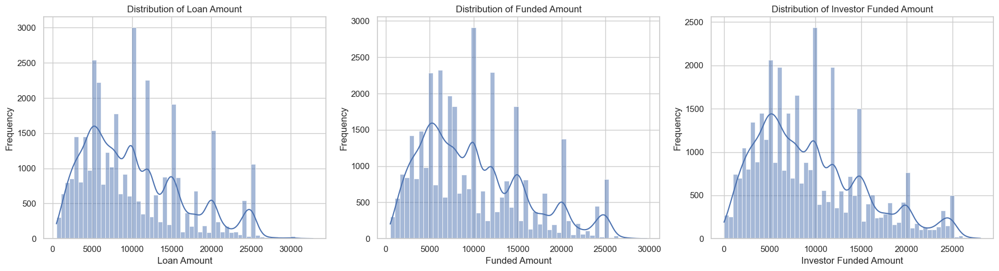

In [114]:
columns_of_interest = ['loan_amnt', 'funded_amnt', 'funded_amnt_inv']
titles = ['Loan Amount', 'Funded Amount', 'Investor Funded Amount']
plot_histplot(loan, columns_of_interest, titles)

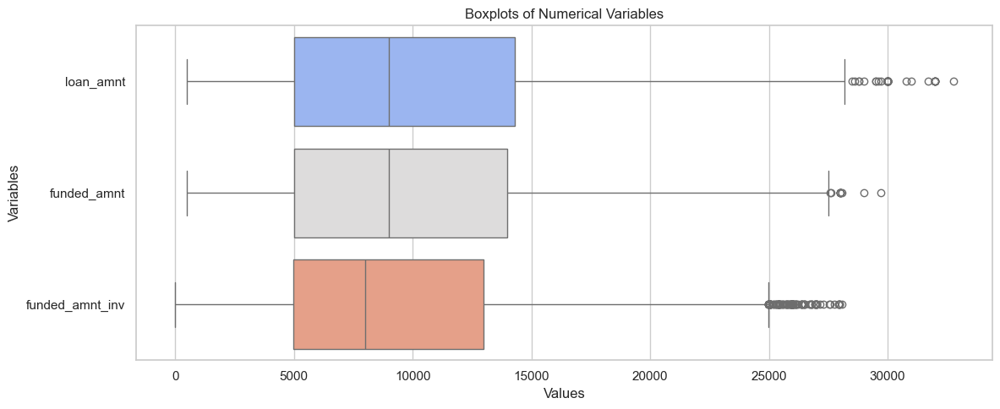

In [115]:
columns_of_interest = ['loan_amnt', 'funded_amnt', 'funded_amnt_inv']
plot_boxplot(loan, columns_of_interest)

In [116]:
column_of_interest = 'loan_amnt'
numeric_column_summary(loan, column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,10180.00,9000.00,10000.00,500.00,32775.00,5000.00,14300.00,32275.00,6202.27,0.76,-0.15,13950.00,10000.00,51


In [117]:
column_of_interest = 'funded_amnt'
numeric_column_summary(loan, column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,9941.60,9000.00,10000.00,500.00,29700.00,5000.00,14000.00,29200.00,5953.69,0.75,-0.14,11925.00,10000.00,11


In [118]:
column_of_interest = 'funded_amnt_inv'
numeric_column_summary(loan, column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,9418.02,8000.00,5000.00,0.00,28075.00,4975.00,12975.00,28075.00,5903.72,0.76,-0.07,5019.11,5000.00,210


#### Segemnted Univariate Analysis

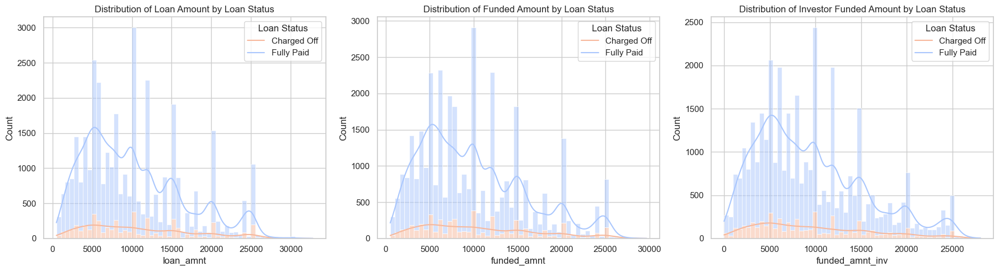

In [119]:
columns_of_interest = ['loan_amnt', 'funded_amnt', 'funded_amnt_inv']
titles = ['Loan Amount', 'Funded Amount', 'Investor Funded Amount']
plot_histplot_segmented(loan, columns_of_interest, titles)

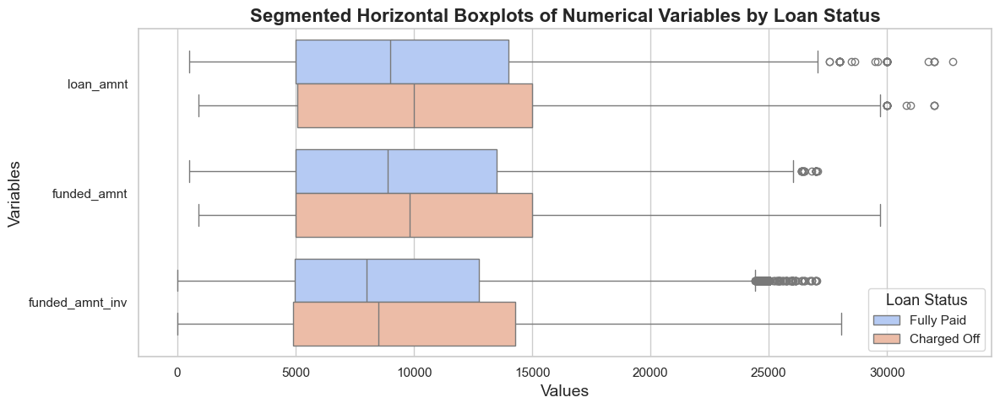

In [120]:
columns_of_interest = ['loan_amnt', 'funded_amnt', 'funded_amnt_inv']
plot_boxplot_segmented(loan, columns_of_interest)

In [121]:
column_of_interest = 'loan_amnt'
numeric_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,10058.80,9000.00,10000.00,500.00,32775.00,5000.00,14000.00,32275.00,6105.43,0.77,-0.11,11175.00,10000.00,44


In [122]:
column_of_interest = 'loan_amnt'
numeric_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,10905.82,10000.00,10000.00,900.00,32000.00,5056.25,15000.00,31100.00,6708.15,0.65,-0.44,11650.00,10000.00,17


In [123]:
column_of_interest = 'funded_amnt'
numeric_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,9832.48,8875.00,10000.00,500.00,27050.00,5000.00,13500.00,26550.00,5871.45,0.76,-0.08,11825.00,10000.00,23


In [124]:
column_of_interest = 'funded_amnt'
numeric_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,10595.12,9800.00,10000.00,900.00,29700.00,5000.00,15000.00,28800.00,6385.88,0.62,-0.45,9550.00,10000.00,0


In [125]:
column_of_interest = 'funded_amnt_inv'
numeric_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,9353.59,8000.00,5000.00,0.00,27025.00,4975.00,12750.00,27025.00,5830.45,0.77,-0.02,11613.67,5000.00,566


In [126]:
column_of_interest = 'funded_amnt_inv'
numeric_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,9803.90,8500.00,5000.00,0.00,28075.00,4900.00,14280.99,28075.00,6311.63,0.65,-0.38,4972.92,5000.00,0


> Upon examining the density distributions of all three features, it is evident that they exhibit strikingly **similar patterns**. Therefore, we can confidently proceed with analyzing any of these features. 

> Each feature has a specific description that outlines its role and importance within the dataset. Despite the similarity in distributions, 'loan_amnt' stands out because it is a Pre-Approval Attribute unlike the others. Hence, we have opted to advance our analysis using **'loan_amnt'**.

### _<a id='distribution-of-interest-rate'><font color='RebeccaPurple'>Distribution of Interest Rate</font></a>_ [▲](#top)

#### Univariate Analysis

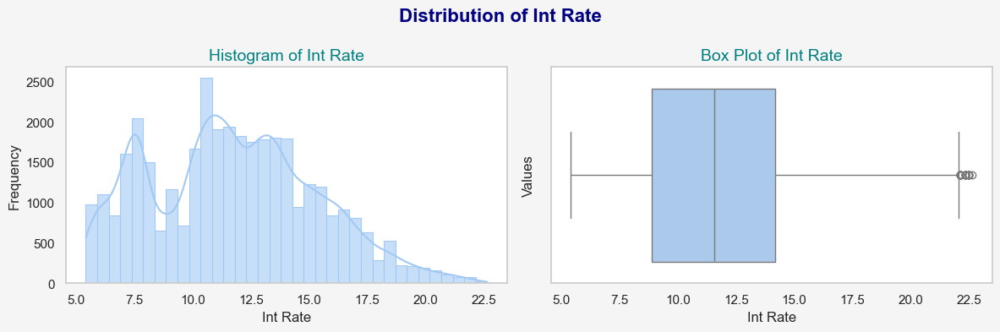

In [127]:
column_of_interest = 'int_rate'
univariate_numerical(loan, column_of_interest)

In [128]:
column_of_interest = 'int_rate'
numeric_column_summary(loan, column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,11.74,11.58,10.99,5.42,22.64,8.90,14.17,17.22,3.57,0.25,-0.52,13.84,10.99,34


#### Segmented Univariate Analysis

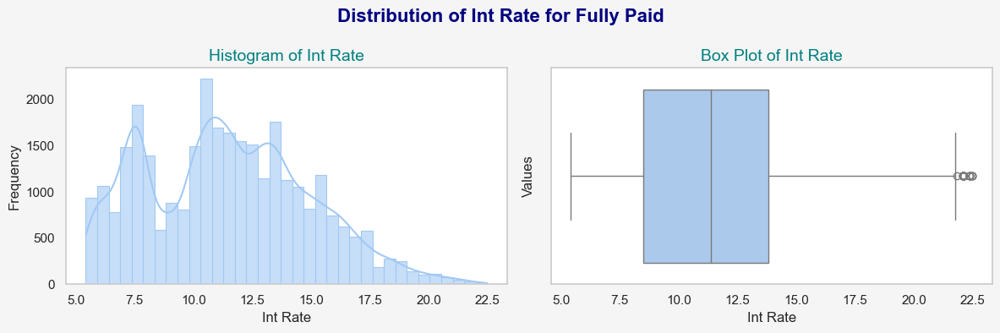

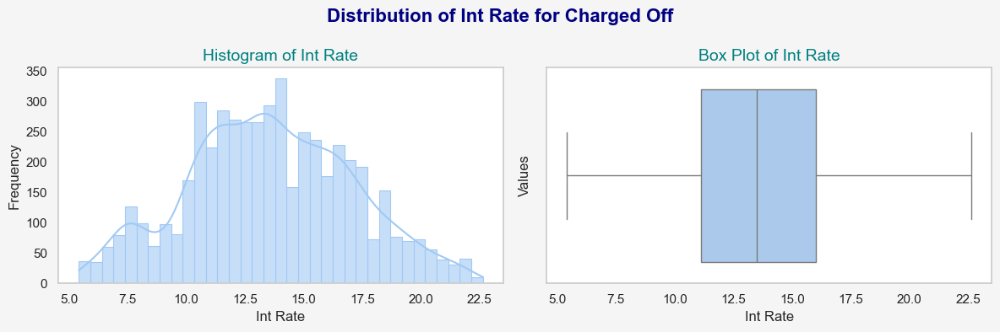

In [129]:
column_of_interest = 'int_rate'
univariate_numerical_segmented(loan, column_of_interest)

In [130]:
column_of_interest = 'int_rate'
numeric_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,11.43,11.36,10.99,5.42,22.48,8.49,13.80,17.06,3.49,0.28,-0.52,12.12,10.99,25


In [131]:
column_of_interest = 'int_rate'
numeric_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,13.56,13.49,11.49,5.42,22.64,11.11,16.00,17.22,3.52,0.04,-0.42,14.70,11.49,0


### _<a id='distribution-of-installment'><font color='RebeccaPurple'>Distribution of Installment</font></a>_ [▲](#top)

#### Univariate Analysis

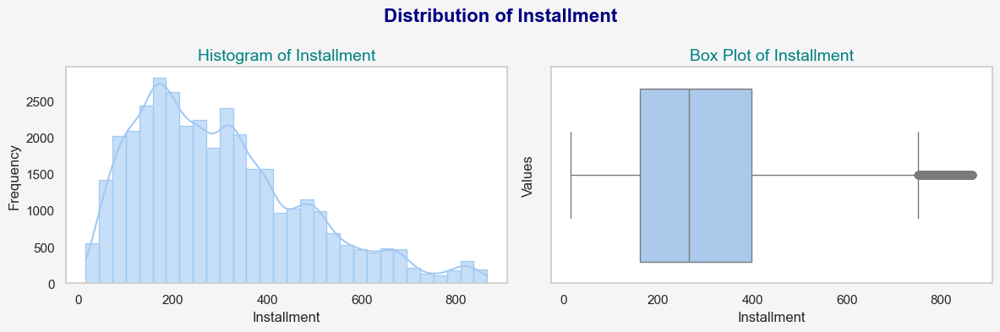

In [132]:
column_of_interest = 'installment'
univariate_numerical(loan, column_of_interest)

In [133]:
column_of_interest = 'installment'
numeric_column_summary(loan, column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,298.76,265.89,311.11,15.69,866.16,162.25,397.77,850.47,177.70,0.85,0.30,194.57,311.11,772


#### Segmented Univariate Analysis

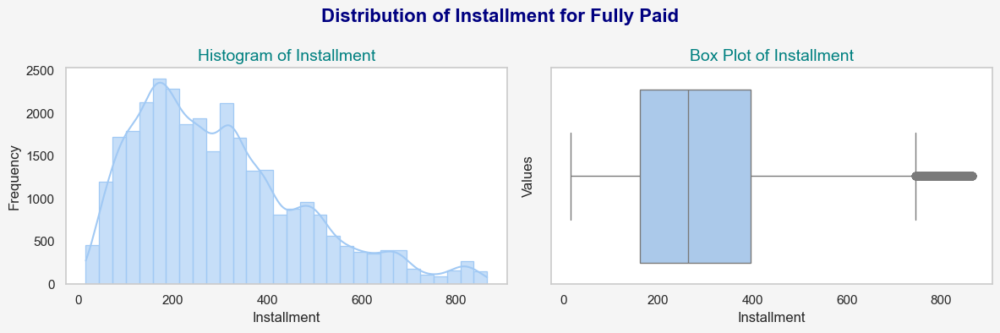

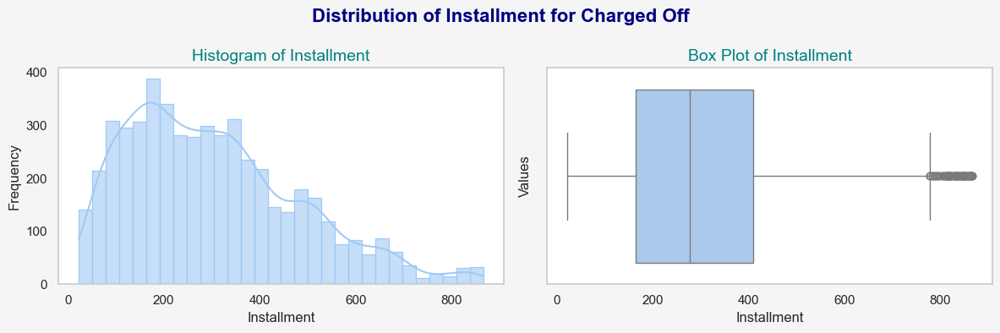

In [134]:
column_of_interest = 'installment'
univariate_numerical_segmented(loan, column_of_interest)

In [135]:
column_of_interest = 'installment'
numeric_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,297.88,263.88,311.11,15.69,866.16,162.14,395.67,850.47,177.43,0.87,0.35,186.02,311.11,713


In [136]:
column_of_interest = 'installment'
numeric_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,304.05,276.73,276.06,22.79,866.13,164.01,409.51,843.34,179.26,0.74,0.04,204.07,276.06,80


### _<a id='distribution-of-annual_income'><font color='RebeccaPurple'>Distribution of Annual Income</font></a>_ [▲](#top)

#### Univariate Analysis

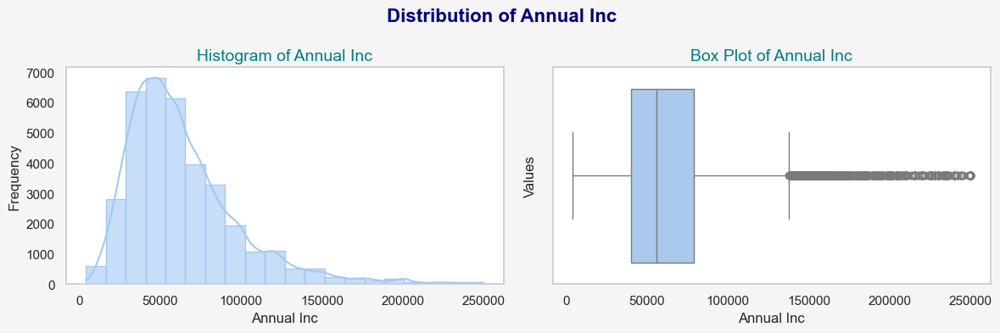

In [137]:
column_of_interest = 'annual_inc'
univariate_numerical(loan, column_of_interest)

In [138]:
column_of_interest = 'annual_inc'
numeric_column_summary(loan, column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,63690.23,56000.00,60000.00,4000.00,250000.00,40000.00,79000.00,246000.00,34666.93,1.55,3.55,48279.60,60000.00,1477


#### Segmented Univariate Analysis

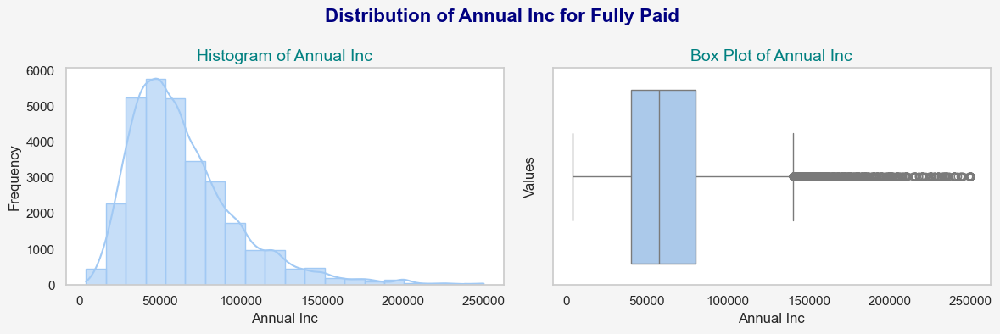

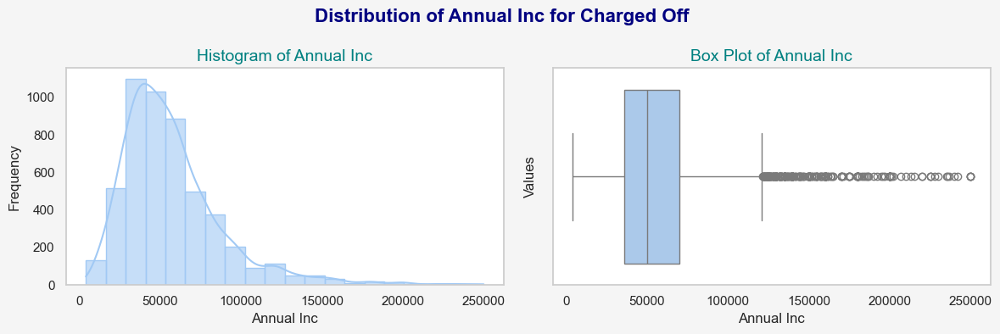

In [139]:
column_of_interest = 'annual_inc'
univariate_numerical_segmented(loan, column_of_interest)

In [140]:
column_of_interest = 'annual_inc'
numeric_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,64709.16,57455.00,60000.00,4000.00,250000.00,40000.00,80000.00,246000.00,34973.58,1.52,3.38,46776.00,60000.00,1158


In [141]:
column_of_interest = 'annual_inc'
numeric_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,57588.11,50004.00,60000.00,4080.00,250000.00,36000.00,70000.00,245920.00,32103.77,1.80,5.07,37732.83,60000.00,240


### _<a id='distribution-of-debt-to-income-ratio'><font color='RebeccaPurple'>Distribution of Debt-to-Income Ratio</font></a>_ [▲](#top)

#### Univariate Analysis

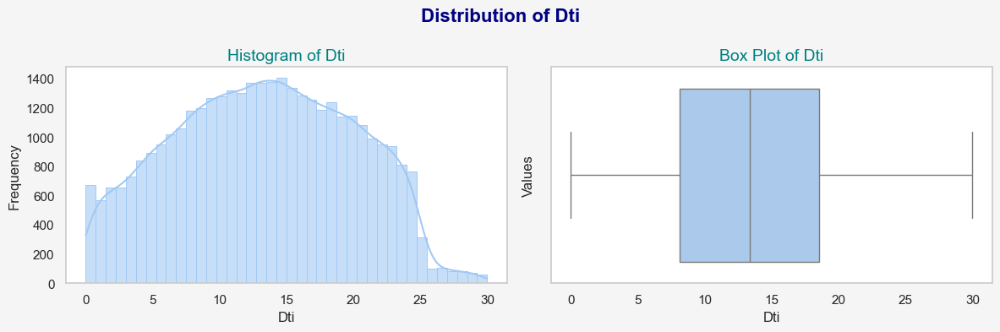

In [142]:
column_of_interest = 'dti'
univariate_numerical(loan, column_of_interest)

In [143]:
column_of_interest = 'dti'
numeric_column_summary(loan, column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,13.25,13.33,0.00,0.00,29.99,8.11,18.52,29.99,6.66,-0.02,-0.86,17.99,18.00,0


#### Segmented Univariate Analysis

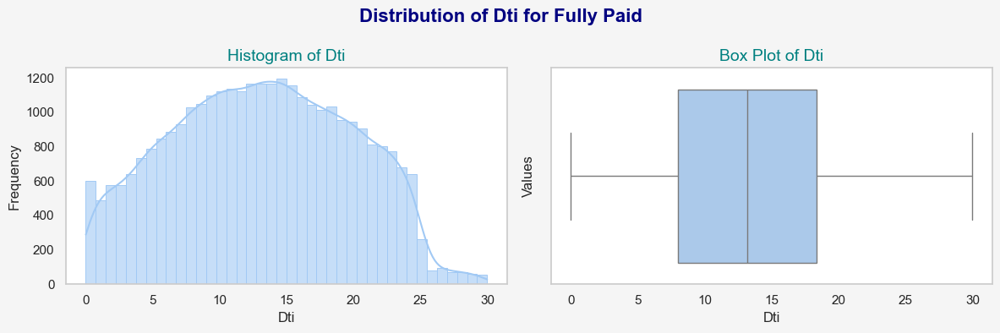

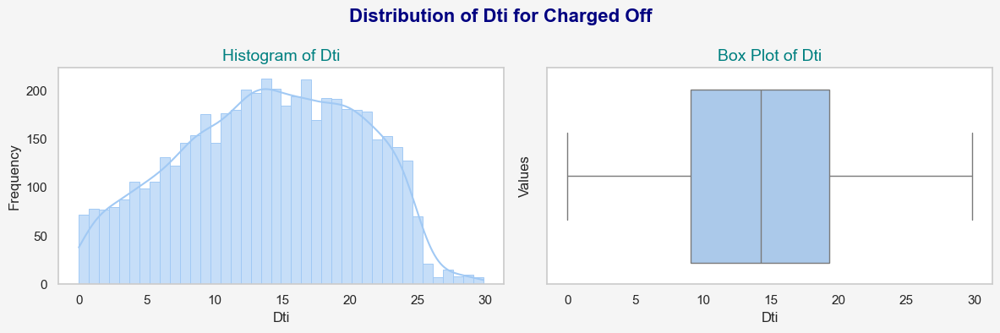

In [144]:
column_of_interest = 'dti'
univariate_numerical_segmented(loan, column_of_interest)

In [145]:
column_of_interest = 'dti'
numeric_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,13.13,13.16,0.00,0.00,29.99,7.97,18.35,29.99,6.67,0.00,-0.85,14.87,12.00,0


In [146]:
column_of_interest = 'dti'
numeric_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,13.99,14.27,0.00,0.00,29.85,9.06,19.28,29.85,6.57,-0.17,-0.82,15.15,18.00,0


### _<a id='distribution-of-utilization-rate'><font color='RebeccaPurple'>Distribution of Utilization Rate</font></a>_ [▲](#top)

#### Univariate Analysis

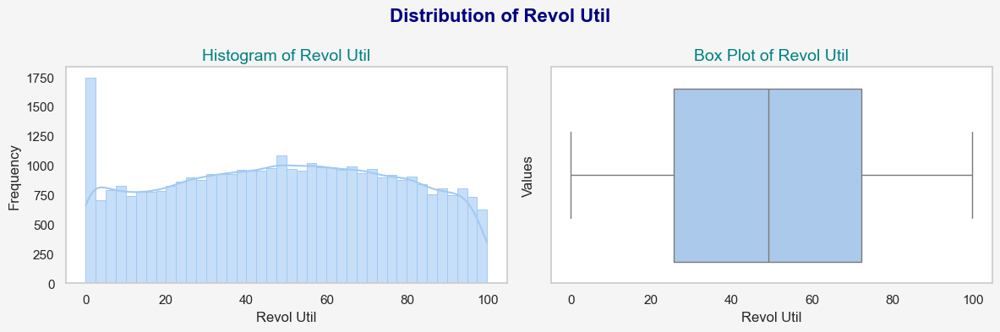

In [147]:
column_of_interest = 'revol_util'
univariate_numerical(loan, column_of_interest)

In [148]:
column_of_interest = 'revol_util'
numeric_column_summary(loan, column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,48.78,49.20,0.00,0.00,99.90,25.50,72.20,99.90,28.30,-0.03,-1.10,38.77,49.10,0


#### Segmented Univariate Analysis

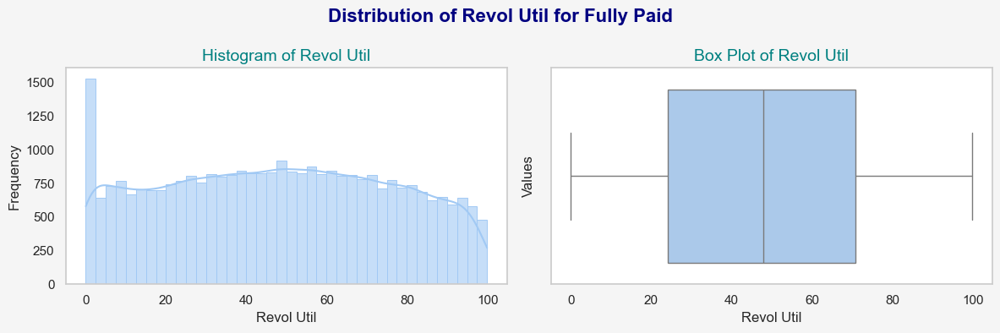

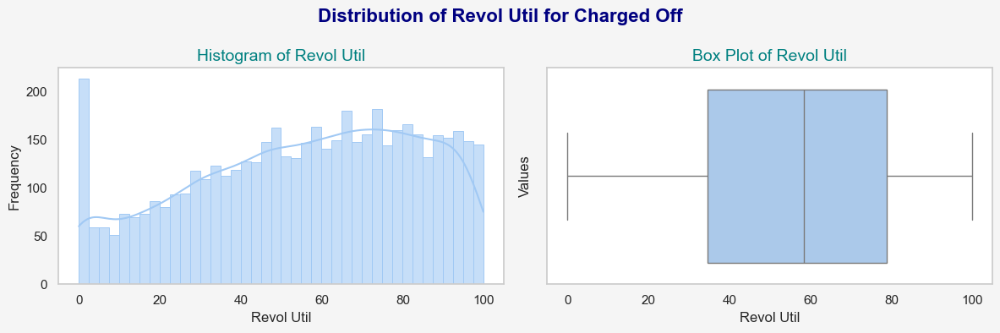

In [149]:
column_of_interest = 'revol_util'
univariate_numerical_segmented(loan, column_of_interest)

In [150]:
column_of_interest = 'revol_util'
numeric_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,47.64,47.80,0.00,0.00,99.90,24.10,70.80,99.90,28.23,0.01,-1.10,38.77,49.10,0


In [151]:
column_of_interest = 'revol_util'
numeric_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,55.63,58.40,0.00,0.00,99.90,34.62,78.80,99.90,27.72,-0.32,-0.91,54.22,49.10,0


### _<a id='distribution-of-months-since-ecr'><font color='RebeccaPurple'>Distribution of Months since Earliest Credit Line(ECR)</font></a>_ [▲](#top)

#### Univariate Analysis

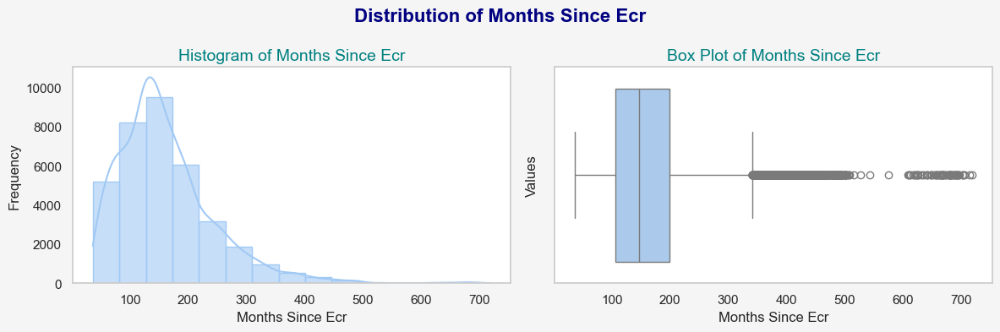

In [152]:
column_of_interest = 'months_since_ecr'
univariate_numerical(loan, column_of_interest)

In [153]:
column_of_interest = 'months_since_ecr'
numeric_column_summary(loan, column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,161.91,147.00,127.00,36.00,720.00,106.00,200.00,684.00,82.43,1.39,3.65,199.00,127.00,1273


#### Segmented Univariate Analysis

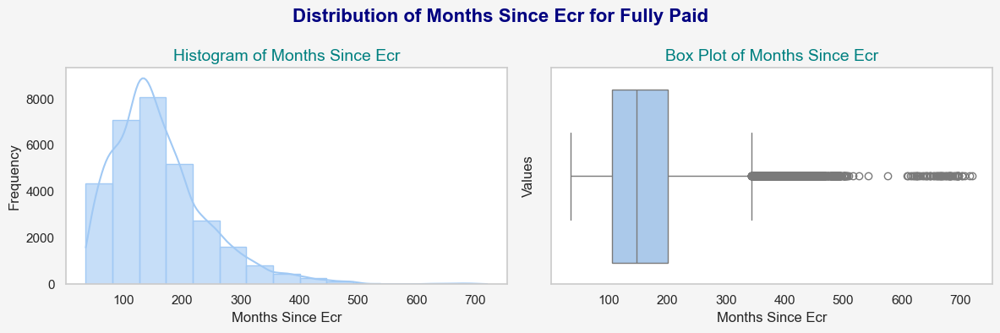

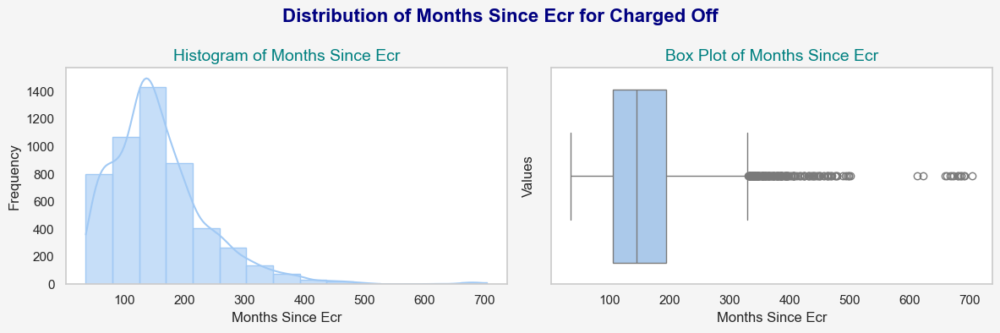

In [154]:
column_of_interest = 'months_since_ecr'
univariate_numerical_segmented(loan, column_of_interest)

In [155]:
column_of_interest = 'months_since_ecr'
numeric_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,162.48,147.00,129.00,36.00,720.00,106.00,201.00,684.00,82.43,1.37,3.44,201.00,129.00,1066


In [156]:
column_of_interest = 'months_since_ecr'
numeric_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,158.49,145.00,137.00,36.00,704.00,105.00,195.00,668.00,82.34,1.55,4.93,194.00,137.00,194


### _<a id='distribution-of-open-credit-lines'><font color='RebeccaPurple'>Distribution of Open Credit Lines</font></a>_ [▲](#top)

#### Univariate Analysis

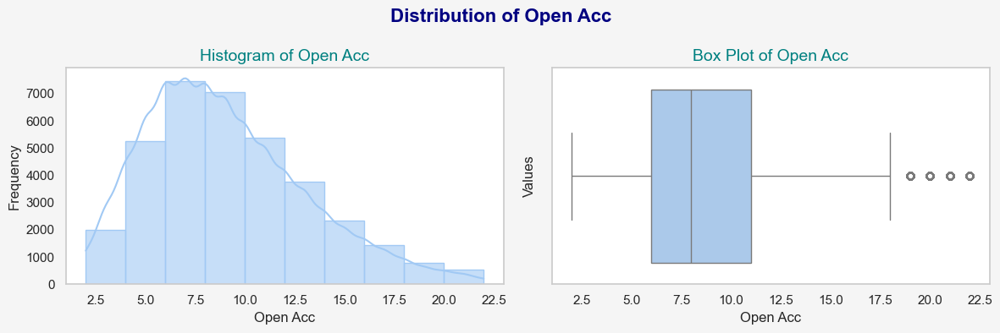

In [157]:
column_of_interest = 'open_acc'
univariate_numerical(loan, column_of_interest)

In [158]:
column_of_interest = 'open_acc'
summary_df = numeric_column_summary(loan, column_of_interest)
summary_df

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,8.99,8.00,7.00,2.00,22.00,6.00,11.00,20.00,4.04,0.68,0.11,11.00,7.00,851


#### Segmented Univariate Analysis

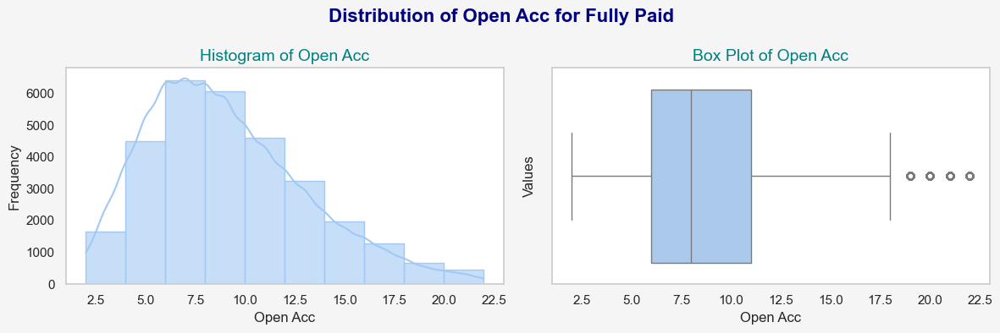

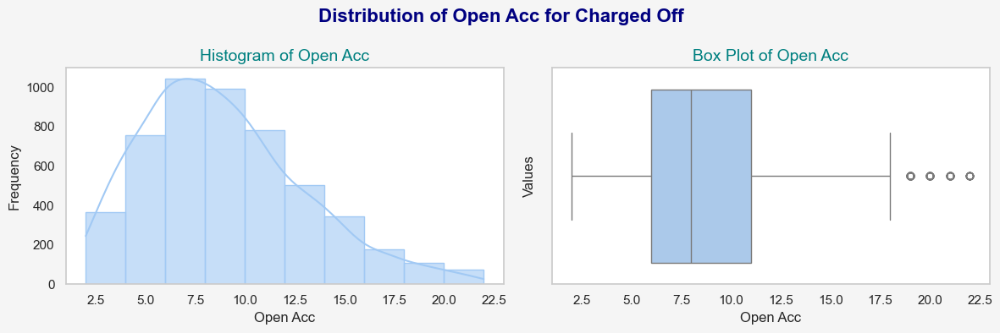

In [159]:
column_of_interest = 'open_acc'
univariate_numerical_segmented(loan, column_of_interest)

In [160]:
column_of_interest = 'open_acc'
summary_df = numeric_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)
summary_df

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,9.02,8.00,7.00,2.00,22.00,6.00,11.00,20.00,4.03,0.68,0.10,11.00,7.00,728


In [161]:
column_of_interest = 'open_acc'
summary_df = numeric_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)
summary_df

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,8.84,8.00,7.00,2.00,22.00,6.00,11.00,20.00,4.06,0.66,0.12,11.00,7.00,123


### _<a id='distribution-of-total-credit-lines'><font color='RebeccaPurple'>Distribution of Total Credit Lines</font></a>_ [▲](#top)

#### Univariate Analysis

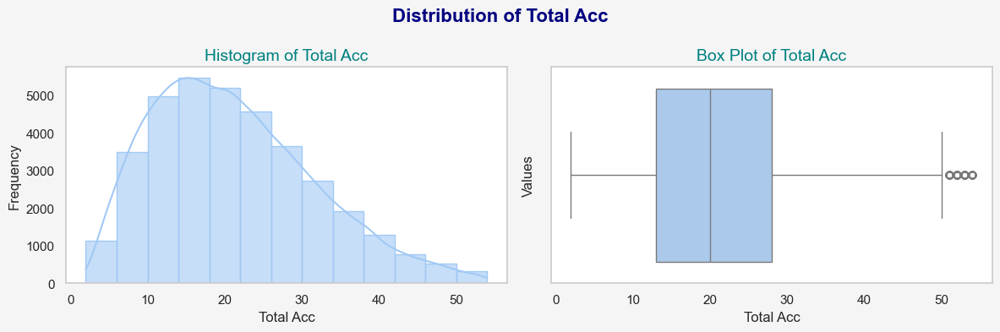

In [162]:
column_of_interest = 'total_acc'
univariate_numerical(loan, column_of_interest)

In [163]:
column_of_interest = 'total_acc'
summary_df = numeric_column_summary(loan, column_of_interest)
summary_df

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,21.14,20.00,16.00,2.00,54.00,13.00,28.00,52.00,10.47,0.61,-0.11,28.00,16.00,234


#### Segmented Univariate Analysis

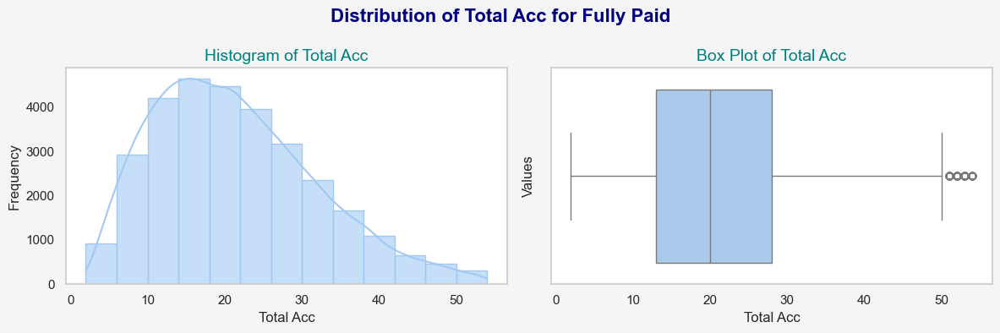

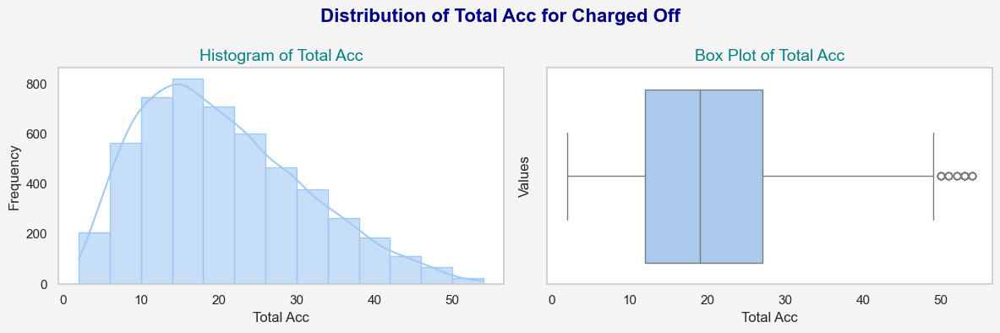

In [164]:
column_of_interest = 'total_acc'
univariate_numerical_segmented(loan, column_of_interest)

In [165]:
column_of_interest = 'total_acc'
summary_df = numeric_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)
summary_df

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,21.26,20.00,15.00,2.00,54.00,13.00,28.00,52.00,10.47,0.61,-0.09,28.00,15.00,215


In [166]:
column_of_interest = 'total_acc'
summary_df = numeric_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)
summary_df

Metric,Mean,Median,Mode,Min,Max,Q1,Q3,Range,STD,Skewness,Kurtosis,Minima,Maxima,Outliers
Value,20.43,19.00,14.00,2.00,54.00,12.00,27.00,52.00,10.47,0.61,-0.21,27.00,14.00,24


## <a id = 'categorical-variables'>B. Categorical Variables</a>

**Objective:**

Understand the distribution and characteristics of a categorical variable.

---

**Questions:**

- What is the distribution of categories within the variable?
- How frequently does each category occur?
- Are there any notable trends or patterns in the distribution?

---

**Methods:**

- **Bar Plot:** Plot a bar chart to visualize the count of each category.
- **Pie Chart:** Use a pie chart to show the percentage distribution of each category.
- **Count Table:** Create a table summarizing the count and percentage of each category.\

---

### KEY INSIGHTS FOR QUALITATIVE ATTRIBUTES

#### 1. **Term:**

- The majority of loans had a term of 36 months(77%), i.e. 3 years, and it was common among both defaulters and fully paid borrowers. 
- However, proportions differ: for fully paid borrowers, the ratio of 36-month to 60-month terms is 80:20, while for defaulters it is 60:40.

---

#### 2. **Loan Grade:**

- Loans with Grade B were the most frequent (31%) among both defaulters and fully paid borrowers, followed by A(27%) and C(21%). - However, loans with Grades A(30%), B(31%) and C(20%) were the most popular among fully paid borrowers whereas lower grades B(26%), C(25%), D(20%) were more common among defaulters.

---

#### 3. **Sub Grade:**

- Sub-Grades like A4, A5 and B3 were the most frequently issued. 
- Defaulters tended to have loans with lower sub-grades, i.e. B3, B4, B5, C1, C2 compared to those who fully repaid their loans who had loans of sub-grades, A4, A5 and B3.

---

#### 4. **Purpose:**

- The most common loan purpose was debt consolidation(46.5%). 
- Borrowers using loans for this purpose had a higher likelihood of default compared to other purposes like home improvement or medical expenses. 
- 48% defaulters and 46 fully paid borrowers specified debt consolidation as their loan purpose.

---

#### 5. **Employment Length:**

- Most borrowers had an employment length of more than 10 years(24%). 
- Borrowers with higher employment lengths had a higher rate of default compared to those with shorter employment durations. 
- 27% defaulters and 23% fully paid borrowers more than 10 years of employment lengths.

---

#### 6. **Income Category:**

- The majority of borrowers fell into the Medium income category(46%), followed by Low income category(42%). 
- Defaulters were more likely to be in the Low income category(50%), whereas fully paid borrowers were predominantly in the Medium income category(46.5%).

---

#### 7. **Home Ownership:**

- Most borrowers were either renters(49%) or had mortgages(43%). Defaulters were more likely to be renters(52%) compared to those who fully repaid their loans(49%).

---

#### 8. **Verification Status:**

- Most borrowers were Not-Verified(45%). 40% defaulters were not-verified and 34% defaulters were verified, whereas 46% fully paid borrowers were not-verified and 29% were verified. This suggests that verification status may not effectively identify those who default.

---

#### 9. **Region:**

- The majority of loans originated from the western regions such as the West(30%) and the MidWest(14%). Propertion of Loans emerging in these regions are similar for both Defaulters and Fully Paid Borrowers.

---

#### 10. **Address State:**

- Loans were most commonly issued in states like California, (CA: 18%), New York (NY: 9.5%), Texas(TX: 7%), Florida (FL: 7%). Propertion of Loans emerging in these states are similar for both Defaulters and Fully Paid Borrowers.

---

#### 11. **Inquiries in the Past 6 Months:**

- Borrowers with one(28%) or no(49%) inquiries in the past 6 months were most common. 
- It is difficult to identify default rate patterns because 50.5% of the defaulters had no inquiries in the past 6 months.

---

#### 12. **Issue Year:**

- Loans issued had been increase subsequently year on year between 2007 and 2011 in recent years, and year 2011 saw 20% increase in loan issuance and with it we saw a higher incidence of default (20% increase) compared to 2010.

---

#### 13. **Issue Month:**

- The majority of loans were issued increases month-on-month every year, peaking in December. Defaults varied slightly by month, sharing a similar trend with the average.
---

#### 14. **Issue Quarter:**

- Loans issued in the fourth quarter had a higher rate of default compared to loans issued in other quarters but similar trend is seen in the loans issued to fully paid borrowers as well.

---

### **OUTCOME:**

Based on the Univariate and Segmented Univariate Analysis, we can conclude that the following qualitative attributes may be the **categorical indicators** for charged-off loans:

1. <span style="color:red; font-size:16px;"><strong>Term</strong></span>
2. <span style="color:green; font-size:16px;"><strong>Loan Grade</strong></span>
3. <span style="color:purple; font-size:16px;"><strong>Purpose</strong></span>
4. <span style="color:orange; font-size:16px;"><strong>Employment Length</strong></span>
5. <span style="color:blue; font-size:16px;"><strong>Income Category</strong></span>
6. <span style="color:darkred; font-size:16px;"><strong>Home Ownership</strong></span>
7. <span style="color:darkgreen; font-size:16px;"><strong>Verification Status</strong></span>
8. <span style="color:darkviolet; font-size:16px;"><strong>Region</strong></span>


### _<a id='distribution-of-term'><font color='RebeccaPurple'>Distribution of Term</font></a>_ [▲](#top)

#### Univariate Analysis

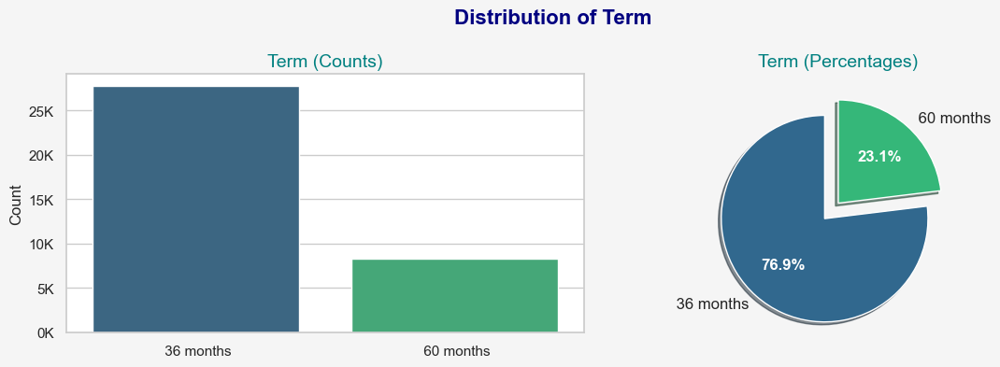

In [167]:
column_of_interest = 'term'
univariate_categorical(loan, column_of_interest)

In [168]:
column_of_interest = 'term'
categorical_column_summary(loan, column_of_interest)

Category,36 months,60 months
Count,27690,8302
Proportion (%),76.933763,23.066237


#### Segmented Univariate Analysis

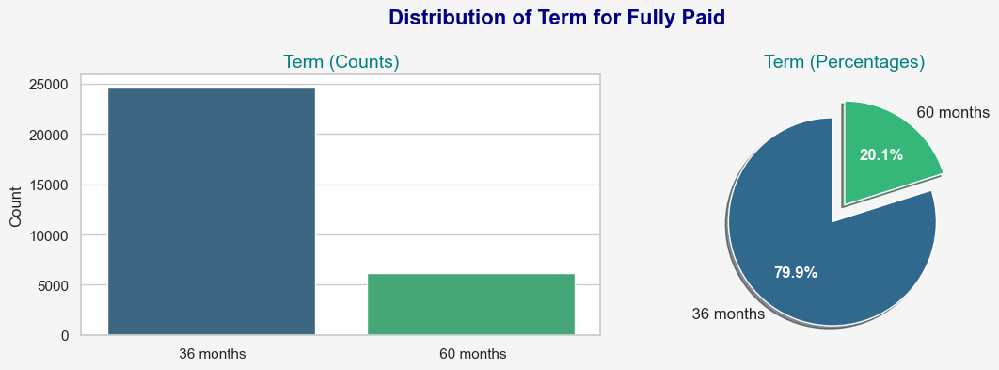

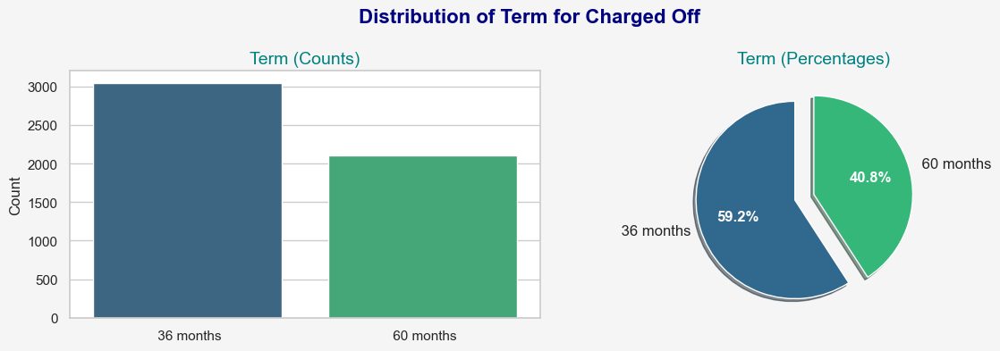

In [169]:
column_of_interest = 'term'
univariate_categorical_segmented(loan, column_of_interest)

In [170]:
column_of_interest = 'term'
categorical_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Category,36 months,60 months
Count,24643,6199
Proportion (%),79.900785,20.099215


In [171]:
column_of_interest = 'term'
categorical_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)

Category,36 months,60 months
Count,3047,2103
Proportion (%),59.165049,40.834951


### _<a id='distribution-of-grade'><font color='RebeccaPurple'>Distribution of Loan Grade</font></a>_ [▲](#top)

#### Univariate Analysis

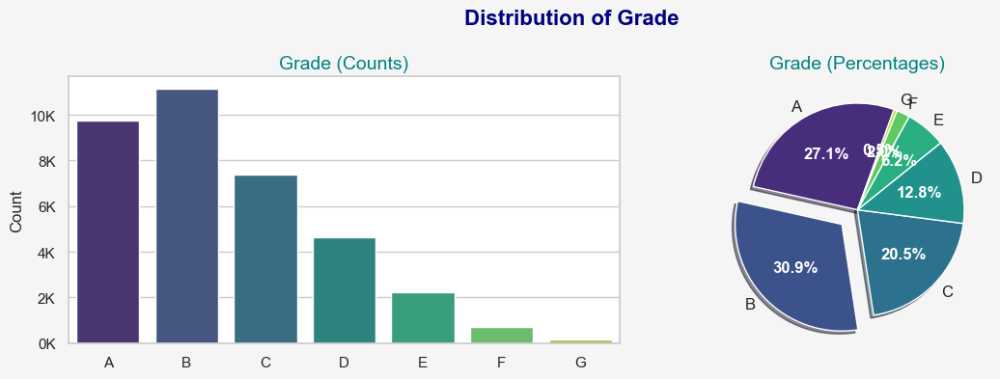

In [172]:
column_of_interest = 'grade'
univariate_categorical(loan, column_of_interest)

In [173]:
column_of_interest = 'grade'
categorical_column_summary(loan, column_of_interest)

Category,B,A,C,D,E,F,G
Count,11126,9736,7396,4622,2215,730,167
Proportion (%),30.912425,27.050456,20.549011,12.841743,6.154145,2.028228,0.463992


#### Segmented Univariate Analysis

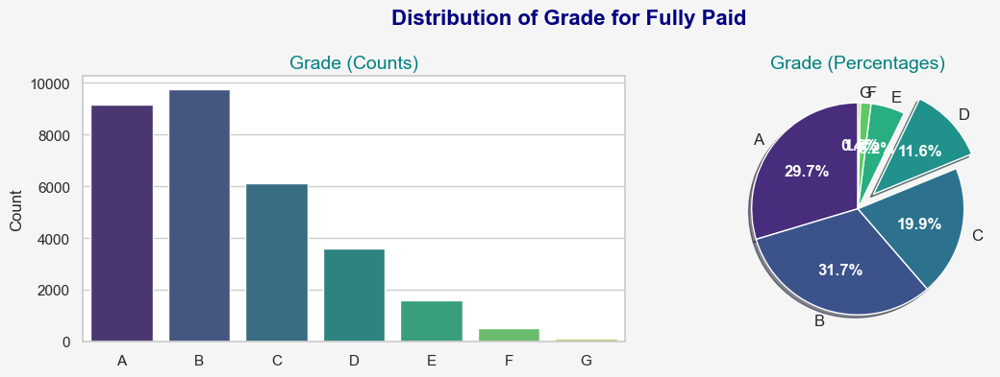

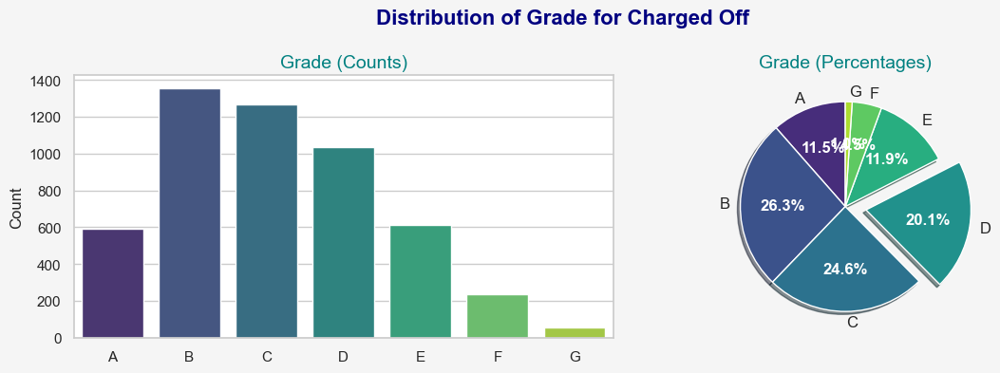

In [174]:
column_of_interest = 'grade'
univariate_categorical_segmented(loan, column_of_interest)

In [175]:
column_of_interest = 'grade'
categorical_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Category,B,A,C,D,E,F,G
Count,9770,9145,6129,3586,1603,496,113
Proportion (%),31.677583,29.651125,19.872252,11.627002,5.197458,1.608197,0.366384


In [176]:
column_of_interest = 'grade'
categorical_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)

Category,B,C,D,E,A,F,G
Count,1356,1267,1036,612,591,234,54
Proportion (%),26.330097,24.601942,20.116505,11.883495,11.475728,4.543689,1.048544


### _<a id='distribution-of-sub-grade'><font color='RebeccaPurple'>Distribution of Sub Grade</font></a>_ [▲](#top)

#### Univariate Analysis

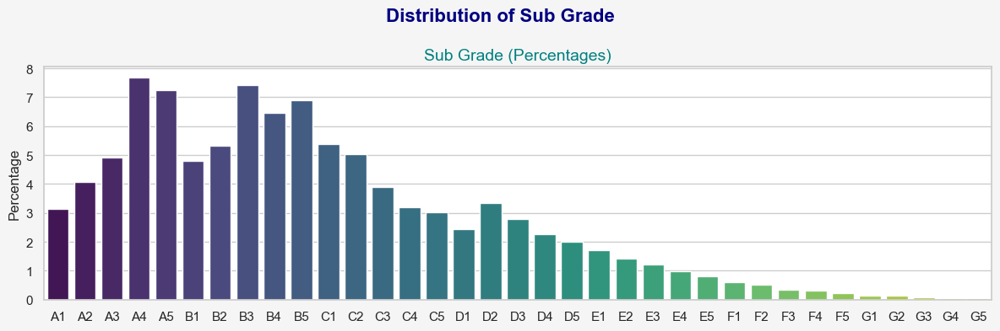

In [177]:
column_of_interest='sub_grade'
univariate_categorical_percentage(loan, column_of_interest)

In [178]:
column_of_interest = 'sub_grade'
categorical_column_summary(loan, column_of_interest)

Category,A4,B3,A5,B5,B4,C1,B2,C2,A3,B1,A2,C3,D2,C4,A1,C5,D3,D1,D4,D5,E1,E2,E3,E4,E5,F1,F2,F3,F4,F5,G2,G1,G3,G4,G5
Count,2760,2670,2613,2487,2327,1942,1918,1815,1766,1724,1466,1399,1208,1154,1131,1086,1005,880,813,716,612,516,436,357,294,221,191,127,113,78,51,51,27,23,15
Proportion (%),7.668371,7.418315,7.259947,6.909869,6.465326,5.395643,5.328962,5.042787,4.906646,4.789953,4.073127,3.886975,3.356301,3.206268,3.142365,3.017337,2.792287,2.444988,2.258835,1.989331,1.700378,1.433652,1.21138,0.991887,0.816848,0.614025,0.530673,0.352856,0.313959,0.216715,0.141698,0.141698,0.075017,0.063903,0.041676


#### Segmented Univariate Analysis

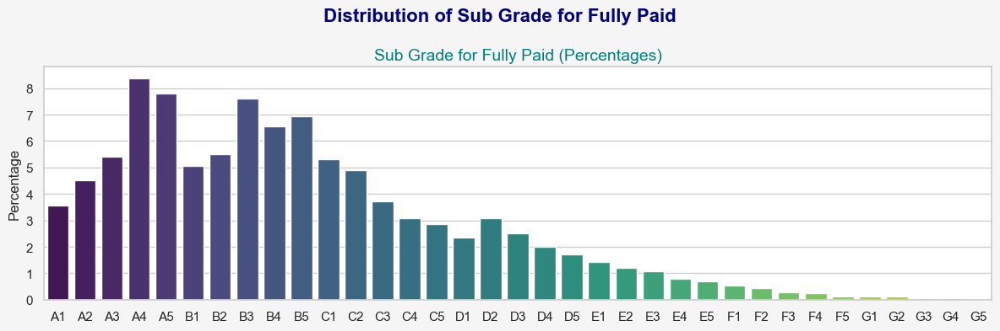

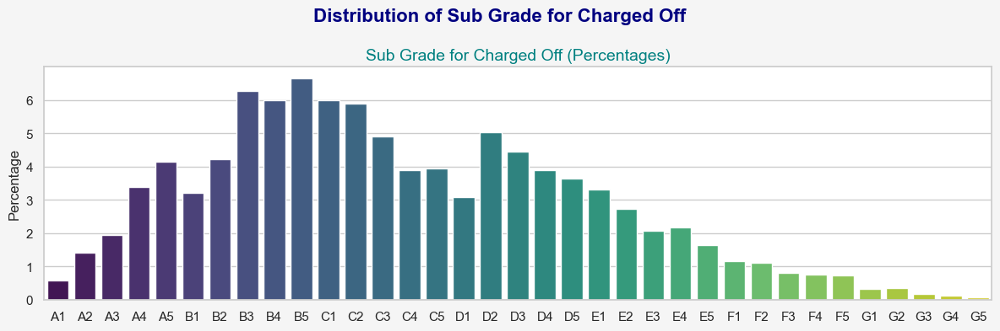

In [179]:
column_of_interest='sub_grade'
univariate_categorical_percentage_segmented(loan, column_of_interest)

In [180]:
column_of_interest = 'sub_grade'
categorical_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Category,A4,A5,B3,B5,B4,B2,A3,C1,B1,C2,A2,C3,A1,C4,D2,C5,D3,D1,D4,D5,E1,E2,E3,E4,E5,F1,F2,F3,F4,F5,G1,G2,G3,G4,G5
Count,2585,2400,2347,2144,2019,1701,1666,1634,1559,1511,1393,1147,1101,954,949,883,776,721,612,528,442,376,330,245,210,161,134,86,74,41,34,33,18,17,11
Proportion (%),8.381428,7.781597,7.609753,6.95156,6.546268,5.515207,5.401725,5.29797,5.054795,4.899163,4.516568,3.718955,3.569807,3.093185,3.076973,2.862979,2.51605,2.337721,1.984307,1.711951,1.433111,1.219117,1.06997,0.794371,0.68089,0.522015,0.434472,0.278841,0.239933,0.132936,0.110239,0.106997,0.058362,0.05512,0.035666


In [181]:
column_of_interest = 'sub_grade'
categorical_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)

Category,B5,B3,C1,B4,C2,D2,C3,D3,B2,A5,C5,D4,C4,D5,A4,E1,B1,D1,E2,E4,E3,A3,E5,A2,F1,F2,F3,F4,F5,A1,G2,G1,G3,G4,G5
Count,343,323,308,308,304,259,252,229,217,213,203,201,200,188,175,170,165,159,140,112,106,100,84,73,60,57,41,39,37,30,18,17,9,6,4
Proportion (%),6.660194,6.271845,5.980583,5.980583,5.902913,5.029126,4.893204,4.446602,4.213592,4.135922,3.941748,3.902913,3.883495,3.650485,3.398058,3.300971,3.203883,3.087379,2.718447,2.174757,2.058252,1.941748,1.631068,1.417476,1.165049,1.106796,0.796117,0.757282,0.718447,0.582524,0.349515,0.330097,0.174757,0.116505,0.07767


### _<a id='distribution-of-Purpose'><font color='RebeccaPurple'>Distribution of Purpose</font></a>_ [▲](#top)

#### Univariate Analysis

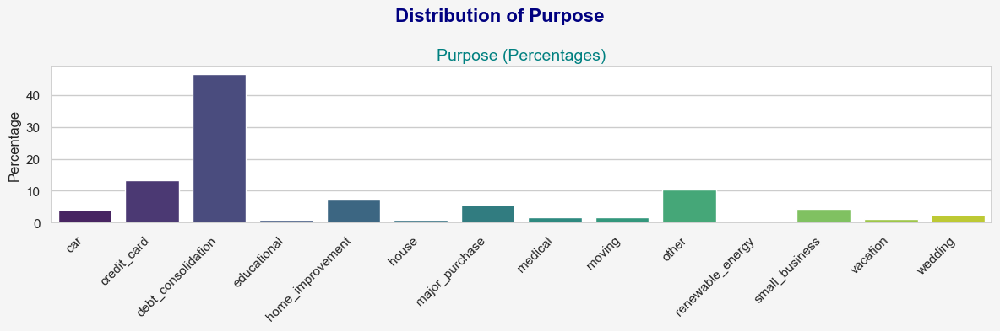

In [182]:
column_of_interest='purpose'
univariate_categorical_percentage(loan, column_of_interest)

In [183]:
column_of_interest = 'purpose'
categorical_column_summary(loan, column_of_interest)

Category,debt_consolidation,credit_card,other,home_improvement,major_purchase,small_business,car,wedding,medical,moving,vacation,house,educational,renewable_energy
Count,16721,4743,3695,2577,2068,1538,1453,893,650,558,368,324,310,94
Proportion (%),46.457546,13.177928,10.26617,7.159924,5.745721,4.273172,4.037008,2.481107,1.805957,1.550345,1.022449,0.9002,0.861303,0.261169


#### Segmented Univariate Analysis

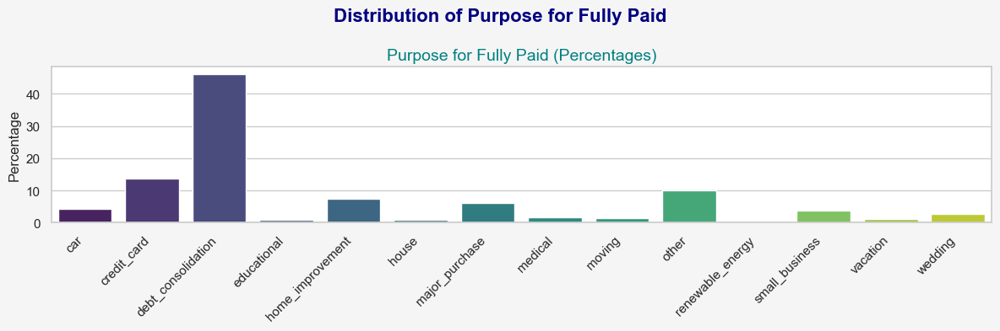

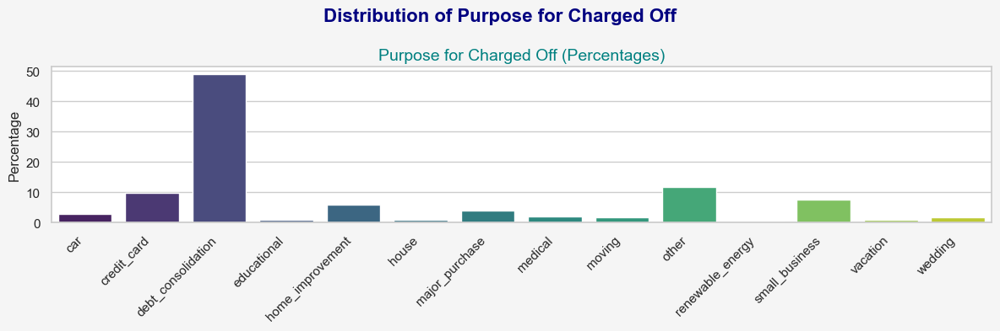

In [184]:
column_of_interest='purpose'
univariate_categorical_percentage_segmented(loan, column_of_interest)

In [185]:
column_of_interest = 'purpose'
categorical_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Category,debt_consolidation,credit_card,other,home_improvement,major_purchase,car,small_business,wedding,medical,moving,vacation,house,educational,renewable_energy
Count,14201,4239,3094,2267,1857,1298,1140,803,551,469,315,274,257,77
Proportion (%),46.044355,13.744245,10.031775,7.350366,6.02101,4.208547,3.696258,2.603593,1.786525,1.520654,1.021335,0.888399,0.833279,0.24966


In [186]:
column_of_interest = 'purpose'
categorical_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)

Category,debt_consolidation,other,credit_card,small_business,home_improvement,major_purchase,car,medical,wedding,moving,vacation,educational,house,renewable_energy
Count,2520,601,504,398,310,211,155,99,90,89,53,53,50,17
Proportion (%),48.932039,11.669903,9.786408,7.728155,6.019417,4.097087,3.009709,1.92233,1.747573,1.728155,1.029126,1.029126,0.970874,0.330097


### _<a id='distribution-of-employment-length'><font color='RebeccaPurple'>Distribution of Employment Length</font></a>_ [▲](#top)

#### Univariate Analysis

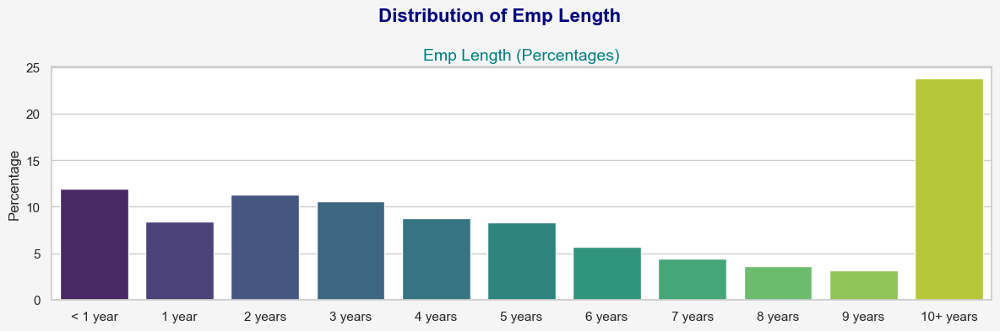

In [187]:
column_of_interest='emp_length'
univariate_categorical_percentage(loan, column_of_interest)

In [188]:
column_of_interest = 'emp_length'
categorical_column_summary(loan, column_of_interest)

Category,10.0,0.0,2.0,3.0,4.0,1.0,5.0,6.0,7.0,8.0,9.0
Count,8573.000000,4294.000000,4071.000000,3811.000000,3149.000000,3007.000000,2994.000000,2039.000000,1593.000000,1311.000000,1150.000000
Proportion (%),23.819182,11.930429,11.310847,10.588464,8.749166,8.354634,8.318515,5.665148,4.425984,3.642476,3.195154


#### Segmented Univariate Analysis

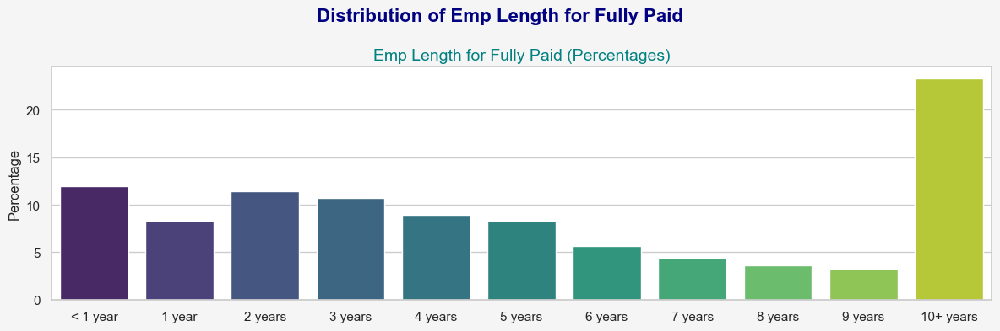

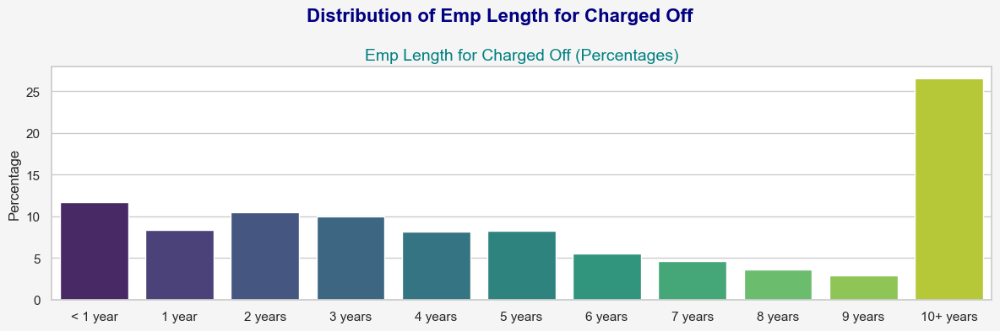

In [189]:
column_of_interest='emp_length'
univariate_categorical_percentage_segmented(loan, column_of_interest)

In [190]:
column_of_interest = 'emp_length'
categorical_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Category,10.0,0.0,2.0,3.0,4.0,1.0,5.0,6.0,7.0,8.0,9.0
Count,7205.000000,3694.000000,3534.000000,3295.000000,2728.000000,2579.000000,2570.000000,1754.00000,1357.000000,1124.000000,1002.000000
Proportion (%),23.361001,11.977174,11.458401,10.683484,8.845081,8.361974,8.332793,5.68705,4.399844,3.644381,3.248817


In [191]:
column_of_interest = 'emp_length'
categorical_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)

Category,10.0,0.0,2.0,3.0,1.0,5.0,4.0,6.0,7.0,8.0,9.0
Count,1368.000000,600.000000,537.000000,516.000000,428.00000,424.00000,421.000000,285.000000,236.000000,187.000000,148.000000
Proportion (%),26.563107,11.650485,10.427184,10.019417,8.31068,8.23301,8.174757,5.533981,4.582524,3.631068,2.873786


### _<a id='distribution-of-income-category'><font color='RebeccaPurple'>Distribution of Income Category</font></a>_ [▲](#top)

#### Univariate Analysis

Based on the Boxplot of Annual Income, we divided the Annual Income into the following 3 Buckets:

- **Low Income Category:** 0 - 50000
- **Medium Income Category:** 50000 - 100000
- **High Income Category:** 100000 and above

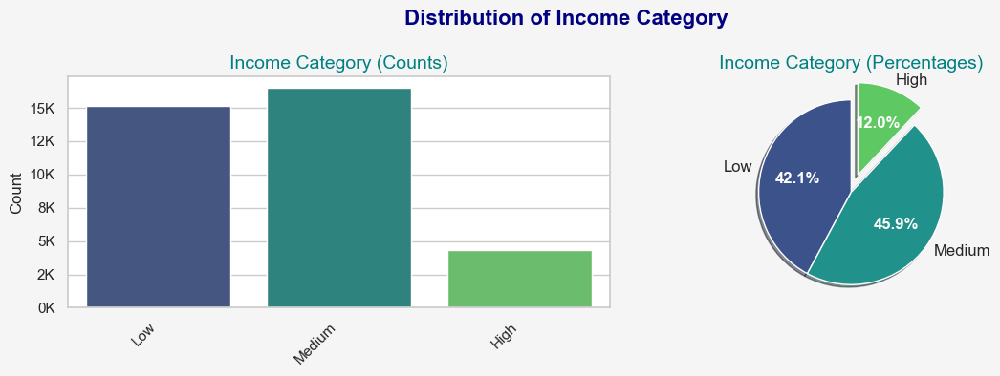

In [192]:
column_of_interest = 'income_category'
univariate_categorical(loan, column_of_interest)

In [193]:
column_of_interest = 'income_category'
categorical_column_summary(loan, column_of_interest)

Category,1.0,0.0,2.0
Count,16508.000000,15168.000000,4316.000000
Proportion (%),45.865748,42.142698,11.991554


#### Segmented Univariate Analysis

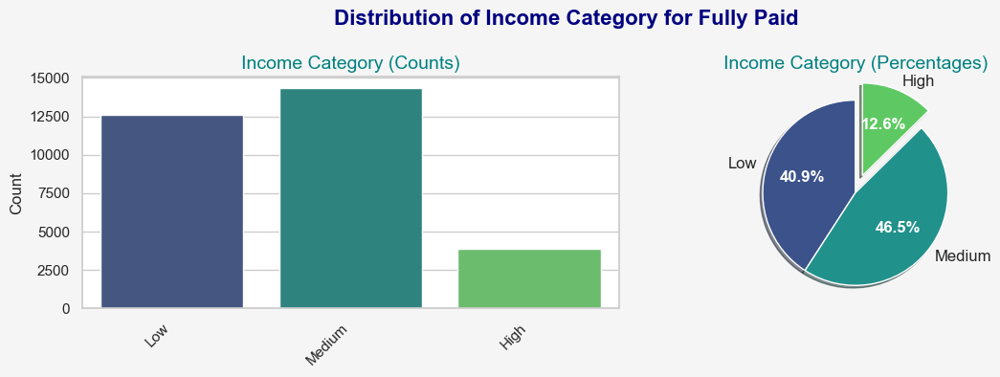

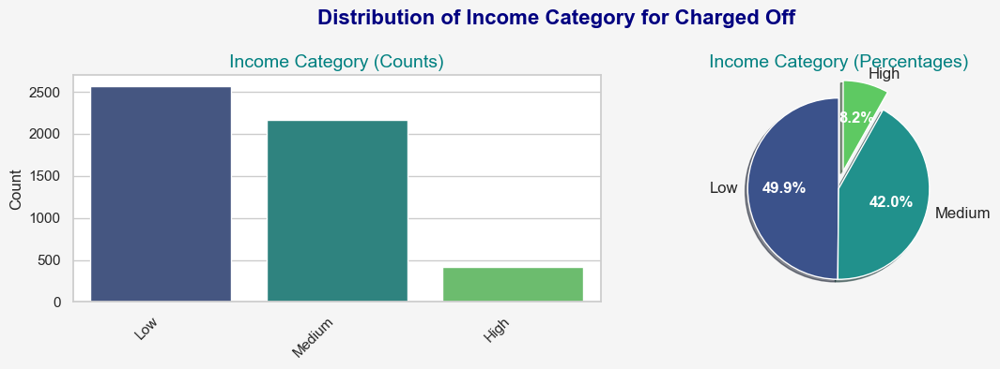

In [194]:
column_of_interest = 'income_category'
univariate_categorical_segmented(loan, column_of_interest)

In [195]:
column_of_interest = 'income_category'
categorical_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Category,1.0,0.0,2.0
Count,14346.000000,12600.000000,3896.000000
Proportion (%),46.514493,40.853382,12.632125


In [196]:
column_of_interest = 'income_category'
categorical_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)

Category,0.0,1.0,2.0
Count,2568.000000,2162.000000,420.00000
Proportion (%),49.864078,41.980583,8.15534


### _<a id='distribution-of-home-ownership'><font color='RebeccaPurple'>Distribution of Home Ownership</font></a>_ [▲](#top)

#### Univariate Analysis

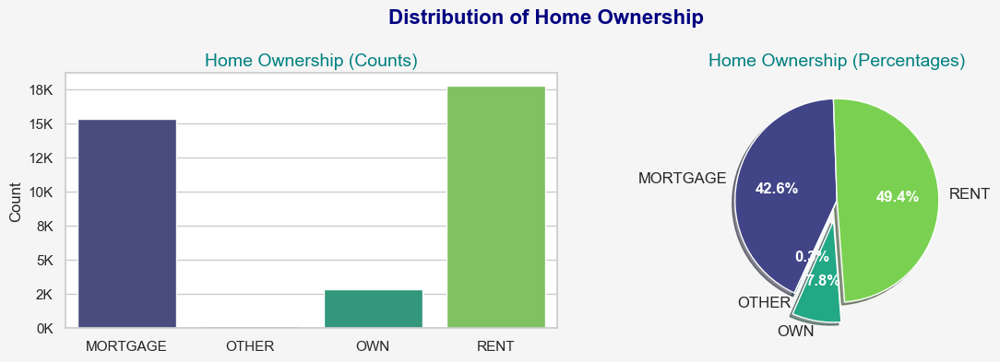

In [197]:
column_of_interest = 'home_ownership'
univariate_categorical(loan, column_of_interest)

In [198]:
column_of_interest = 'home_ownership'
categorical_column_summary(loan, column_of_interest)

Category,RENT,MORTGAGE,OWN,OTHER
Count,17765,15329,2800,98
Proportion (%),49.358191,42.59002,7.779507,0.272283


#### Segmented Univariate Analysis

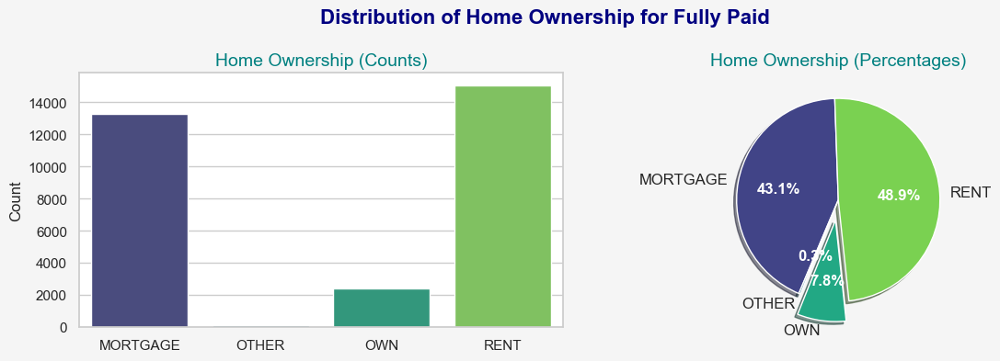

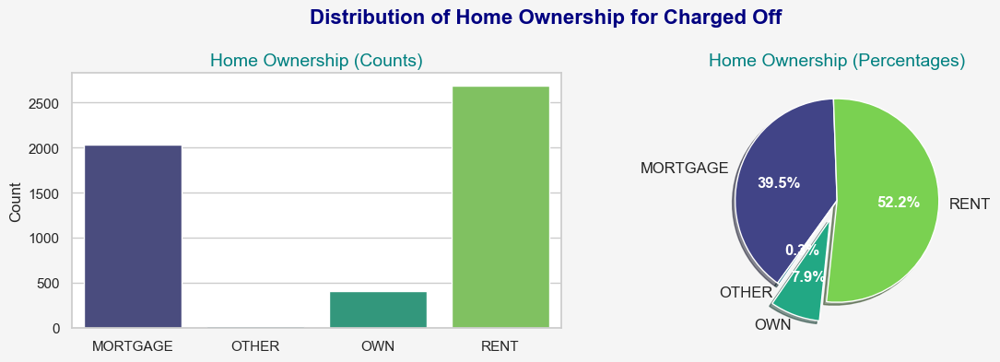

In [199]:
column_of_interest = 'home_ownership'
univariate_categorical_segmented(loan, column_of_interest)

In [200]:
column_of_interest = 'home_ownership'
categorical_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Category,RENT,MORTGAGE,OWN,OTHER
Count,15076,13294,2391,81
Proportion (%),48.881395,43.10356,7.752416,0.262629


In [201]:
column_of_interest = 'home_ownership'
categorical_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)

Category,RENT,MORTGAGE,OWN,OTHER
Count,2689,2035,409,17
Proportion (%),52.213592,39.514563,7.941748,0.330097


### _<a id='distribution-of-verification-status'><font color='RebeccaPurple'>Distribution of Verification Status</font></a>_ [▲](#top)

#### Univariate Analysis

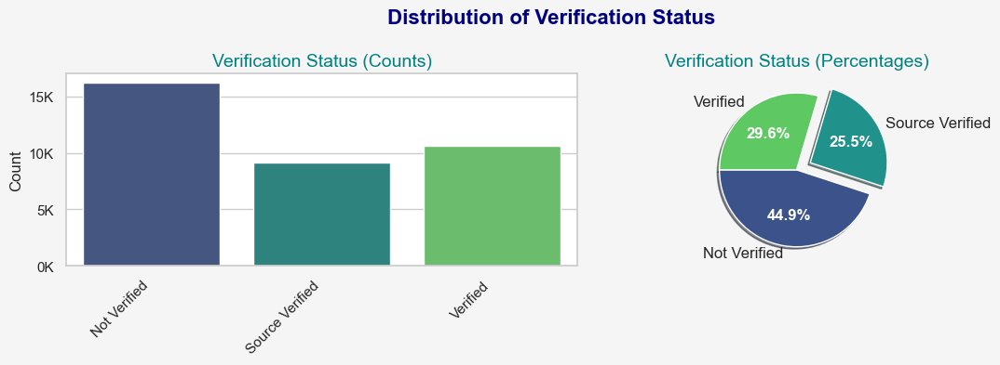

In [202]:
column_of_interest = 'verification_status'
univariate_categorical(loan, column_of_interest)

In [203]:
column_of_interest = 'verification_status'
categorical_column_summary(loan, column_of_interest)

Category,0.0,2.0,1.0
Count,16176.000000,10639.000000,9177.000000
Proportion (%),44.943321,29.559347,25.497333


#### Segmented Univariate Analysis

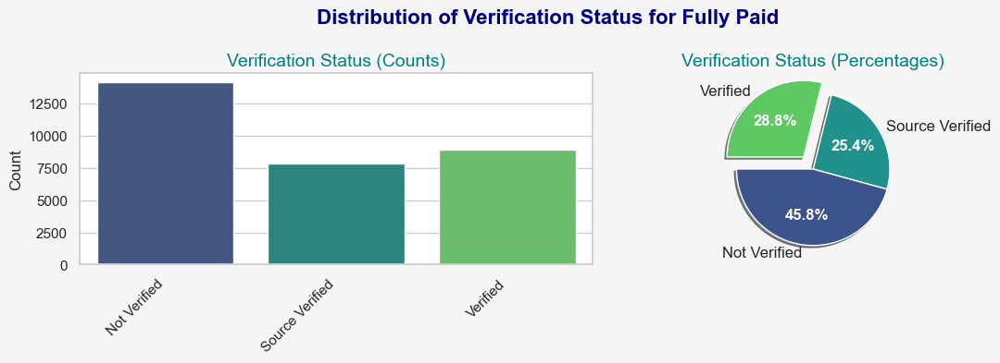

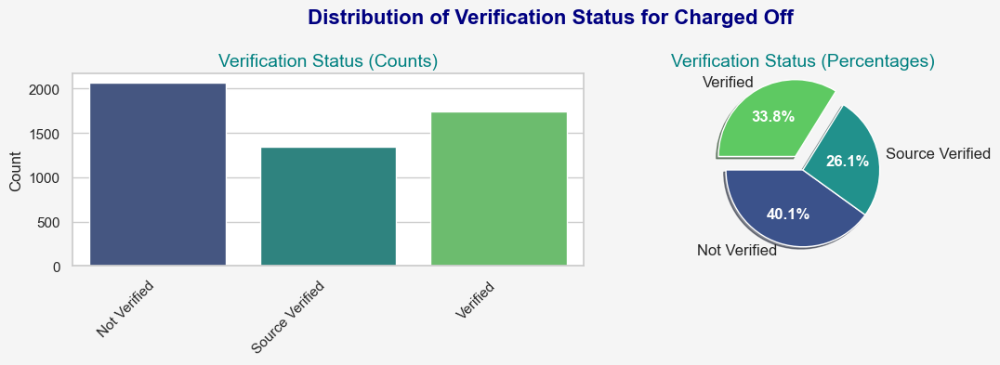

In [204]:
column_of_interest = 'verification_status'
univariate_categorical_segmented(loan, column_of_interest)

In [205]:
column_of_interest = 'verification_status'
categorical_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Category,0.0,2.0,1.0
Count,14113.00000,8896.000000,7833.000000
Proportion (%),45.75903,28.843784,25.397186


In [206]:
column_of_interest = 'verification_status'
categorical_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)

Category,0.0,2.0,1.0
Count,2063.000000,1743.00000,1344.000000
Proportion (%),40.058252,33.84466,26.097087


### _<a id='distribution-of-region'><font color='RebeccaPurple'>Distribution of Region</font></a>_ [▲](#top)

#### Univariate Analysis

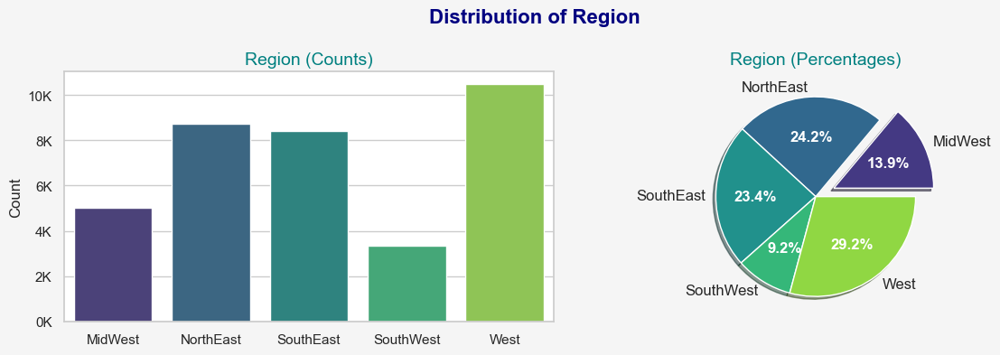

In [207]:
column_of_interest = 'region'
univariate_categorical(loan, column_of_interest)

In [208]:
column_of_interest = 'region'
categorical_column_summary(loan, column_of_interest)

Category,West,NorthEast,SouthEast,MidWest,SouthWest
Count,10505,8728,8427,5003,3329
Proportion (%),29.187042,24.249833,23.413536,13.900311,9.249278


#### Segmented Univariate Analysis

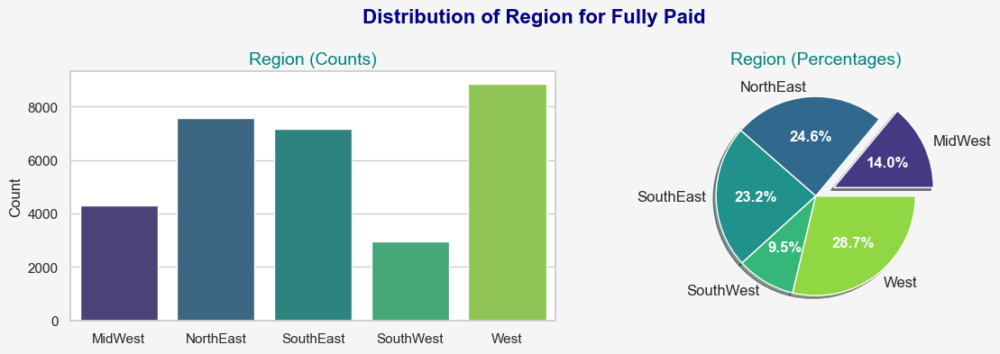

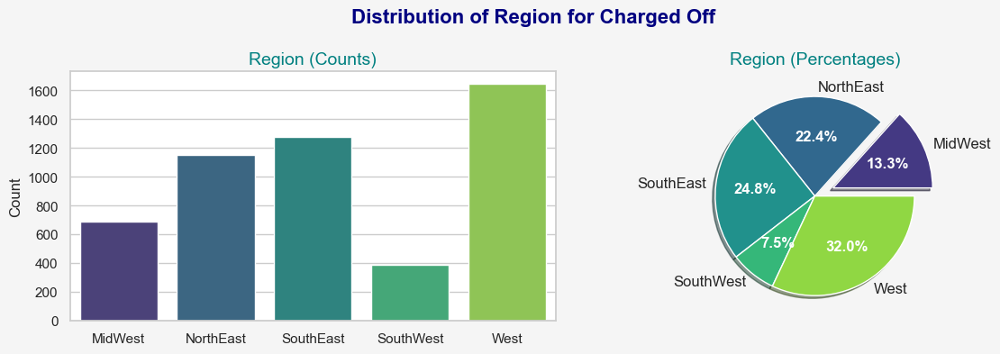

In [209]:
column_of_interest = 'region'
univariate_categorical_segmented(loan, column_of_interest)

In [210]:
column_of_interest = 'region'
categorical_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Category,West,NorthEast,SouthEast,MidWest,SouthWest
Count,8857,7576,7151,4316,2942
Proportion (%),28.717334,24.563906,23.185915,13.993904,9.53894


In [211]:
column_of_interest = 'region'
summary_df = categorical_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)
summary_df

Category,West,SouthEast,NorthEast,MidWest,SouthWest
Count,1648,1276,1152,687,387
Proportion (%),32.0,24.776699,22.368932,13.339806,7.514563


**North-East Region:** Connecticut, Maine, Massachusetts, New Hampshire, Rhode Island, Vermont, New York, New Jersey, Pennsylvania

**Midwest Region:** Illinois, Indiana, Iowa, Kansas, Michigan, Minnesota, Missouri, Nebraska, North Dakota, Ohio, South Dakota, Wisconsin

**South-East Region:** Alabama, Delaware, Florida, Georgia, Kentucky, Maryland, Mississippi, North Carolina, South Carolina, Tennessee, Virginia, District of Columbia, West Virginia

**South-West Region:** Arkansas, Louisiana, Oklahoma, Texas

**West Region:** Alaska, Arizona, California, Colorado, Hawaii, Idaho, Montana, Nevada, New Mexico, Oregon, Utah, Washington, Wyoming

 **Region and the Area Codes**

    north_east = ['CT', 'ME', 'MA', 'NH', 'RI', 'VT', 'NY', 'NJ', 'PA']
    mid_west = ['IL', 'IN', 'IA', 'KS', 'MI', 'MN', 'MO', 'NE', 'ND', 'OH', 'SD', 'WI']
    south_east = ['AL', 'DE', 'FL', 'GA', 'KY', 'MD', 'MS', 'NC', 'SC', 'TN', 'VA', 'DC', 'WV' ]
    south_west = ['AR', 'LA', 'OK','TX']
    west = ['AK', 'AZ', 'CA', 'CO', 'HI', 'ID', 'MT', 'NV', 'NM', 'OR', 'UT','WA', 'WY']

### _<a id='distribution-of-address-state'><font color='RebeccaPurple'>Distribution of Address State</font></a>_ [▲](#top)

#### Univariate Analysis

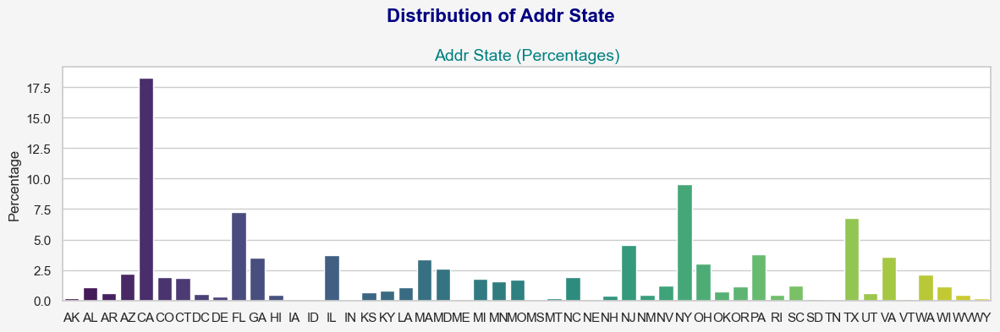

In [212]:
column_of_interest='addr_state'
univariate_categorical_percentage(loan, column_of_interest)

In [213]:
column_of_interest = 'addr_state'
categorical_column_summary(loan, column_of_interest)

Category,CA,NY,FL,TX,NJ,PA,IL,VA,GA,MA,OH,MD,AZ,WA,CO,NC,CT,MI,MO,MN,NV,SC,OR,WI,AL,LA,KY,OK,KS,UT,AR,DC,RI,NM,WV,HI,NH,DE,MT,WY,AK,SD,VT,MS,TN,IN,ID,IA,NE,ME
Count,6561,3438,2609,2445,1649,1373,1347,1282,1267,1225,1095,952,803,766,703,693,657,635,628,575,454,433,427,410,399,390,293,270,237,231,224,195,182,172,159,159,150,110,79,73,71,57,51,19,16,9,6,5,5,3
Proportion (%),18.229051,9.552123,7.248833,6.793176,4.581574,3.814737,3.742498,3.561903,3.520227,3.403534,3.042343,2.645032,2.231051,2.128251,1.953212,1.925428,1.825406,1.764281,1.744832,1.597577,1.261391,1.203045,1.186375,1.139142,1.10858,1.083574,0.81407,0.750167,0.65848,0.641809,0.622361,0.541787,0.505668,0.477884,0.441765,0.441765,0.416759,0.305623,0.219493,0.202823,0.197266,0.158369,0.141698,0.05279,0.044454,0.025006,0.01667,0.013892,0.013892,0.008335


#### Segmented Univariate Analysis

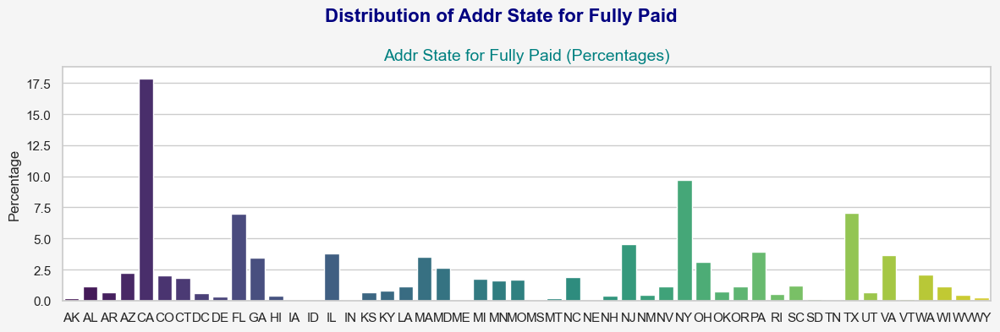

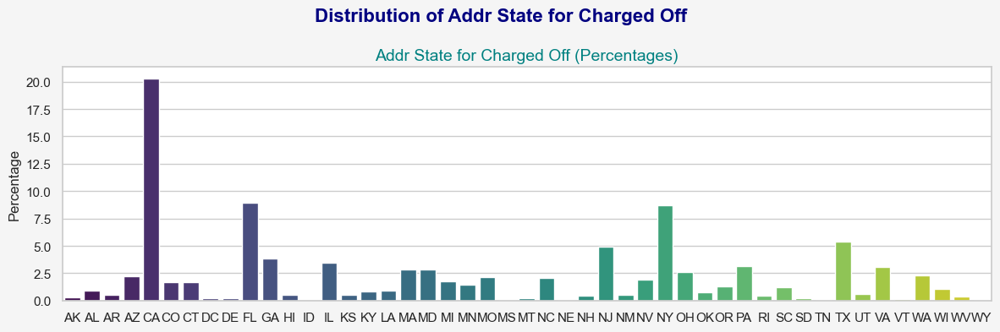

In [214]:
column_of_interest='addr_state'
univariate_categorical_percentage_segmented(loan, column_of_interest)

In [215]:
column_of_interest = 'addr_state'
categorical_column_summary(loan, column_of_interest)

Category,CA,NY,FL,TX,NJ,PA,IL,VA,GA,MA,OH,MD,AZ,WA,CO,NC,CT,MI,MO,MN,NV,SC,OR,WI,AL,LA,KY,OK,KS,UT,AR,DC,RI,NM,WV,HI,NH,DE,MT,WY,AK,SD,VT,MS,TN,IN,ID,IA,NE,ME
Count,6561,3438,2609,2445,1649,1373,1347,1282,1267,1225,1095,952,803,766,703,693,657,635,628,575,454,433,427,410,399,390,293,270,237,231,224,195,182,172,159,159,150,110,79,73,71,57,51,19,16,9,6,5,5,3
Proportion (%),18.229051,9.552123,7.248833,6.793176,4.581574,3.814737,3.742498,3.561903,3.520227,3.403534,3.042343,2.645032,2.231051,2.128251,1.953212,1.925428,1.825406,1.764281,1.744832,1.597577,1.261391,1.203045,1.186375,1.139142,1.10858,1.083574,0.81407,0.750167,0.65848,0.641809,0.622361,0.541787,0.505668,0.477884,0.441765,0.441765,0.416759,0.305623,0.219493,0.202823,0.197266,0.158369,0.141698,0.05279,0.044454,0.025006,0.01667,0.013892,0.013892,0.008335


In [216]:
column_of_interest = 'addr_state'
categorical_column_summary(loan, column_of_interest)

Category,CA,NY,FL,TX,NJ,PA,IL,VA,GA,MA,OH,MD,AZ,WA,CO,NC,CT,MI,MO,MN,NV,SC,OR,WI,AL,LA,KY,OK,KS,UT,AR,DC,RI,NM,WV,HI,NH,DE,MT,WY,AK,SD,VT,MS,TN,IN,ID,IA,NE,ME
Count,6561,3438,2609,2445,1649,1373,1347,1282,1267,1225,1095,952,803,766,703,693,657,635,628,575,454,433,427,410,399,390,293,270,237,231,224,195,182,172,159,159,150,110,79,73,71,57,51,19,16,9,6,5,5,3
Proportion (%),18.229051,9.552123,7.248833,6.793176,4.581574,3.814737,3.742498,3.561903,3.520227,3.403534,3.042343,2.645032,2.231051,2.128251,1.953212,1.925428,1.825406,1.764281,1.744832,1.597577,1.261391,1.203045,1.186375,1.139142,1.10858,1.083574,0.81407,0.750167,0.65848,0.641809,0.622361,0.541787,0.505668,0.477884,0.441765,0.441765,0.416759,0.305623,0.219493,0.202823,0.197266,0.158369,0.141698,0.05279,0.044454,0.025006,0.01667,0.013892,0.013892,0.008335


### _<a id='distribution-of-inquiries-in-past-six-months'><font color='RebeccaPurple'>Distribution of Inquiries in past six months</font></a>_ [▲](#top)

#### Univariate Analysis

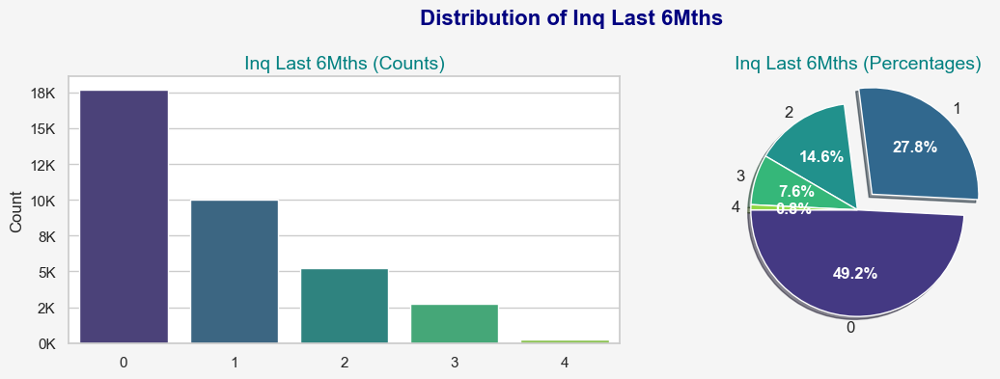

In [217]:
column_of_interest = 'inq_last_6mths'
univariate_categorical(loan, column_of_interest)

In [218]:
column_of_interest = 'inq_last_6mths'
categorical_column_summary(loan, column_of_interest)

Category,0.0,1.0,2.0,3.0,4.0
Count,17707.000000,10001.00000,5251.000000,2752.000000,281.000000
Proportion (%),49.197044,27.78673,14.589353,7.646144,0.780729


#### Segmented Univariate Analysis

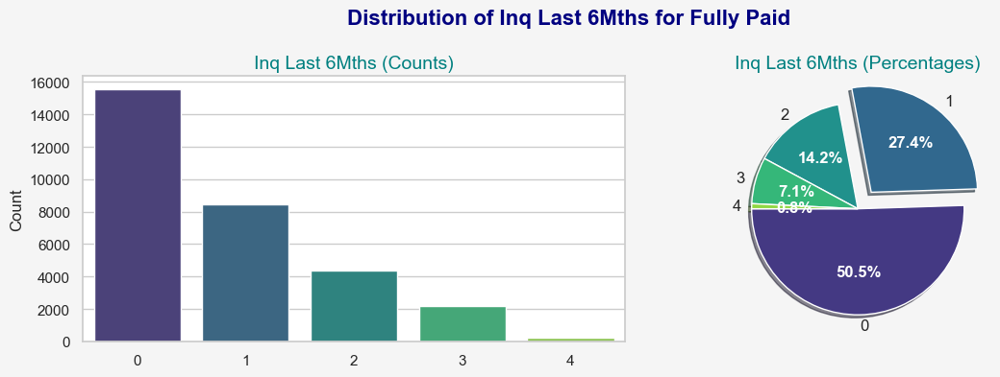

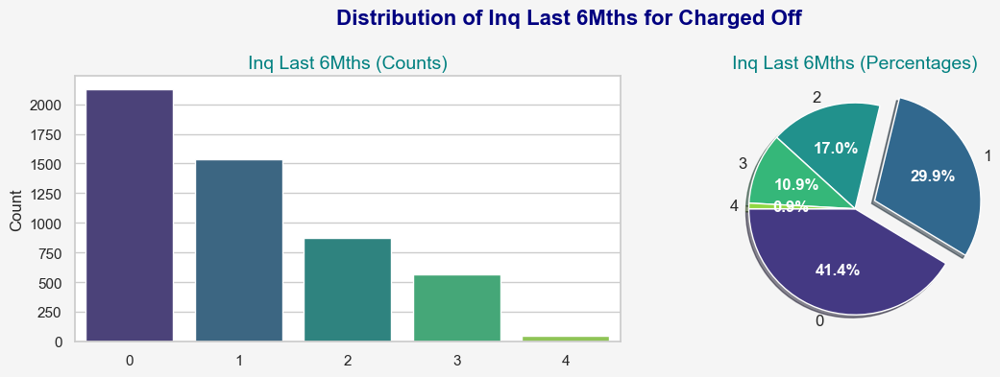

In [219]:
column_of_interest = 'inq_last_6mths'
univariate_categorical_segmented(loan, column_of_interest)

In [220]:
column_of_interest = 'inq_last_6mths'
categorical_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Category,0.0,1.0,2.0,3.0,4.0
Count,15577.000000,8463.000000,4375.000000,2190.000000,237.000000
Proportion (%),50.505804,27.439855,14.185202,7.100707,0.768433


In [221]:
column_of_interest = 'inq_last_6mths'
summary_df = categorical_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)
summary_df

Category,0.0,1.0,2.0,3.0,4.0
Count,2130.000000,1538.000000,876.000000,562.000000,44.000000
Proportion (%),41.359223,29.864078,17.009709,10.912621,0.854369


### _<a id='distribution-of-issue-year'><font color='RebeccaPurple'>Distribution of Issue Year</font></a>_ [▲](#top)

#### Univariate Analysis

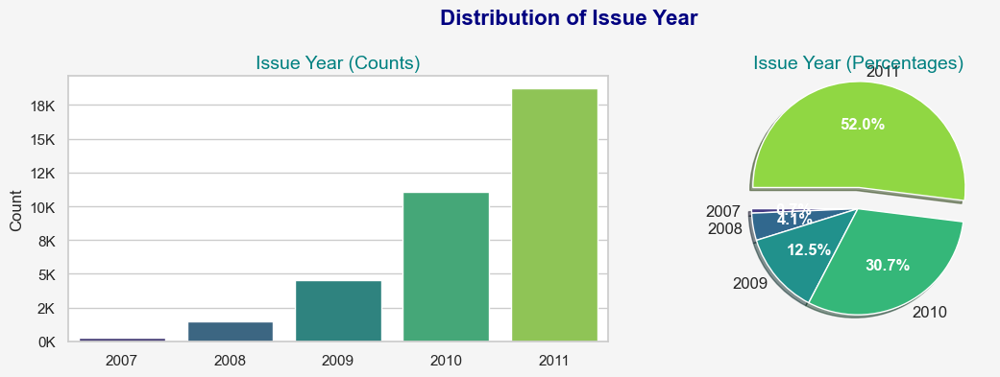

In [222]:
column_of_interest = 'issue_year'
univariate_categorical(loan, column_of_interest)

In [223]:
column_of_interest = 'issue_year'
categorical_column_summary(loan, column_of_interest)

Category,2011.0,2010.0,2009.0,2008.0,2007.0
Count,18706.000000,11040.000000,4513.000000,1493.000000,240.000000
Proportion (%),51.972661,30.673483,12.538898,4.148144,0.666815


#### Segmented Univariate Analysis

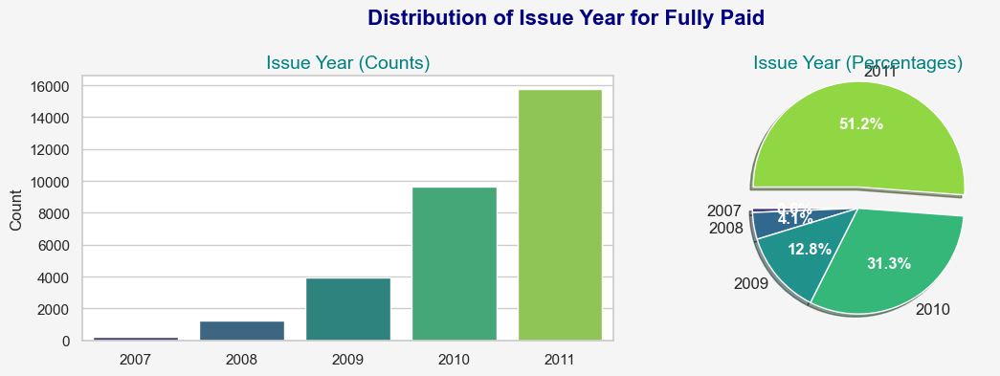

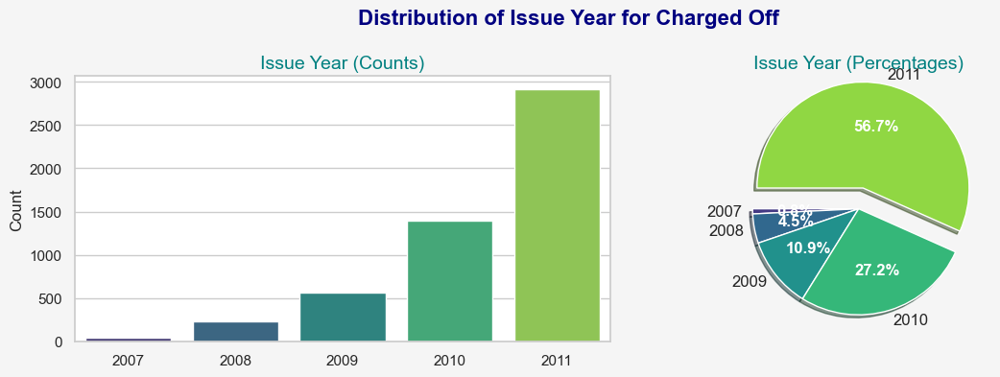

In [224]:
column_of_interest = 'issue_year'
univariate_categorical_segmented(loan, column_of_interest)

In [225]:
column_of_interest = 'issue_year'
categorical_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Category,2011.0,2010.0,2009.0,2008.0,2007.0
Count,15787.000000,9640.000000,3952.000000,1263.000000,200.000000
Proportion (%),51.186693,31.256079,12.813696,4.095065,0.648466


In [226]:
column_of_interest = 'issue_year'
categorical_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)

Category,2011.0,2010.0,2009.0,2008.0,2007.0
Count,2919.000000,1400.000000,561.000000,230.000000,40.000000
Proportion (%),56.679612,27.184466,10.893204,4.466019,0.776699


### _<a id='distribution-of-issue-month'><font color='RebeccaPurple'>Distribution of Issue Month</font></a>_ [▲](#top)

#### Univariate Analysis

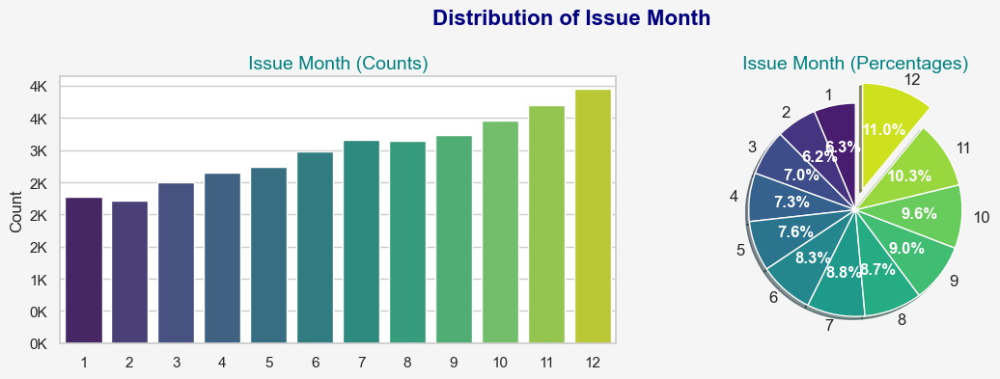

In [227]:
column_of_interest = 'issue_month'
univariate_categorical(loan, column_of_interest)

In [228]:
column_of_interest = 'issue_month'
categorical_column_summary(loan, column_of_interest)

Category,12.0,11.0,10.0,9.0,7.0,8.0,6.0,5.0,4.0,3.0,1.0,2.0
Count,3947.000000,3694.000000,3459.000000,3234.00000,3163.000000,3145.000000,2981.000000,2735.000000,2643.000000,2505.00000,2270.000000,2216.000000
Proportion (%),10.966326,10.263392,9.610469,8.98533,8.788064,8.738053,8.282396,7.598911,7.343299,6.95988,6.306957,6.156924


#### Segmented Univariate Analysis

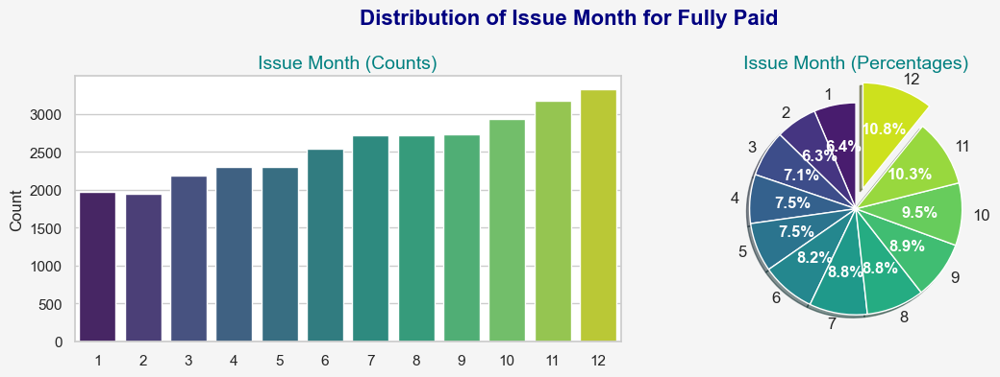

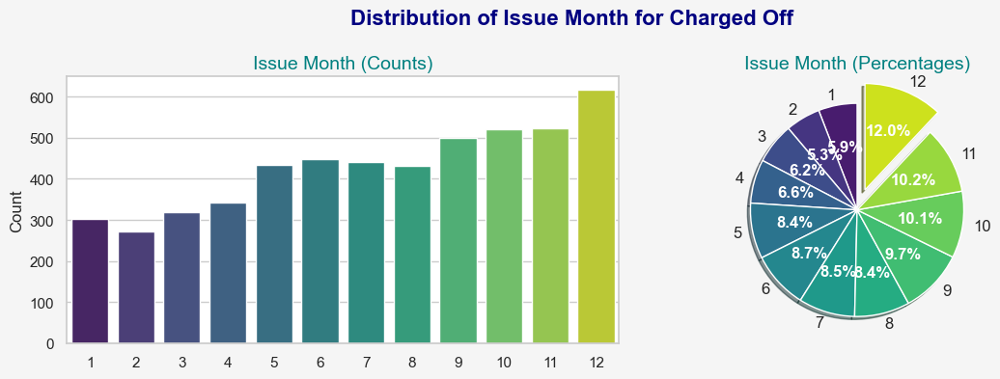

In [229]:
column_of_interest = 'issue_month'
univariate_categorical_segmented(loan, column_of_interest)

In [230]:
column_of_interest = 'issue_month'
categorical_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Category,12.0,11.0,10.0,9.0,7.0,8.0,6.0,5.0,4.0,3.0,1.0,2.0
Count,3329.000000,3170.000000,2938.000000,2734.000000,2723.00000,2714.000000,2534.000000,2301.000000,2301.000000,2186.000000,1968.000000,1944.000000
Proportion (%),10.793723,10.278192,9.525971,8.864535,8.82887,8.799689,8.216069,7.460606,7.460606,7.087738,6.380909,6.303093


In [231]:
column_of_interest = 'issue_month'
summary_df = categorical_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)
summary_df

Category,12.0,11.0,10.0,9.0,6.0,7.0,5.0,8.0,4.0,3.0,1.0,2.0
Count,618.0,524.000000,521.000000,500.000000,447.000000,440.000000,434.000000,431.000000,342.000000,319.000000,302.000000,272.000000
Proportion (%),12.0,10.174757,10.116505,9.708738,8.679612,8.543689,8.427184,8.368932,6.640777,6.194175,5.864078,5.281553


### _<a id='distribution-of-issue-quarter'><font color='RebeccaPurple'>Distribution of Issue Quater</font></a>_ [▲](#top)

#### Univariate Analysis

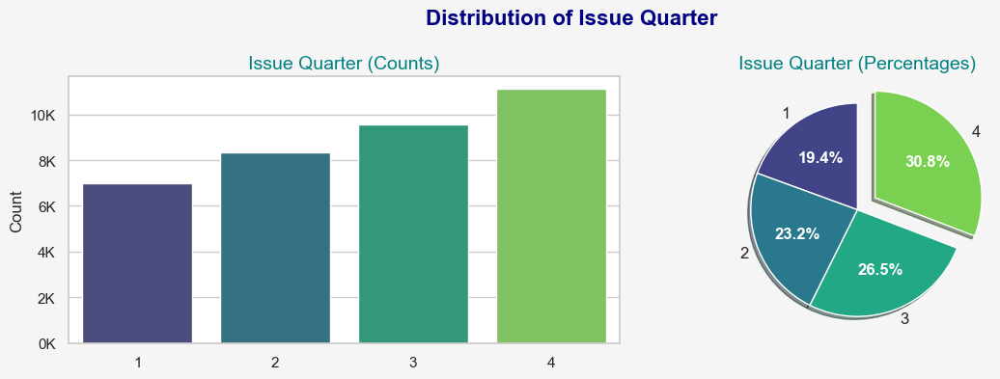

In [232]:
column_of_interest = 'issue_quarter'
univariate_categorical(loan, column_of_interest)

In [233]:
column_of_interest = 'issue_quarter'
categorical_column_summary(loan, column_of_interest)

Category,4.0,3.0,2.0,1.0
Count,11100.000000,9542.000000,8359.000000,6991.000000
Proportion (%),30.840187,26.511447,23.224605,19.423761


#### Segmented Univariate Analysis

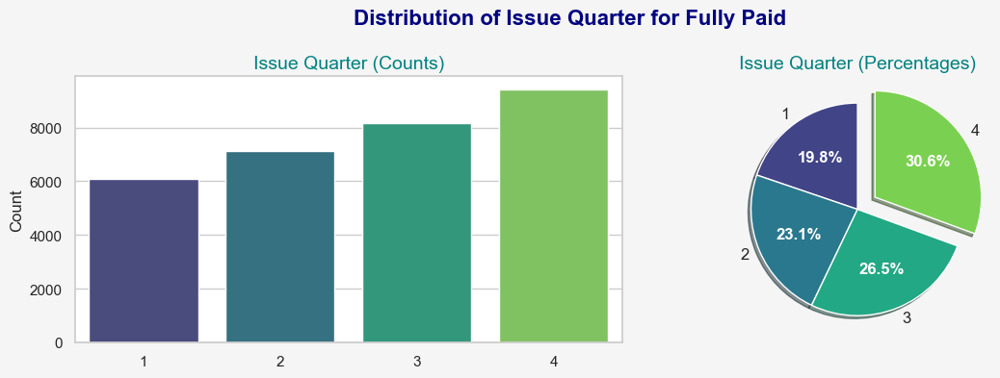

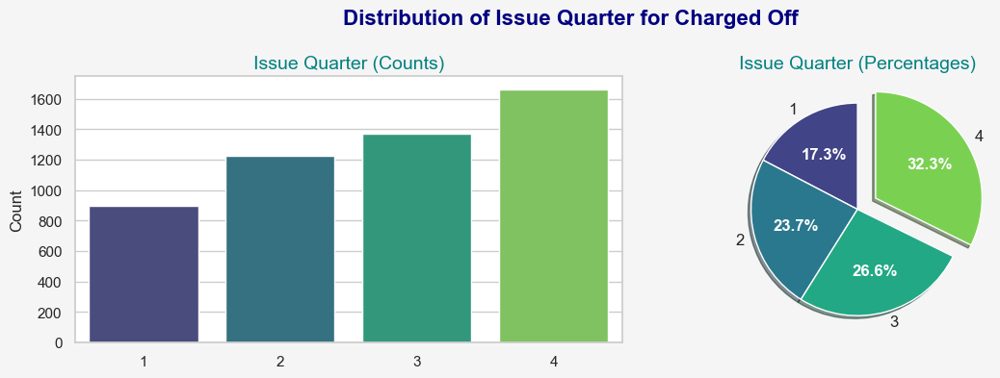

In [234]:
column_of_interest = 'issue_quarter'
univariate_categorical_segmented(loan, column_of_interest)

In [235]:
column_of_interest = 'issue_quarter'
categorical_column_summary(loan[loan['loan_status'] == 'Fully Paid'], column_of_interest)

Category,4.0,3.0,2.0,1.0
Count,9437.000000,8171.000000,7136.00000,6098.00000
Proportion (%),30.597886,26.493094,23.13728,19.77174


In [236]:
column_of_interest = 'issue_quarter'
categorical_column_summary(loan[loan['loan_status'] == 'Charged Off'], column_of_interest)

Category,4.0,3.0,2.0,1.0
Count,1663.000000,1371.000000,1223.000000,893.000000
Proportion (%),32.291262,26.621359,23.747573,17.339806


In [237]:
# charged_off = loan[loan['loan_status'] == 'Charged Off']
# fully_paid = loan[loan['loan_status'] == 'Fully Paid']

# # create a excel writer object
# with pd.ExcelWriter("data/results/loan_data.xlsx") as writer:
#     loan.to_excel(writer, sheet_name='all_data', index=False)
#     charged_off.to_excel(writer, sheet_name='charged_off', index=False)
#     fully_paid.to_excel(writer, sheet_name='fully_paid', index=False)

# <a id = 'bivariate-analysis'>6. Bivariate Analysis</a>

## <a id = 'numerical-variables-vs-numerical-variables'>A. Numerical Variables vs Numerical Variables</a>  [▲](#top)

**Objective:**

Analyze the relationship between two numerical variables to understand how they interact and identify any patterns or correlations.

---

**Questions:**

- What is the relationship between the two numerical variables?
- Is there a trend or correlation between the variables?
- Are there any clusters, patterns, or anomalies in the data?
- How do the variables vary together, and what is the strength of their relationship?

---

**Methods:**

- **Correlation Coefficient:** Calculate the Pearson correlation coefficient to quantify the strength and direction of the relationship.
- **Scatter Plot:** Plot a scatter plot to visualize the relationship and potential correlation between the two numerical variables.
- **Regression Line:** Fit a regression line to the scatter plot to understand the trend and predictive relationship between the variables.
- **Statistics Table:** Summarize key statistics (mean, std, correlation etc.) in a table.

---


### KEY INSIGHTS FOR RELATIONSHIPS BETWEEN NUMERICAL ATTRIBUTES


#### 1. **Relationship between Loan Amount and Interest Rate:**

- **Overall Correlation:** Weak positive correlation of 0.236 between loan amount and interest rate.
- **Fully Paid Loans:** Correlation is 0.221, showing a slight trend that higher loan amounts are somewhat associated with higher interest rates.
- **Charged Off Loans:** Correlation increases to 0.291, indicating a stronger trend where higher loan amounts are more closely associated with higher interest rates in defaulted loans.
- **Charged Off Loans Density:** The scatterplot shows a higher density of points at the lower end of loan amounts and interest rates between 10% to 15%.

---

#### 2. **Relationship between Loan Amount and Annual Income:**

- **Overall Correlation:** Moderate positive correlation of 0.364 between loan amount and annual income.
- **Fully Paid Loans:** Correlation is 0.366, indicating a moderate trend where higher annual incomes are somewhat associated with higher loan amounts.
- **Charged Off Loans:** Correlation increases to 0.391, showing a stronger relationship where higher annual incomes are more closely associated with higher loan amounts in defaulted loans.
- **Charged Off Loans Density:** The scatterplot shows a higher density of points at the lower end of both loan amounts and annual incomes.

---

#### 3. **Relationship between Loan Amount and Debt-to-Income Ratio:**

- **Overall Correlation:** Very weak positive correlation of 0.073 between loan amount and debt-to-income ratio.
- **Fully Paid Loans:** Correlation is 0.071, showing a minimal trend where higher loan amounts are slightly associated with higher debt-to-income ratios.
- **Charged Off Loans:** Correlation is 0.074, indicating a similar weak relationship in defaulted loans, where higher loan amounts are weakly associated with higher debt-to-income ratios.
- **Charged Off Loans Density:** The scatterplot shows a higher density of points at the lower end of both loan amounts and DTIs between 10-20.

---

#### 4. **Relationship between Loan Amount and Revolving Utilization Rate:**

- **Overall Correlation:** Very weak positive correlation of 0.062 between loan amount and revolving credit utilization.
- **Fully Paid Loans:** Correlation is 0.060, indicating a minimal trend where higher loan amounts are weakly associated with higher revolving credit utilization.
- **Charged Off Loans:** Correlation is 0.047, showing a similar weak relationship in defaulted loans, where higher loan amounts are very weakly associated with higher revolving credit utilization.
- **Charged Off Loans Density:** The scatterplot shows a higher density of points at the lower end of loan amounts and higher end of revolving utilization rates.

---

#### 5. **Relationship between Interest Rate and Annual Income:**

- **Overall Correlation:** Very weak positive correlation of 0.017 between interest rate and annual income.
- **Fully Paid Loans:** Correlation is 0.021, indicating an extremely weak trend where higher annual incomes are weakly associated with slightly higher interest rates.
- **Charged Off Loans:** Correlation increases to 0.104, showing a weak but somewhat stronger relationship where higher annual incomes are weakly associated with higher interest rates in defaulted loans.
- **Charged Off Loans Density:** The scatterplot shows a higher density of points at the lower end of annual incomes and interest rates between 10%-17.5%.

---

#### 6. **Relationship between Interest Rate and Debt-to-Income Ratio:**

- **Overall Correlation:** Weak positive correlation of 0.105 between interest rate and debt-to-income ratio.
- **Fully Paid Loans:** Correlation is 0.110, indicating a weak trend where higher debt-to-income ratios are slightly associated with higher interest rates.
- **Charged Off Loans:** Correlation drops to 0.023, showing a very weak relationship where higher debt-to-income ratios have almost no association with higher interest rates in defaulted loans.
- **Charged Off Loans Density:** The scatterplot shows a higher density of points at the central tendancy for both interest rates and DTIs.

---

#### 7. **Relationship between Interest Rate and Revolving Utilization Rate:**

- **Overall Correlation:** Moderate positive correlation of 0.476 between interest rate and revolving credit utilization.
- **Fully Paid Loans:** Correlation is 0.483, indicating a moderate trend where higher revolving credit utilization is associated with higher interest rates.
- **Charged Off Loans:** Correlation is 0.375, showing a slightly weaker but still moderate relationship where higher revolving credit utilization is associated with higher interest rates in defaulted loans.
- **Charged Off Loans Density:** The scatterplot shows a higher density of points at the higher end of revolving utilization rates and mid-range interest rates (10%-17.5%).

---

#### 8. **Relationship between Annual Income and Debt-to-Income Ratio:**

- **Overall Correlation:** Weak negative correlation of -0.122 between annual income and debt-to-income ratio.
- **Fully Paid Loans:** Correlation is -0.126, indicating a slight inverse relationship where higher annual income is weakly associated with lower debt-to-income ratios.
- **Charged Off Loans:** Correlation is -0.073, showing an even weaker inverse relationship where higher annual income has a very minimal association with lower debt-to-income ratios in defaulted loans.
- **Charged Off Loans Density:** The scatterplot shows a higher density of points at the lower end of annual incomes and mid-ranged DTIs(10-20).

---

#### 9. **Relationship between Annual Income and Revolving Utilization Rate:**

- **Overall Correlation:** Very weak positive correlation of 0.035 between annual income and revolving credit utilization, indicating minimal relationship.
- **Fully Paid Loans:** Correlation is 0.035, showing a very slight positive relationship where higher annual income has a negligible association with higher revolving credit utilization.
- **Charged Off Loans:** Correlation is 0.087, suggesting a weak positive relationship where higher annual income is weakly associated with higher revolving credit utilization in defaulted loans.
- **Charged Off Loans Density:** The scatterplot shows a higher density of points at the lower end of annual incomes and higher ends of revolving utilization rates.

---

#### 10. **Relationship between Debt-to-Income Ratio and Revolving Utilization Rate:**

- **Overall Correlation:** 0.279, indicating a moderate positive correlation between debt-to-income ratio and revolving utilization.
- **Fully Paid Loans:** Correlation is 0.285, suggesting a slightly stronger positive relationship where higher debt-to-income ratio is moderately associated with higher revolving utilization in fully paid loans.
- **Charged Off Loans:** Correlation is 0.226, showing a weaker positive relationship compared to fully paid loans, where higher debt-to-income ratios are weakly associated with higher revolving credit utilization in defaulted loans.
- **Charged Off Loans Density:** The scatterplot shows a higher density of points at the higher ends of both DTIs and revolving utilization rates.

---

### **OUTCOME:**

Based on the Bivariate Correlation of Numerical Variables with Loan_Status, we can conclude that the following quantitative attributes may be the **numerical indicators** for charged-off loans:

1. <span style="color:red; font-size:16px;"><strong>Loan Amount</strong></span>
2. <span style="color:green; font-size:16px;"><strong>Interest Rate</strong></span>
3. <span style="color:purple; font-size:16px;"><strong>Annual Income</strong></span>
4. <span style="color:teal; font-size:16px;"><strong>Debt-to-Income (DTI) Ratio</strong></span>
5. <span style="color:orange; font-size:16px;"><strong>Revolving Utilization Rate</strong></span>

### _<a id='correlation-matrices'><font color='RebeccaPurple'>Correlation Matrices</font></a>_ [▲](#top)

#### <font color='red'>Alert! This Plotly Visualization does not show up in gitHub. Please view it in Jupyter Notebook.<font/>

In [238]:
corr_matrix_num = plot_correlation_matrix(numerical_df)

**Interpretation of Correlation Coefficients:**

- **0.70 to 1.00** (or -0.70 to -1.00): Strong positive (or negative) correlation
- **0.40 to 0.69** (or -0.40 to -0.69): Moderate positive (or negative) correlation
- **0.09 to 0.39** (or -0.09 to -0.39): Weak positive (or negative) correlation
- **0.00 to 0.09** (or -0.00 to -0.09): Very weak or no correlation

In [239]:
correlations = corr_matrix_num['loan_status'].sort_values(ascending=False)
print('Correlations between \'loan_status\' and numerical variables:')
print(correlations)

Correlations between 'loan_status' and numerical variables:
loan_status         1.000000
int_rate            0.209209
revol_util          0.098851
loan_amnt           0.047821
dti                 0.045286
funded_amnt         0.044855
funded_amnt_inv     0.026710
issue_year          0.024828
installment         0.012152
open_acc           -0.015573
months_since_ecr   -0.016975
total_acc          -0.027754
annual_inc         -0.071929
total_rec_prncp    -0.360446
Name: loan_status, dtype: float64


> Loan_status in general has week to very week correlations with numerical features.

> **Top 5** Positive Correlations of 'loan_status' are:

    int_rate            0.209209
    revol_util          0.098851
    loan_amnt           0.047821
    dti                 0.045286
    funded_amnt         0.044855

> And Negative Correlations of 'loan_status' are: 

    annual_inc         -0.071929
    total_rec_prncp    -0.360446


In [240]:
correlations = corr_matrix_num['int_rate'].sort_values(ascending=False)
print('Correlations between \'int_rate\' and numerical variables:')
print(correlations)

Correlations between 'int_rate' and numerical variables:
int_rate            1.000000
revol_util          0.475801
funded_amnt         0.243053
funded_amnt_inv     0.237538
loan_amnt           0.236096
installment         0.211358
loan_status         0.209209
total_rec_prncp     0.113552
dti                 0.104583
annual_inc          0.016617
issue_year          0.011723
open_acc           -0.056722
total_acc          -0.109055
months_since_ecr   -0.155657
Name: int_rate, dtype: float64


In [241]:
correlations = corr_matrix_num['dti'].sort_values(ascending=False)
print('Correlations between \'loan_amnt\' and numerical variables:')
print(correlations)

Correlations between 'loan_amnt' and numerical variables:
dti                 1.000000
open_acc            0.294851
revol_util          0.279352
total_acc           0.232853
int_rate            0.104583
issue_year          0.091231
funded_amnt_inv     0.082512
loan_amnt           0.073280
funded_amnt         0.072797
installment         0.058841
months_since_ecr    0.048549
loan_status         0.045286
total_rec_prncp     0.044681
annual_inc         -0.121511
Name: dti, dtype: float64


In [242]:
# Select numeric columns for correlation
numeric_cols = ['loan_status', 'int_rate', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'installment', 
                'total_rec_prncp', 'annual_inc', 'total_acc', 'open_acc', 'months_since_ecr']

# Filter the DataFrame
numeric_loan_shortlisted = numerical_df[numeric_cols].copy()

#### <font color='red'>Alert! This Plotly Visualization does not show up in gitHub. Please view it in Jupyter Notebook.<font/>

In [243]:
corr_num_shortlisted = plot_correlation_matrix(numeric_loan_shortlisted, color_scale='Viridis', height=900, width=900)

In [244]:
correlations = corr_num_shortlisted['loan_amnt'].sort_values(ascending=False)
print('Correlations between \'loan_amnt\' and numerical variables:')
print(correlations)

Correlations between 'loan_amnt' and numerical variables:
loan_amnt           1.000000
funded_amnt         0.978355
funded_amnt_inv     0.924742
installment         0.924199
total_rec_prncp     0.839344
annual_inc          0.363743
total_acc           0.240222
int_rate            0.236096
open_acc            0.176996
months_since_ecr    0.170627
loan_status         0.047821
Name: loan_amnt, dtype: float64


> We can clearly see that 'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'installment', 'total_rec_prncp' are closely related to each other. But clearly, **'loan_amnt' is the driving factor in the group** since it is the amount quoted by the borrower.

> Loan Amount and Funded Amount have a correlation of 0.98 which implies, that almost 98% of the people get the amount of funds they requested for. So Loan Amount can be conveniently used instead of the Funded Amount.

> We can also find some correlation between no. of open credit lines and the total no. of credit lines. which is quite obvious, and the data shows as well.

Despite the weak correlation, we can loosely infer thar:

**NUMERICAL INDICATORS OF DEFAULT ARE:**

- **Loan Amount ('loan_amnt')**
- **Interest Rate ('int_rate')**
- **Annual Income ('annual_inc')**
- **Debt-to-Income Ratio ('dti')**
- **Revolving Utilization Rate ('revol_util')**

This is in coherence with the univariate and segmented univariate analyses done before. 

In [245]:
numerical_df.columns

Index(['loan_status', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'int_rate', 'installment', 'annual_inc', 'dti', 'revol_util',
       'open_acc', 'total_acc', 'total_rec_prncp', 'issue_year',
       'months_since_ecr'],
      dtype='object')

### _<a id='relationship-between-numerical-indicators-of-default'><font color='RebeccaPurple'>Relationship between Numerical Indicators of Default</font></a>_ [▲](#top)

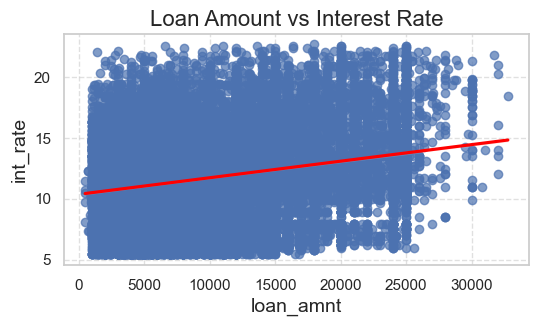

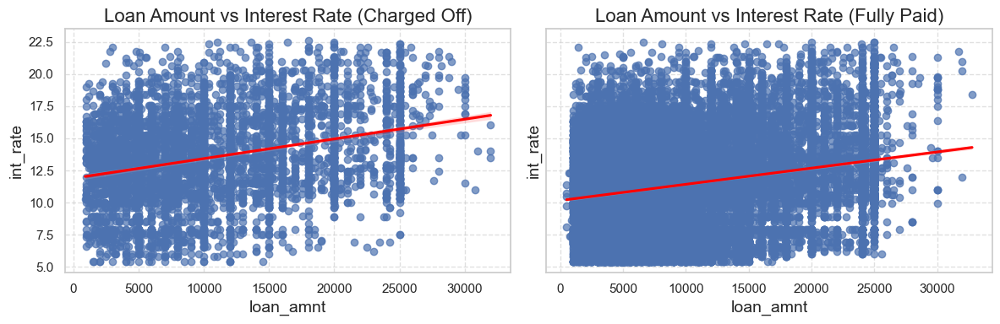

In [246]:
x_col = 'loan_amnt'
y_col = 'int_rate'

bivariate_numerical(loan, x_col, y_col, 'Loan Amount vs Interest Rate')
bivariate_numerical_segmented(loan, x_col, y_col, 'Loan Amount vs Interest Rate')

In [247]:
bivariate_statistical_summary(loan, 'loan_amnt', 'int_rate')

,count,mean,std,min,25%,50%,75%,max,Correlation
loan_amnt,35992.0,10179.996944,6202.266648,500.00,5000.0,9000.00,14300.00,32775.00,0.236096
int_rate,35992.0,11.735780,3.570129,5.42,8.9,11.58,14.17,22.64,0.236096


In [248]:
bivariate_statistical_summary(loan[loan['loan_status']=='Fully Paid'], 'loan_amnt', 'int_rate')

,count,mean,std,min,25%,50%,75%,max,Correlation
loan_amnt,30842.0,10058.799689,6105.432691,500.00,5000.00,9000.00,14000.0,32775.00,0.220517
int_rate,30842.0,11.430576,3.485518,5.42,8.49,11.36,13.8,22.48,0.220517


In [249]:
bivariate_statistical_summary(loan[loan['loan_status']=='Charged Off'], 'loan_amnt', 'int_rate')

,count,mean,std,min,25%,50%,75%,max,Correlation
loan_amnt,5150.0,10905.815534,6708.146928,900.00,5056.25,10000.00,15000.0,32000.00,0.291208
int_rate,5150.0,13.563569,3.524866,5.42,11.11,13.49,16.0,22.64,0.291208


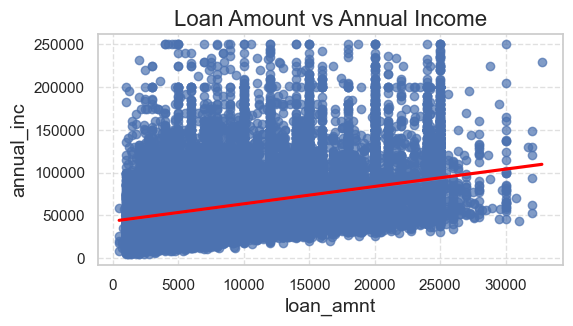

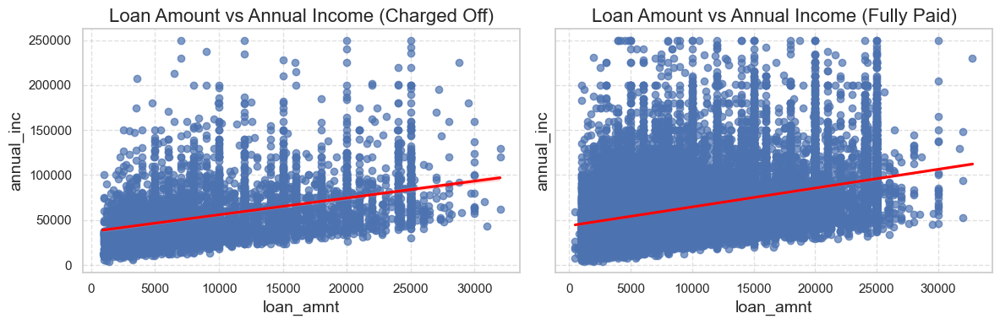

In [250]:
x_col = 'loan_amnt'
y_col = 'annual_inc'

bivariate_numerical(loan, x_col, y_col, 'Loan Amount vs Annual Income')
bivariate_numerical_segmented(loan, x_col, y_col, 'Loan Amount vs Annual Income')

In [251]:
bivariate_statistical_summary(loan, 'loan_amnt', 'annual_inc')

,count,mean,std,min,25%,50%,75%,max,Correlation
loan_amnt,35992.0,10179.996944,6202.266648,500.0,5000.0,9000.0,14300.0,32775.0,0.363743
annual_inc,35992.0,63690.225022,34666.925682,4000.0,40000.0,56000.0,79000.0,250000.0,0.363743


In [252]:
bivariate_statistical_summary(loan[loan['loan_status']=='Fully Paid'], 'loan_amnt', 'annual_inc')

,count,mean,std,min,25%,50%,75%,max,Correlation
loan_amnt,30842.0,10058.799689,6105.432691,500.0,5000.0,9000.0,14000.0,32775.0,0.365683
annual_inc,30842.0,64709.156733,34973.583952,4000.0,40000.0,57455.0,80000.0,250000.0,0.365683


In [253]:
bivariate_statistical_summary(loan[loan['loan_status']=='Charged Off'], 'loan_amnt', 'annual_inc')

,count,mean,std,min,25%,50%,75%,max,Correlation
loan_amnt,5150.0,10905.815534,6708.146928,900.0,5056.25,10000.0,15000.0,32000.0,0.390737
annual_inc,5150.0,57588.110103,32103.769996,4080.0,36000.00,50004.0,70000.0,250000.0,0.390737


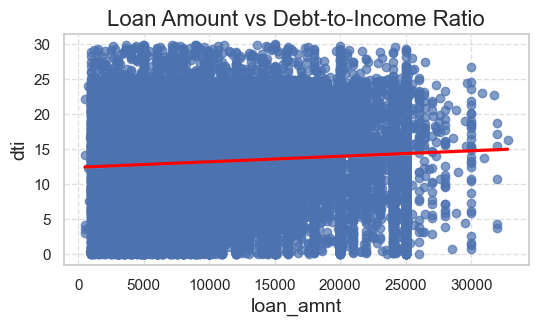

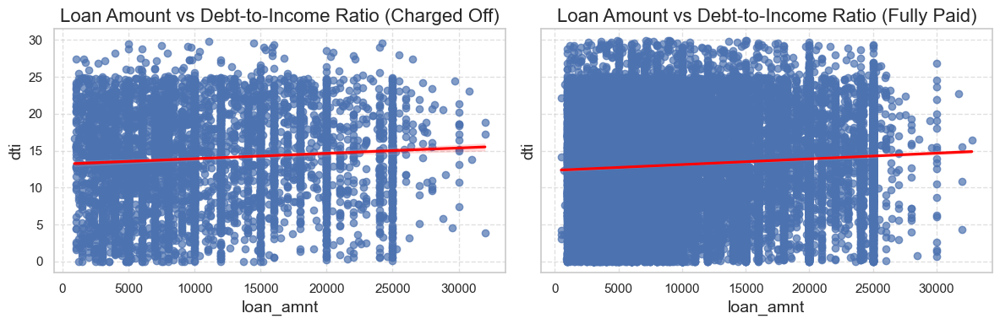

In [254]:
x_col = 'loan_amnt'
y_col = 'dti'

bivariate_numerical(loan, x_col, y_col, 'Loan Amount vs Debt-to-Income Ratio')
bivariate_numerical_segmented(loan, x_col, y_col, 'Loan Amount vs Debt-to-Income Ratio')

In [255]:
bivariate_statistical_summary(loan, 'loan_amnt', 'dti')

,count,mean,std,min,25%,50%,75%,max,Correlation
loan_amnt,35992.0,10179.996944,6202.266648,500.0,5000.00,9000.00,14300.00,32775.00,0.07328
dti,35992.0,13.253974,6.661392,0.0,8.11,13.33,18.52,29.99,0.07328


In [256]:
bivariate_statistical_summary(loan[loan['loan_status']=='Fully Paid'], 'loan_amnt', 'dti')

,count,mean,std,min,25%,50%,75%,max,Correlation
loan_amnt,30842.0,10058.799689,6105.432691,500.0,5000.00,9000.00,14000.00,32775.00,0.070849
dti,30842.0,13.130705,6.668779,0.0,7.97,13.16,18.35,29.99,0.070849


In [257]:
bivariate_statistical_summary(loan[loan['loan_status']=='Charged Off'], 'loan_amnt', 'dti')

,count,mean,std,min,25%,50%,75%,max,Correlation
loan_amnt,5150.0,10905.815534,6708.146928,900.0,5056.2500,10000.000,15000.00,32000.00,0.073953
dti,5150.0,13.992204,6.569387,0.0,9.0625,14.275,19.28,29.85,0.073953


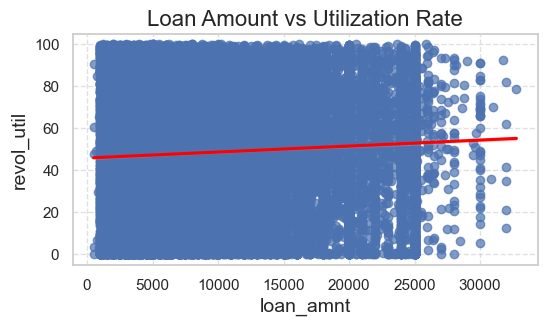

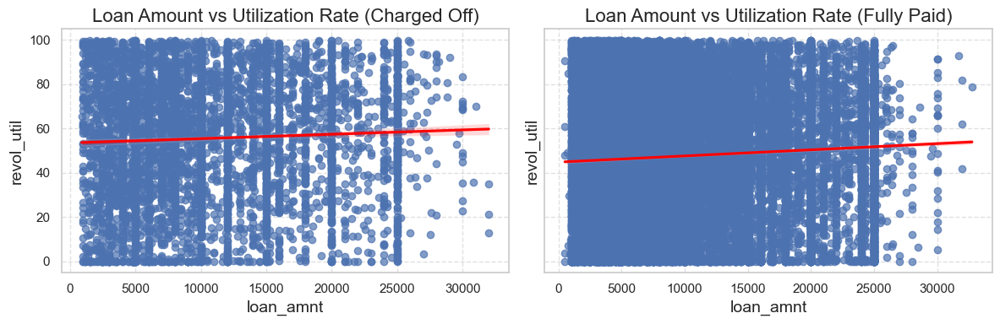

In [258]:
x_col = 'loan_amnt'
y_col = 'revol_util'

bivariate_numerical(loan, x_col, y_col, 'Loan Amount vs Utilization Rate')
bivariate_numerical_segmented(loan, x_col, y_col, 'Loan Amount vs Utilization Rate')

In [259]:
bivariate_statistical_summary(loan, 'loan_amnt', 'revol_util')

,count,mean,std,min,25%,50%,75%,max,Correlation
loan_amnt,35992.0,10179.996944,6202.266648,500.0,5000.0,9000.0,14300.0,32775.0,0.062395
revol_util,35992.0,48.783306,28.295903,0.0,25.5,49.2,72.2,99.9,0.062395


In [260]:
bivariate_statistical_summary(loan[loan['loan_status']=='Fully Paid'], 'loan_amnt', 'revol_util')

,count,mean,std,min,25%,50%,75%,max,Correlation
loan_amnt,30842.0,10058.799689,6105.432691,500.0,5000.0,9000.0,14000.0,32775.0,0.059991
revol_util,30842.0,47.640347,28.230556,0.0,24.1,47.8,70.8,99.9,0.059991


In [261]:
bivariate_statistical_summary(loan[loan['loan_status']=='Charged Off'], 'loan_amnt', 'revol_util')

,count,mean,std,min,25%,50%,75%,max,Correlation
loan_amnt,5150.0,10905.815534,6708.146928,900.0,5056.250,10000.0,15000.0,32000.0,0.04737
revol_util,5150.0,55.628188,27.717362,0.0,34.625,58.4,78.8,99.9,0.04737


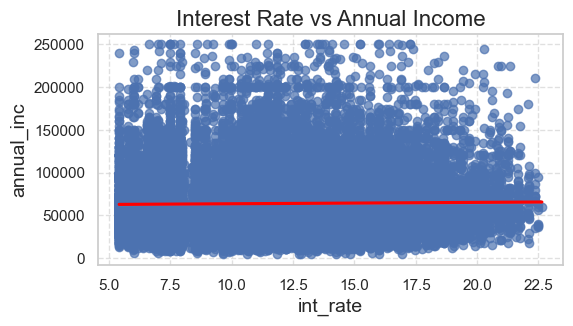

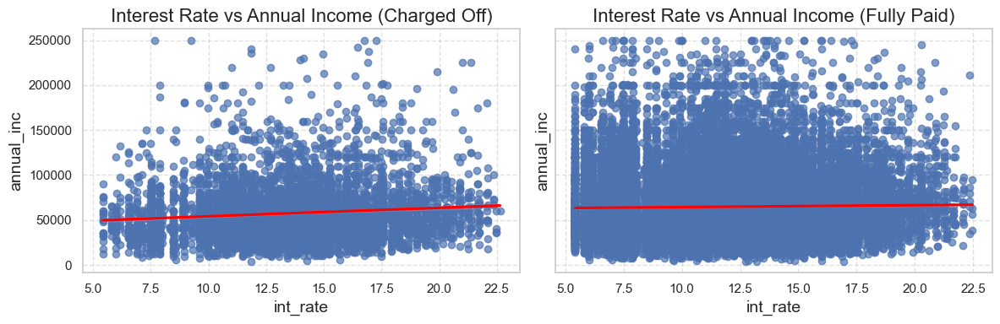

In [262]:
x_col = 'int_rate'
y_col = 'annual_inc'

bivariate_numerical(loan, x_col, y_col, 'Interest Rate vs Annual Income')
bivariate_numerical_segmented(loan, x_col, y_col, 'Interest Rate vs Annual Income')

In [263]:
bivariate_statistical_summary(loan, 'int_rate', 'annual_inc')

,count,mean,std,min,25%,50%,75%,max,Correlation
int_rate,35992.0,11.735780,3.570129,5.42,8.9,11.58,14.17,22.64,0.016617
annual_inc,35992.0,63690.225022,34666.925682,4000.00,40000.0,56000.00,79000.00,250000.00,0.016617


In [264]:
bivariate_statistical_summary(loan[loan['loan_status']=='Fully Paid'], 'int_rate', 'annual_inc')

,count,mean,std,min,25%,50%,75%,max,Correlation
int_rate,30842.0,11.430576,3.485518,5.42,8.49,11.36,13.8,22.48,0.021401
annual_inc,30842.0,64709.156733,34973.583952,4000.00,40000.00,57455.00,80000.0,250000.00,0.021401


In [265]:
bivariate_statistical_summary(loan[loan['loan_status']=='Charged Off'], 'int_rate', 'annual_inc')

,count,mean,std,min,25%,50%,75%,max,Correlation
int_rate,5150.0,13.563569,3.524866,5.42,11.11,13.49,16.0,22.64,0.103991
annual_inc,5150.0,57588.110103,32103.769996,4080.00,36000.00,50004.00,70000.0,250000.00,0.103991


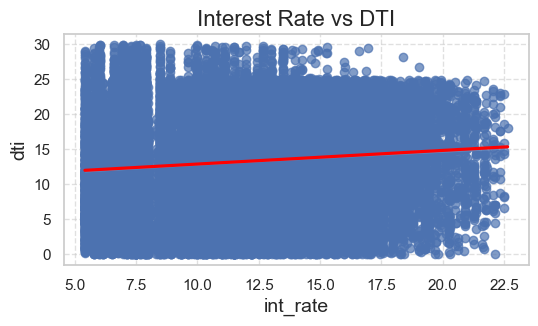

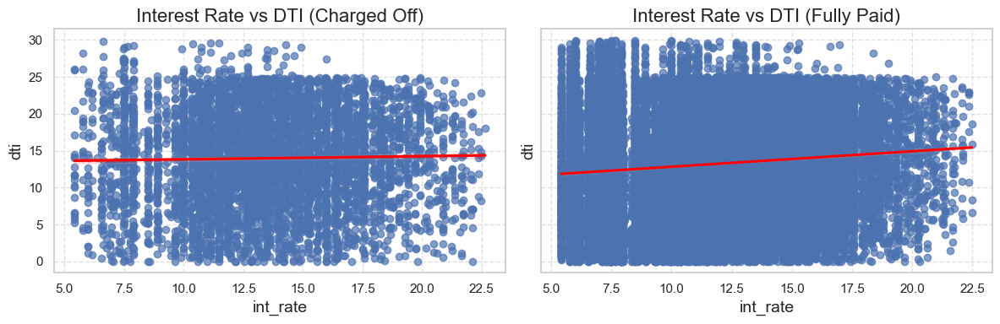

In [266]:
x_col = 'int_rate'
y_col = 'dti'

bivariate_numerical(loan, x_col, y_col, 'Interest Rate vs DTI')
bivariate_numerical_segmented(loan, x_col, y_col, 'Interest Rate vs DTI')

In [267]:
bivariate_statistical_summary(loan, 'int_rate', 'dti')

,count,mean,std,min,25%,50%,75%,max,Correlation
int_rate,35992.0,11.735780,3.570129,5.42,8.90,11.58,14.17,22.64,0.104583
dti,35992.0,13.253974,6.661392,0.00,8.11,13.33,18.52,29.99,0.104583


In [268]:
bivariate_statistical_summary(loan[loan['loan_status']=='Fully Paid'], 'int_rate', 'dti')

,count,mean,std,min,25%,50%,75%,max,Correlation
int_rate,30842.0,11.430576,3.485518,5.42,8.49,11.36,13.80,22.48,0.109799
dti,30842.0,13.130705,6.668779,0.00,7.97,13.16,18.35,29.99,0.109799


In [269]:
bivariate_statistical_summary(loan[loan['loan_status']=='Charged Off'], 'int_rate', 'dti')

,count,mean,std,min,25%,50%,75%,max,Correlation
int_rate,5150.0,13.563569,3.524866,5.42,11.1100,13.490,16.00,22.64,0.022606
dti,5150.0,13.992204,6.569387,0.00,9.0625,14.275,19.28,29.85,0.022606


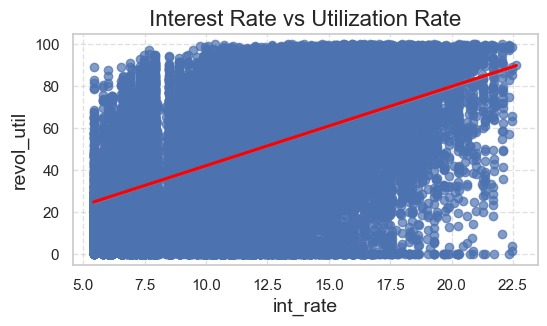

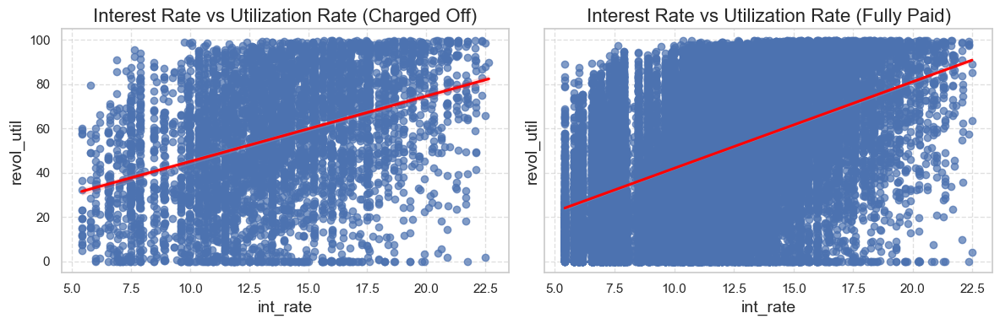

In [270]:
x_col = 'int_rate'
y_col = 'revol_util'

bivariate_numerical(loan, x_col, y_col, 'Interest Rate vs Utilization Rate')
bivariate_numerical_segmented(loan, x_col, y_col, 'Interest Rate vs Utilization Rate')

In [271]:
bivariate_statistical_summary(loan, 'int_rate', 'revol_util')

,count,mean,std,min,25%,50%,75%,max,Correlation
int_rate,35992.0,11.735780,3.570129,5.42,8.9,11.58,14.17,22.64,0.475801
revol_util,35992.0,48.783306,28.295903,0.00,25.5,49.20,72.20,99.90,0.475801


In [272]:
bivariate_statistical_summary(loan[loan['loan_status']=='Fully Paid'], 'int_rate', 'revol_util')

,count,mean,std,min,25%,50%,75%,max,Correlation
int_rate,30842.0,11.430576,3.485518,5.42,8.49,11.36,13.8,22.48,0.483055
revol_util,30842.0,47.640347,28.230556,0.00,24.10,47.80,70.8,99.90,0.483055


In [273]:
bivariate_statistical_summary(loan[loan['loan_status']=='Charged Off'], 'int_rate', 'revol_util')

,count,mean,std,min,25%,50%,75%,max,Correlation
int_rate,5150.0,13.563569,3.524866,5.42,11.110,13.49,16.0,22.64,0.375324
revol_util,5150.0,55.628188,27.717362,0.00,34.625,58.40,78.8,99.90,0.375324


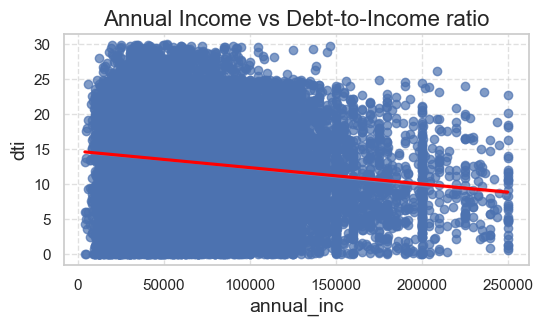

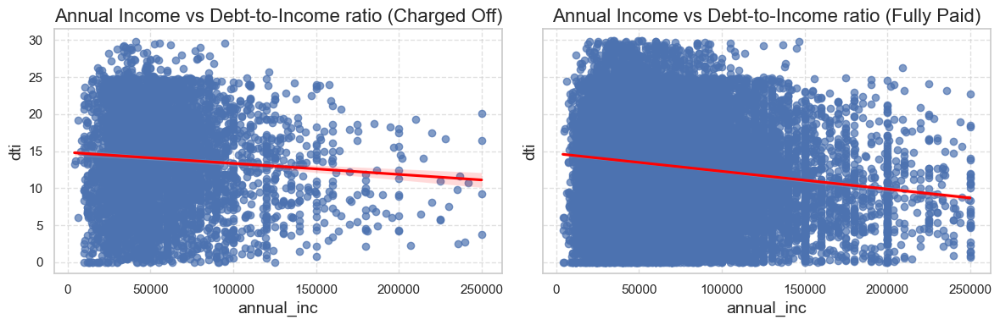

In [274]:
x_col = 'annual_inc'
y_col = 'dti'

bivariate_numerical(loan, x_col, y_col, 'Annual Income vs Debt-to-Income ratio')
bivariate_numerical_segmented(loan, x_col, y_col, 'Annual Income vs Debt-to-Income ratio')

In [275]:
bivariate_statistical_summary(loan, 'annual_inc', 'dti')

,count,mean,std,min,25%,50%,75%,max,Correlation
annual_inc,35992.0,63690.225022,34666.925682,4000.0,40000.00,56000.00,79000.00,250000.00,-0.121511
dti,35992.0,13.253974,6.661392,0.0,8.11,13.33,18.52,29.99,-0.121511


In [276]:
bivariate_statistical_summary(loan[loan['loan_status']=='Fully Paid'], 'annual_inc', 'dti')

,count,mean,std,min,25%,50%,75%,max,Correlation
annual_inc,30842.0,64709.156733,34973.583952,4000.0,40000.00,57455.00,80000.00,250000.00,-0.125636
dti,30842.0,13.130705,6.668779,0.0,7.97,13.16,18.35,29.99,-0.125636


In [277]:
bivariate_statistical_summary(loan[loan['loan_status']=='Charged Off'], 'annual_inc', 'dti')

,count,mean,std,min,25%,50%,75%,max,Correlation
annual_inc,5150.0,57588.110103,32103.769996,4080.0,36000.0000,50004.000,70000.00,250000.00,-0.072878
dti,5150.0,13.992204,6.569387,0.0,9.0625,14.275,19.28,29.85,-0.072878


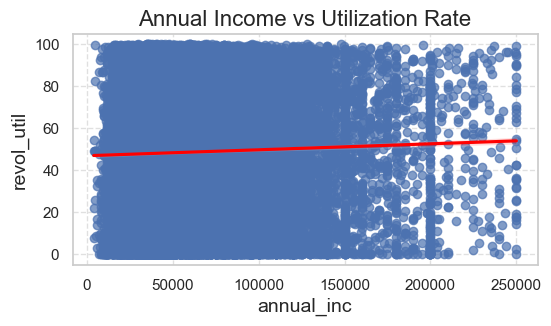

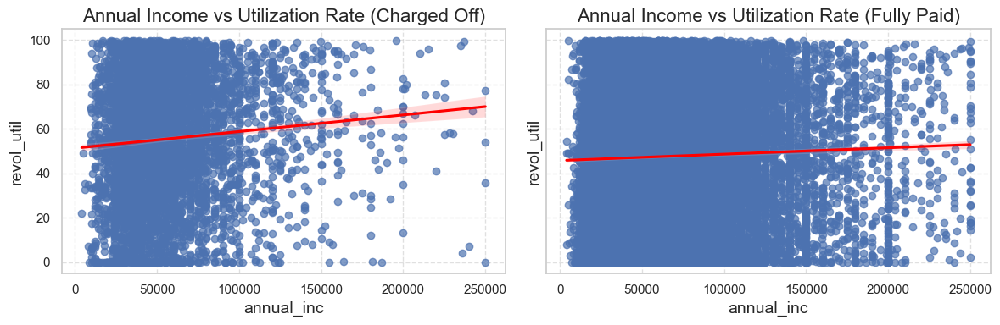

In [278]:
x_col = 'annual_inc'
y_col = 'revol_util'

bivariate_numerical(loan, x_col, y_col, 'Annual Income vs Utilization Rate')
bivariate_numerical_segmented(loan, x_col, y_col, 'Annual Income vs Utilization Rate')

In [279]:
bivariate_statistical_summary(loan, 'annual_inc', 'revol_util')

,count,mean,std,min,25%,50%,75%,max,Correlation
annual_inc,35992.0,63690.225022,34666.925682,4000.0,40000.0,56000.0,79000.0,250000.0,0.03464
revol_util,35992.0,48.783306,28.295903,0.0,25.5,49.2,72.2,99.9,0.03464


In [280]:
bivariate_statistical_summary(loan[loan['loan_status']=='Fully Paid'], 'annual_inc', 'revol_util')

,count,mean,std,min,25%,50%,75%,max,Correlation
annual_inc,30842.0,64709.156733,34973.583952,4000.0,40000.0,57455.0,80000.0,250000.0,0.03536
revol_util,30842.0,47.640347,28.230556,0.0,24.1,47.8,70.8,99.9,0.03536


In [281]:
bivariate_statistical_summary(loan[loan['loan_status']=='Charged Off'], 'annual_inc', 'revol_util')

,count,mean,std,min,25%,50%,75%,max,Correlation
annual_inc,5150.0,57588.110103,32103.769996,4080.0,36000.000,50004.0,70000.0,250000.0,0.086704
revol_util,5150.0,55.628188,27.717362,0.0,34.625,58.4,78.8,99.9,0.086704


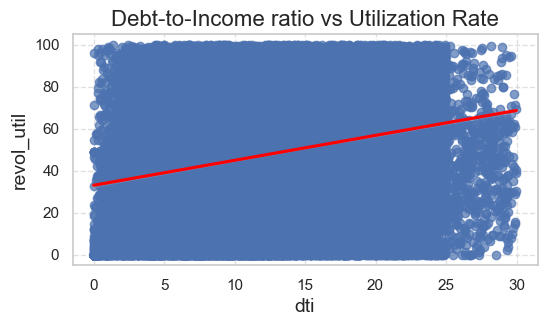

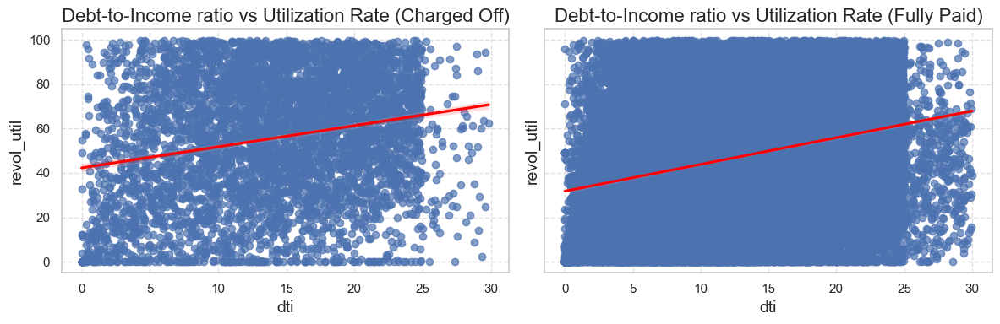

In [282]:
x_col = 'dti'
y_col = 'revol_util'

bivariate_numerical(loan, x_col, y_col, 'Debt-to-Income ratio vs Utilization Rate')
bivariate_numerical_segmented(loan, x_col, y_col, 'Debt-to-Income ratio vs Utilization Rate')

In [283]:
bivariate_statistical_summary(loan, 'dti', 'revol_util')

,count,mean,std,min,25%,50%,75%,max,Correlation
dti,35992.0,13.253974,6.661392,0.0,8.11,13.33,18.52,29.99,0.279352
revol_util,35992.0,48.783306,28.295903,0.0,25.50,49.20,72.20,99.90,0.279352


In [284]:
bivariate_statistical_summary(loan[loan['loan_status']=='Fully Paid'], 'dti', 'revol_util')

,count,mean,std,min,25%,50%,75%,max,Correlation
dti,30842.0,13.130705,6.668779,0.0,7.97,13.16,18.35,29.99,0.284668
revol_util,30842.0,47.640347,28.230556,0.0,24.10,47.80,70.80,99.90,0.284668


In [285]:
bivariate_statistical_summary(loan[loan['loan_status']=='Charged Off'], 'dti', 'revol_util')

,count,mean,std,min,25%,50%,75%,max,Correlation
dti,5150.0,13.992204,6.569387,0.0,9.0625,14.275,19.28,29.85,0.226004
revol_util,5150.0,55.628188,27.717362,0.0,34.6250,58.400,78.80,99.90,0.226004


## <a id = 'categorical-variables-vs-categorical-variables'>B. Categorical Variables vs Categorical Variables</a>  [▲](#top)

**Objective:**

Analyze the relationship between two categorical variables to understand their association and identify any patterns or trends in their co-occurrence.

---

**Questions:**

- What is the relationship between the two categorical variables?
- Are there any patterns or associations between the categories of the variables?
- How do the categories of one variable relate to the categories of the other?
- Are there significant differences in the distribution of categories based on the values of the other variable?

---

**Methods:**

- **Stacked Bar Chart:** Plot a stacked bar chart to visualize the proportions of one categorical variable within each category of the other variable.

---


### KEY INSIGHTS FOR BIVARIATE ANALYSIS OF CATEGORICAL ATTRIBUTES BY LOAN_STATUS

#### **Term**

- Borrowers with Charged Off Loans predominantly had 36 months term by count and **60 months term** by percentage.

---

#### **Grade**

- Borrowers with Charged Off Loans mostly took B, C, D Graded loans by count and **E, F, G Graded Loans** by percentage.

---

#### **Home Ownership**

- Borrowers with Charged Off Loans most likely lived in Rented houses by count and other categories by percentage but variation is very slight.

---

#### **Verification Status**

- Borrowers with Charged Off Loans were most likely Not Verified by count and Verified by percentage but variation is very slight.

---

#### **Employment Length**

- Borrowers with Charged Off Loans had an employment length of more than 10+ years by count and is uniform across all ages by percentage.

---

#### **Purpose**

- Borrowers with Charged Off Loans mostly specified Debt Consolidation by count and **Small-Business** by percentage.

---

#### **Region**

- Borrowers with Charged Off Loans most likely belonged to the West Region by count but is almost uniform across all regions by percentage.

---

#### **Income Category**

- Borrowers with Charged Off Loans mostly belongs to the **Low Income Category** by both count and percentages.

---

#### **Inquiries Last 6 Months**

- Borrowers with Charged Off Loans most likely had no inquiries by count and 3 inquiries by percentages, but there is only slight variation across the dataset.

---

#### **Issue Year, Issue Month, and Issue Quarter**

- Borrowers with Charged Off Loans in general increased year-on-year, with slight variations over months and quarters by count. And by percentages, there is only slight variations in loans in years, quarters and months.

---

### **OUTCOME:**

Based on the Bivariate Correlation of Categorical Variables with Loan_Status, we can conclude that the following qualitative attributes may be the **categorical indicators** for charged-off loans:

1. <span style="color:red; font-size:16px;"><strong>Term</strong></span>
2. <span style="color:green; font-size:16px;"><strong>Grade</strong></span>
3. <span style="color:purple; font-size:16px;"><strong>Purpose</strong></span>
4. <span style="color:teal; font-size:16px;"><strong>Income Category</strong></span>

### _<a id='analysis-of-loan-status'><font color='RebeccaPurple'>Analysis of Loan Status</font></a>_ [▲](#top)

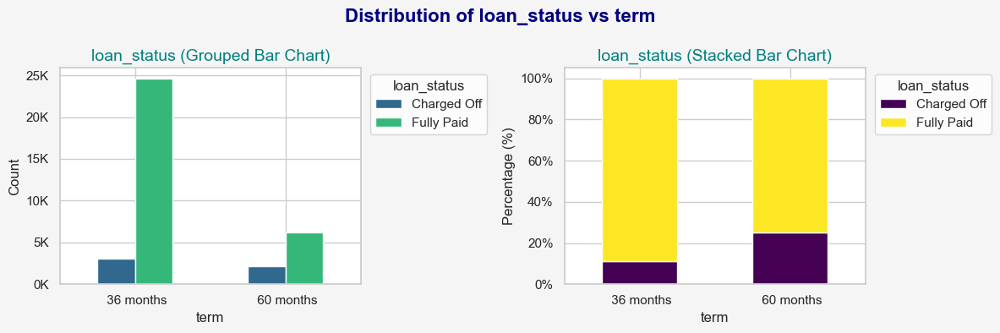

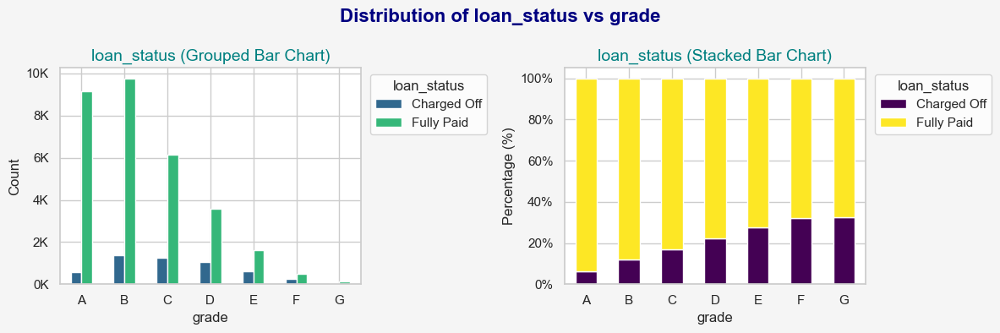

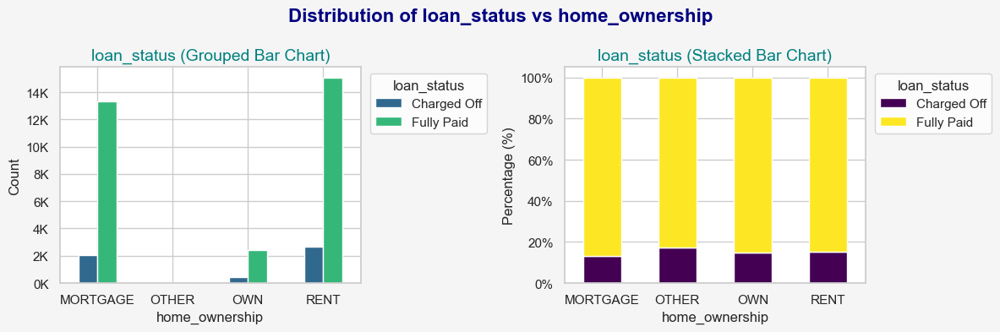

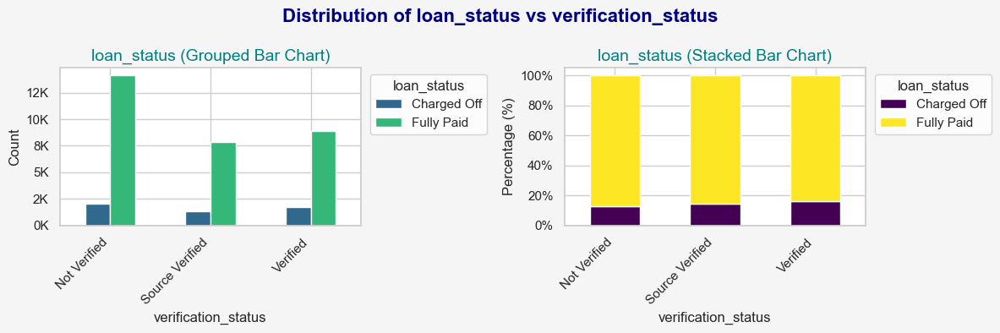

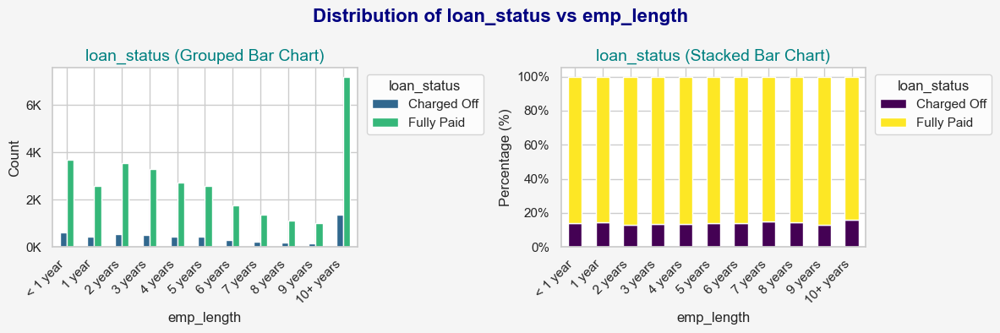

...

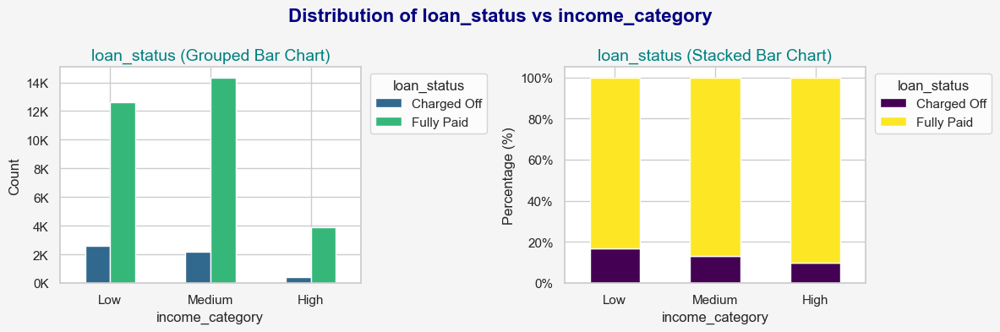

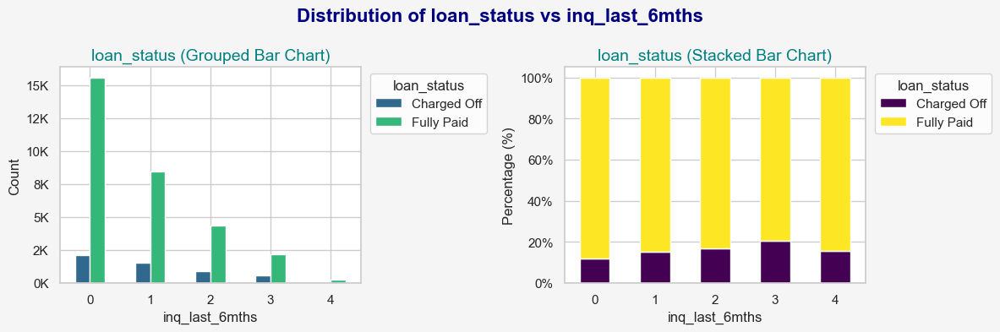

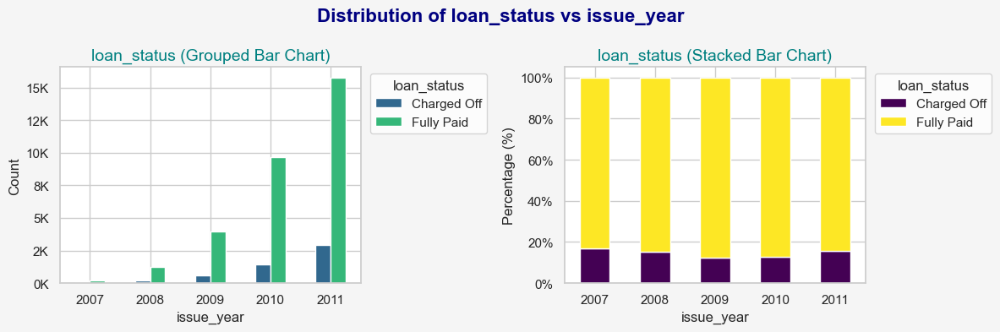

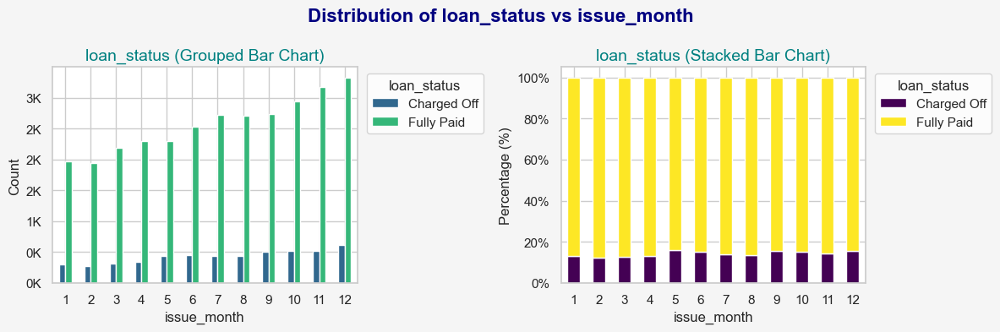

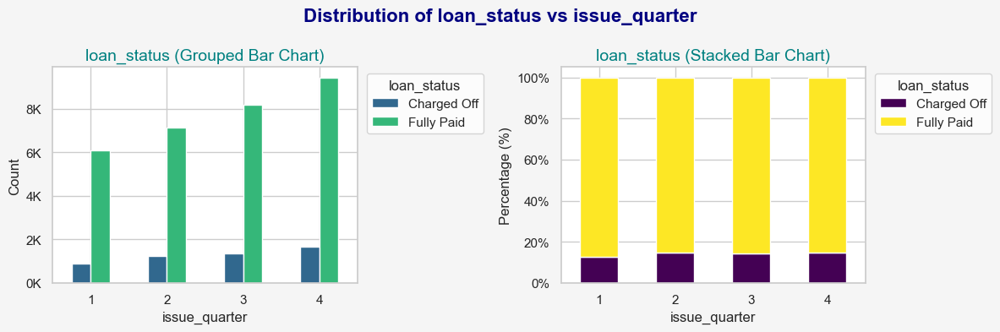

In [286]:
categorical_column_1 = 'loan_status'
categorical_columns_2 = categorical_columns.copy()
categorical_columns_2.remove(categorical_column_1)

for categorical_column_2 in categorical_columns_2:
    bivariate_categorical(loan, categorical_column_1, categorical_column_2)

## <a id = 'numerical-variables-vs-categorical-variables'>C. Numerical Variables vs Categorical Variables</a>  [▲](#top)

**Objective:**

Examine the relationship between a numerical variable and a categorical variable to understand how the numerical values differ across the categories.

---

**Questions:**

- How does the numerical variable vary across different categories of the categorical variable?
- Are there noticeable differences in the distributions of the numerical variable among the categories?
- Are there any patterns or trends in the numerical data within different categories?
- How do the central tendencies and variabilities of the numerical variable compare across categories?

---

**Methods:**

- **Boxplot:** Create boxplots to visualize the distribution of the numerical variable within each category of the categorical variable. This will help identify differences in medians, quartiles, and potential outliers.
- **Violin Plot:** Generate violin plots to display the density distribution of the numerical variable for each category. This provides a clearer view of the distribution shape and variability.
- **Comparative Analysis:** Assess and compare the spread and central tendency of the numerical variable within each category to determine if there are significant differences or patterns.

---


### KEY INSIGHTS FOR RELATIONSHIPS BETWEEN NUMERICAL DRIVERS AND CATEGORICAL DRIVERS OF DEFAULT

For Charged Off Loans, following trends were observed:

#### Loan Amount vs. Categorical Variables:
   - **Term:** Boxplots and violin plots show a higher median loan amount for longer-term loans (' 60 months') compared to shorter-term loans (' 36 months'). The distribution for longer-term loans is also more spread out.
   - **Grade:** Higher loan amounts are generally associated with lower grades ('E' to 'G'). Violin plots indicate that 'G' grades tend to have higher loan amounts, with a wide distribution in higher grades.
   - **Purpose:** Boxplots reveal that loan amounts do not vary significantly based on the loan purpose. Loans for 'credit card', 'debt consolidation', 'home improvement' and 'small business' show higher median amounts compared to others.
   - **Income Category:** The loan amount increases with the income category. Higher income categories show a higher median loan amount, with broader distribution in the 'High' income category.

---

#### Interest Rate vs. Categorical Variables:
   - **Term:** Interest rates are higher for long-term loans ('60 months') compared to shorted-term loans ('36 months'). The distribution is similar for both the term.
   - **Grade:** Interest rates are higher for lower grades. For instance, 'G' grades tend to have higher interest rates compared to 'A' grades.
   - **Purpose:** Different loan purposes have varied interest rates. Loans for 'house' and 'small business' have higher interest rates compared to other loans.
   - **Income Category:** Interest rates is almost similar for all income categories.
   
---

#### Annual Income vs. Categorical Variables:
   - **Term, Grade, Purpose:** Annual income shows no significant trend in central tendency and distribution with respect to Term, Grade and Purpose.
   - **Income Category:** The annual income increases with the income category. 'High' income category shows the highest annual income with the most significant variability. This mainly because the Income_category is a derivative of Annual Incomes.
   
---

#### Debt-to-Income Ratio vs. Categorical Variables:
   - **Term, Grade, Purpose:** DTI ratios show no significant trend in central tendency and distribution with respect to Term, Grade and Purpose.
   - **Income Category:** DTI ratios are higher in lower income categories. 'Low' income category shows higher median DTI ratios compared to 'High' income category.
   
---

#### Revolving Utilization vs. Categorical Variables:
   - **Term:** Revolving utilization is similar for both ' 36 months' loans and ' 60 months'.
   - **Grade:** Lower grades exhibit higher revolving utilization. 'F' grade borrowers, followed by G, tend to have higher utilization compared to all the other grade borrowers, but 'G' grades have a wider distribution.
   - **Purpose:** Revolving utilization varies with loan purpose. 'Credit card' loans have a higher revolving utilization compared to 'debt consolidation' loans.
   - **Income Category:** Higher income categories show higher revolving utilization. The 'Low' income category generally exhibits wider distribution compared to 'High' income.
   
---

### **OUTCOME:**

Based on the Bivariate Correlation of Numerical Variables vs Categorical Variables, we can conclude that for Charged Off Loans:

1. <span style="color:red; font-size:16px;"><strong>Loan Amount is positively correlated to Term, Grade and Income Category</strong></span>
2. <span style="color:green; font-size:16px;"><strong>Interest Rate is strongly correlated to Term and Grade</strong></span>
3. <span style="color:purple; font-size:16px;"><strong>Annual Income is only correlated to Income Category which is expected</strong></span>
4. <span style="color:teal; font-size:16px;"><strong>DTI is weakly correlated to Income Category</strong></span>
5. <span style="color:orange; font-size:16px;"><strong>Revolving Utilization Rate is correlated to Grade and Income Category</strong></span>

In [287]:
numerical_drivers = ['loan_amnt', 'int_rate', 'annual_inc', 'dti', 'revol_util']
categorical_drivers = ['term', 'grade', 'purpose', 'income_category']

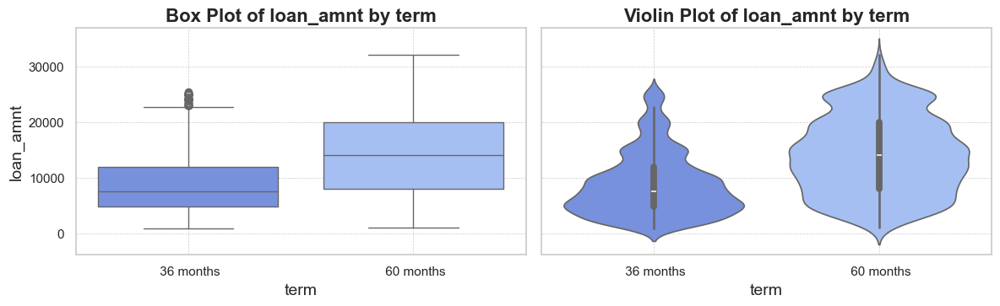

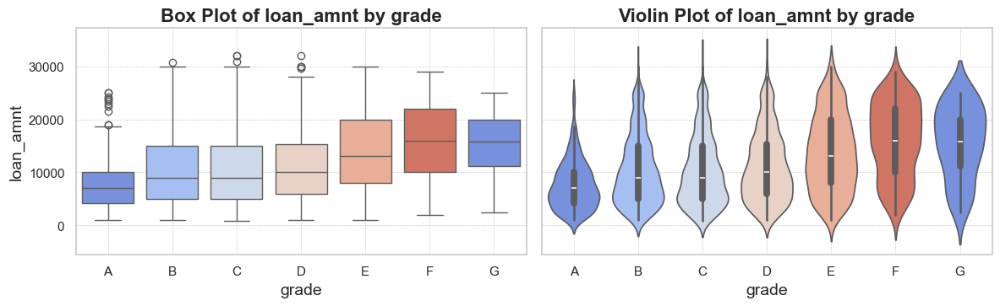

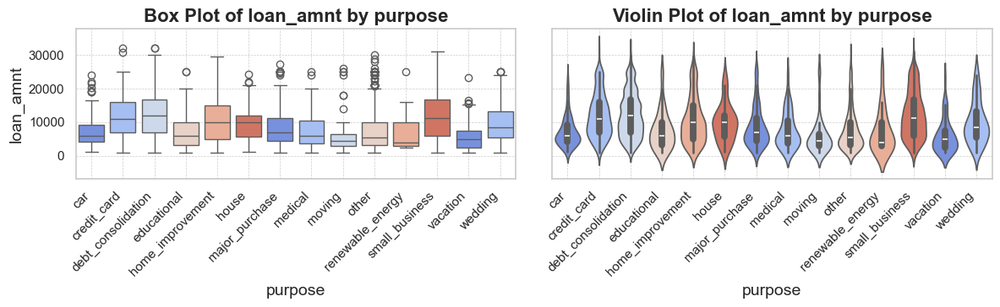

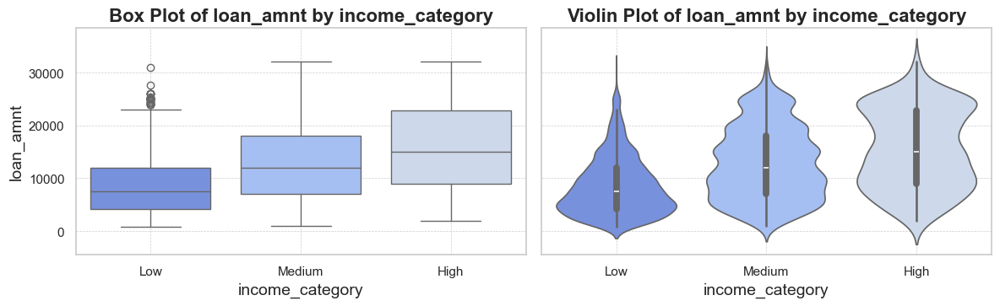

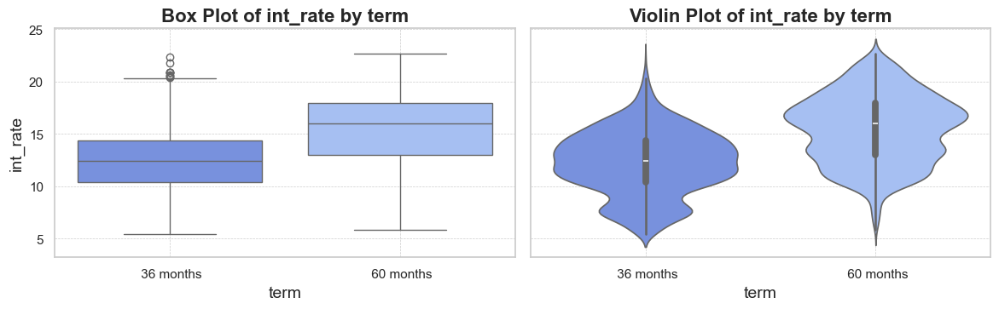

...

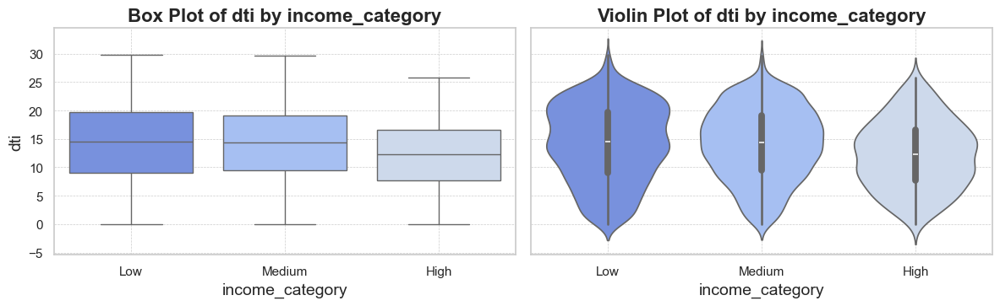

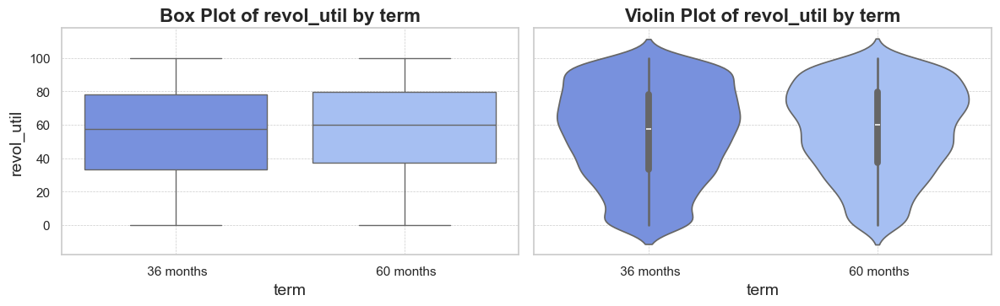

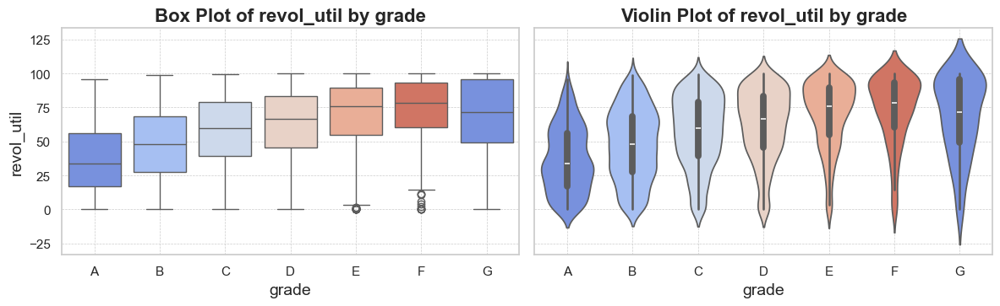

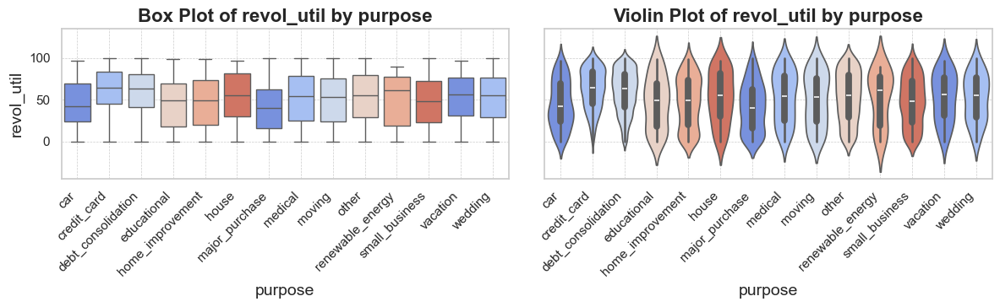

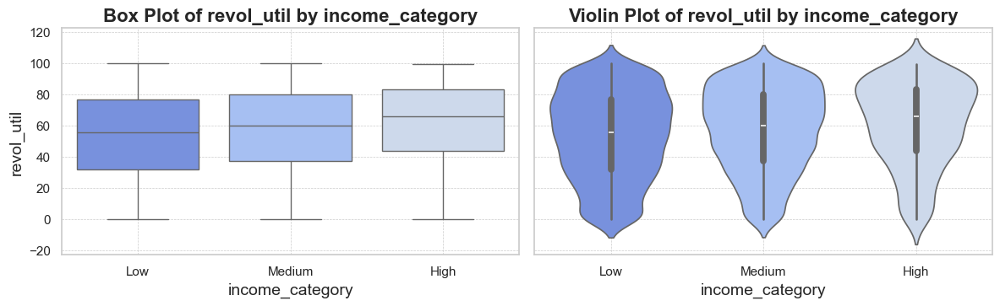

In [288]:
for numerical_col in numerical_drivers:
    for categorical_col in categorical_drivers:
        bivariate_num_cat(loan[loan['loan_status'] == 'Charged Off'], numerical_col, categorical_col)

# <a id = 'multivariate-analysis'>7. Multivariate Analysis</a>

### KEY INSIGHTS FOR RELATIONSHIPS BETWEEN NUMERICAL DRIVERS AND CATEGORICAL DRIVERS OF DEFAULT

#### **Feature Similarity**

- For Fully Paid loans, loan amount, funded amount, funded amount by investors, and total principal received, exhibit strong correlations with each other. However, for Charged Off loans, the total principal received graph shows irregularities. This indicates that people usually get funding for the amount they apply for and most of the time it is the investors who are lending the money and not the company. However, the invested amount is not always retrieved as it gets Charged Off for several reasons.
- The interest rate stands out as less correlated with loan amount, funded amount, funded amount by investors, and total principal received, suggesting it behaves independently from the amount and repayment metrics.

---

#### **Annual Income vs. Other Columns:**

- **High Revolving Utilization:** Applicants with high annual income are more likely to default when their revolving utilization rate is between 80% and 100%.
- **Home Ownership:** Defaults are more common among high-income applicants with a mortgage.
- **Loan Purpose:** High-income defaulters often take loans for home improvement, renewable energy, or housing.
- **Verification Status:** High-income defaulters are frequently those with verified verification status.
- **Loan Grade:** Defaults are associated with high-income applicants who have a Grade G loan.
- **Sub Grade:** High-income defaulters often have a Sub Grade of G4.
- **Loan Amount:** High-income applicants default more often when the loan amount is between \\$25,000 and \\$30,000.
- **Geographic Location:** High-income defaults are observed for loans applied in Arkansas.

---

#### **Loan Amount vs. Other Columns:**

- **Home Ownership Status:** High loan amounts are linked to defaults when the home ownership status is unspecified.
- **Loan Purpose:** Defaults occur more frequently with high loan amounts for purposes such as small business and housing.
- **Verification Status:** High loan amounts are associated with defaults when the verification status is verified.
- **Loan Grade:** Defaults are common among high loan amounts with Grade G.
- **Sub Grade:** High loan amounts are tied to defaults when the Sub Grade is G4.
- **Interest Rates:** Defaults are prevalent for high loan amounts with interest rates between 21% and 24%.
- **Geographic Location:** High loan amounts lead to defaults more frequently in Wyoming.

---

#### **Understanding the Demographic of the people whose loans were Charged Off**

- **Variations in Loan Amounts:** 
    - The largest charged-off loans were given to individuals in the High Income category who took loans of Grade F for 'Major Purchases' or 'Other' purposes. 
    - The Loan Amounts were most likely smaller for the purpose of 'Renewable Energy' across all grades and income categories.

- **Variations in Annual Income:**
    - The highest annual incomes among charged-off loan recipients were associated with those who had mortgages, took Grade F loans, and had 8-9 years of employment.
    - The Annual incomes were most likely smallest for those whose home ownership status was 'Other'.
    
- **Variations in Interest Rates:**
    - The highest interest rates among charged-off loan recipients were most commonly associated with Grade F and G loans, spanning all income categories, and were linked to various loan purposes. Exceptions in purpose include moving, vacation, education, and renewable energy, where the interest rates were lowest for Grades F and G.
    
- **Variations in DTI ratios:**
    - DTI ratios vary widely among individuals with charged-off loans. The highest DTI ratio was observed for borrowers with 2 years of employment, a high income category, and loans taken for major purchases.

- **Variations in Revol_Util:**
    - The Revolving Utilization Rate, a key indicator, highlights potential misuse of the Lending Club platform. High rates are linked to low-income individuals with less than one year of employment and 'Other' home ownership. In contrast, those with longer employment and varied home ownership show lower utilization rates.
    
---

### **OUTCOME:**

Based on the Multivariate Analysis, we can conclude that for Charged Off Loans:

- <span style="color:red; font-size:16px;"><strong>Revolving Utilization Rate is the most important indicator of Default behaviour.</strong></span>
- <span style="color:purple; font-size:16px;"> The other Key Indicators include, Loan Amount, Interest Rate, Annual Income, DTI, Term, Grade, Purpose, Employment Length, Income Category, Verification Status, Home Ownership, Sub Grade and Address State</span>

## <a id = 'three-variable-analysis'>A. Three Variable Analysis</a>  [▲](#top)

In [289]:
# Define the mapping
status_mapping = {0: 'Fully Paid', 1: 'Charged Off'}

# Convert to categorical type with custom names
numerical_df['loan_status'] = pd.Categorical(numerical_df['loan_status'].map(status_mapping),
                                             categories=['Fully Paid', 'Charged Off'],
                                             ordered=True)

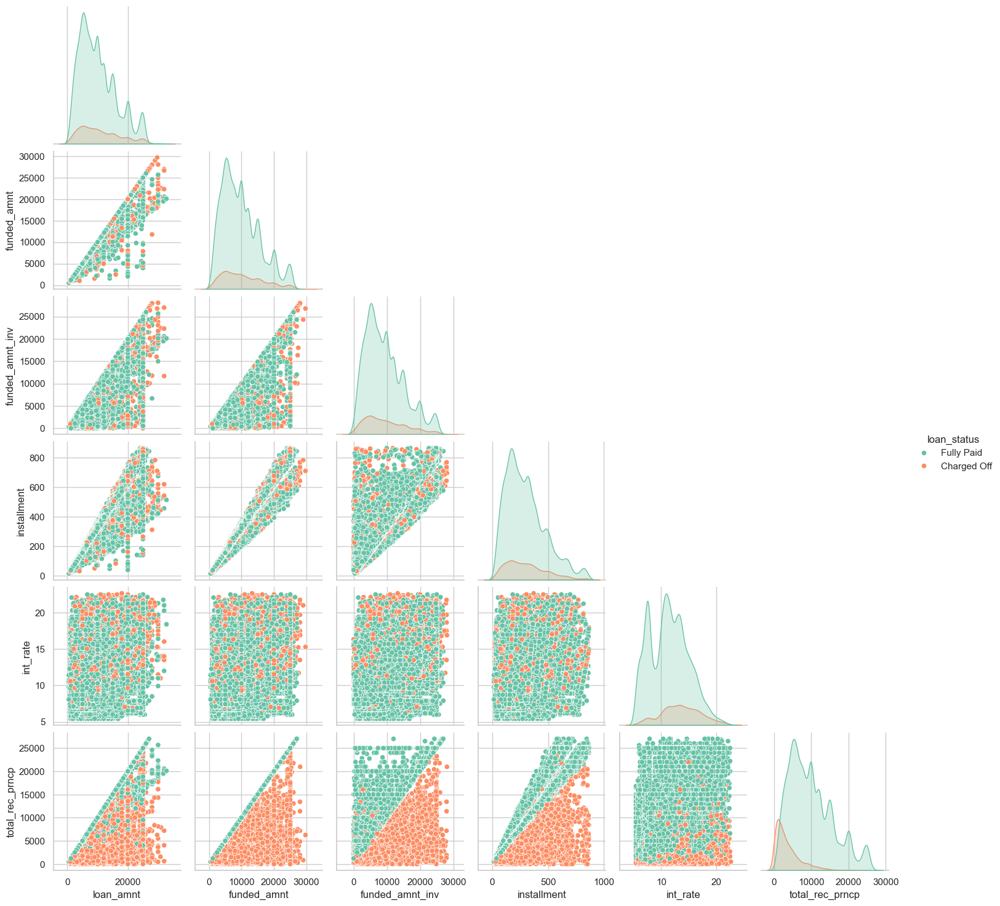

In [290]:
pair_plot_set = ['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'installment', 'int_rate', 'total_rec_prncp', 'loan_status']
sns.pairplot(numerical_df[pair_plot_set], 
             hue='loan_status', 
             palette='Set2', 
             diag_kind='kde', 
             corner=True)

# Show the plot
plt.show()

### _<a id='annual-income-vs-other-columns'><font color='RebeccaPurple'>Annual Income vs other columns</font></a>_ [▲](#top)

In [291]:
loan_df = loan.copy()

loan_df['installment_groups'] = pd.cut(loan_df['installment'], bins=10,precision =0,labels=['14-145','145-274','274-403','403-531','531-660','660-789','789-918','918-1047','1047-1176','1176-1305'])
loan_df['loan_amnt_groups'] = pd.cut(loan_df['loan_amnt'] , bins=6,precision =0,labels=['1-5k','5k-10k','10k-15k','15k-20k','20k-25k','25k-30k'])
loan_df['dti_groups'] = pd.cut(loan_df['dti'] , bins=5,precision =0,labels=['0-6','6-12','12-18','18-24','24-30'])
loan_df['int_rate_groups'] = pd.cut(loan_df['int_rate'] , bins=5,precision =0,labels=['5%-9%','9%-13%','13%-17%','17%-21%','21%-24%'])
loan_df['annual_inc_groups'] = pd.cut(loan_df['annual_inc'], bins=5,precision =0,labels =['3k-31k','31k-58k','58k-85k','85k-112k','112k-140k'])
loan_df['open_acc_groups'] = pd.cut(loan_df['open_acc'],bins = 5,precision =0,labels=['1-10','10-19','19-27','27-36','36-44'])
loan_df['revol_util_groups'] = pd.cut(loan_df['revol_util'], bins=5,precision =0,labels=['0-20','20-40','40-60','60-80','80-100'])
loan_df['total_acc_groups'] = pd.cut(loan_df['total_acc'], bins=5,precision =0,labels=['0-10','10-20','20-30','30-40','40-50'])

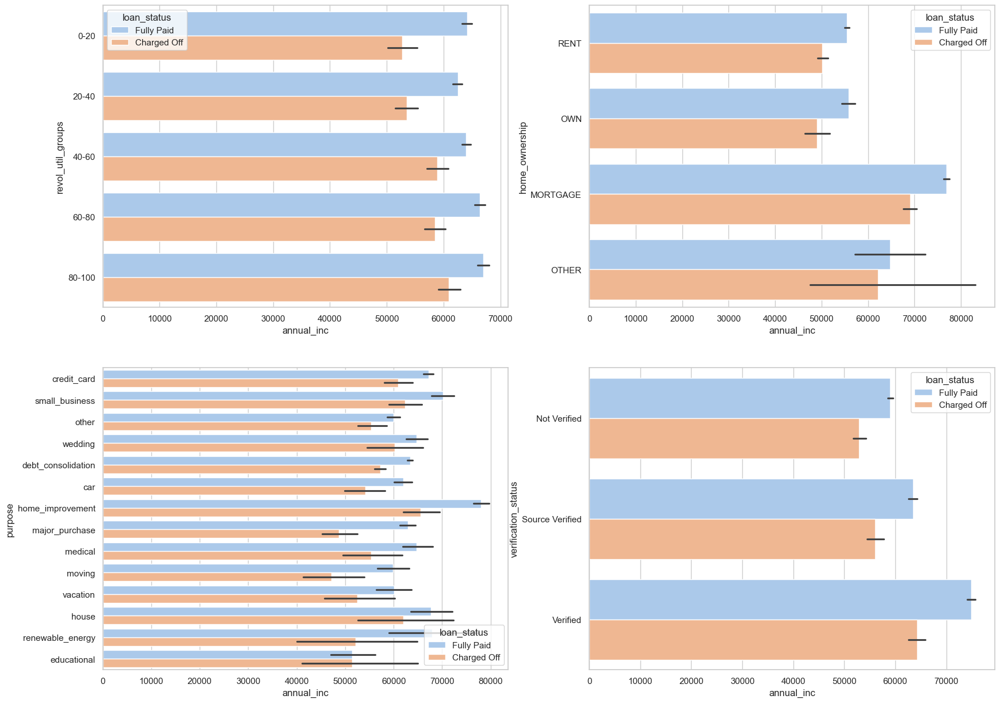

In [292]:
plt.figure(figsize=(20,15))
plt.subplot(221)
sns.barplot(data =loan_df,x='annual_inc', y='revol_util_groups', hue ='loan_status',palette="pastel")
plt.subplot(222)
sns.barplot(data =loan_df,x='annual_inc', y='home_ownership', hue ='loan_status',palette="pastel")
plt.subplot(223)
sns.barplot(data =loan_df,x='annual_inc', y='purpose', hue ='loan_status',palette="pastel")
plt.subplot(224)
loan_df['verification_status'] = pd.Categorical(loan_df['verification_status'])
ax = sns.barplot(data =loan_df,x='annual_inc', y='verification_status', hue ='loan_status',palette="pastel")
ax.set_yticklabels(verification_status_labels)
plt.show()

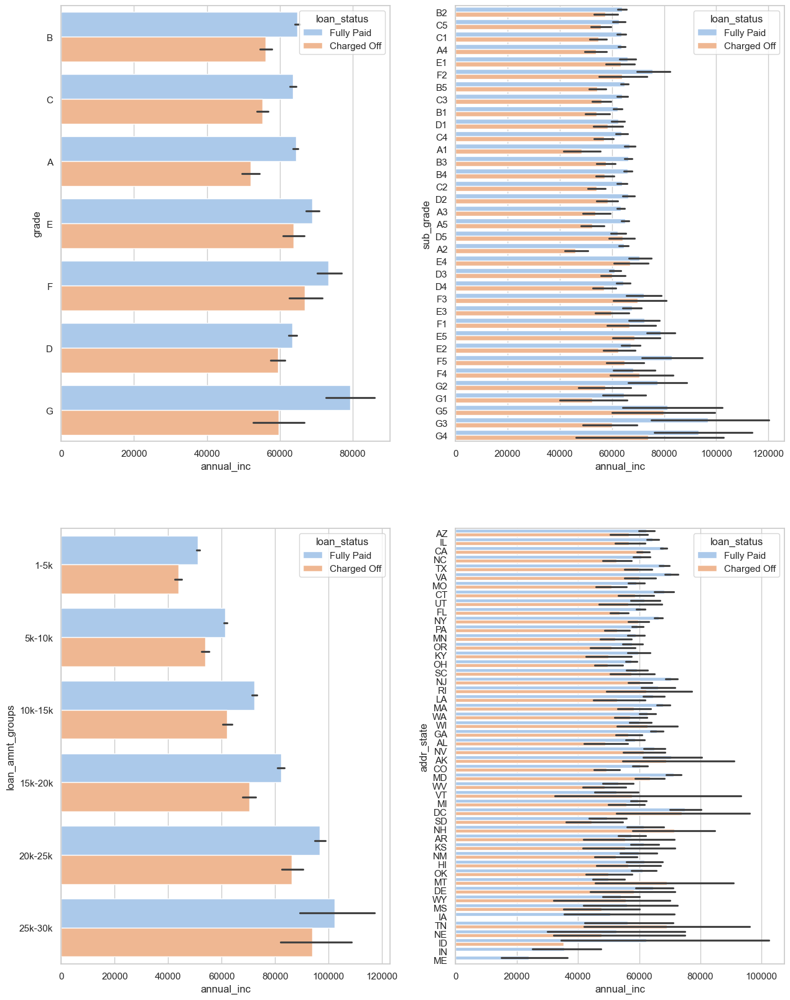

In [293]:
plt.figure(figsize=(15,20))
plt.subplot(221)
sns.barplot(data =loan_df,x='annual_inc', y='grade', hue ='loan_status',palette="pastel")
plt.subplot(222)
sns.barplot(data =loan_df,x='annual_inc', y='sub_grade', hue ='loan_status',palette="pastel")
plt.subplot(223)
sns.barplot(data =loan_df,x='annual_inc', y='loan_amnt_groups', hue ='loan_status',palette="pastel")
plt.subplot(224)
sns.barplot(data =loan_df,x='annual_inc', y='addr_state', hue ='loan_status',palette="pastel")
plt.show()

### _<a id='loan-amount-vs-other-columns'><font color='RebeccaPurple'>Loan Amount vs other columns</font></a>_ [▲](#top)

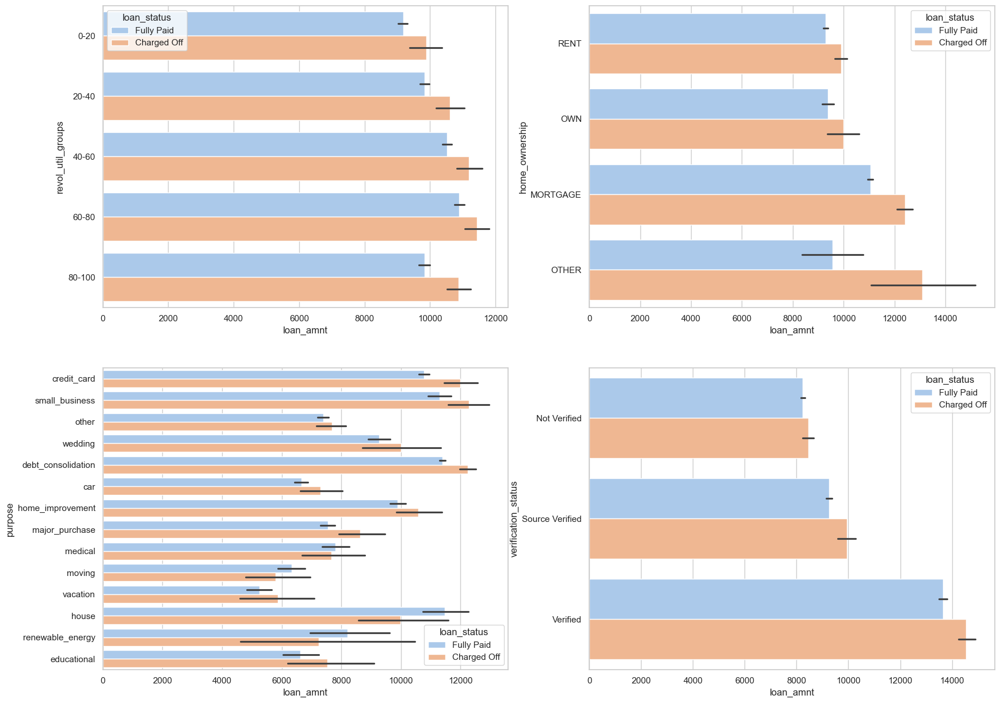

In [294]:
plt.figure(figsize=(20,15))
plt.subplot(221)
sns.barplot(data =loan_df,x='loan_amnt', y='revol_util_groups', hue ='loan_status',palette="pastel")
plt.subplot(222)
sns.barplot(data =loan_df,x='loan_amnt', y='home_ownership', hue ='loan_status',palette="pastel")
plt.subplot(223)
sns.barplot(data =loan_df,x='loan_amnt', y='purpose', hue ='loan_status',palette="pastel")
plt.subplot(224)
ax = sns.barplot(data =loan_df,x='loan_amnt', y='verification_status', hue ='loan_status',palette="pastel")
ax.set_yticklabels(verification_status_labels)
plt.show()

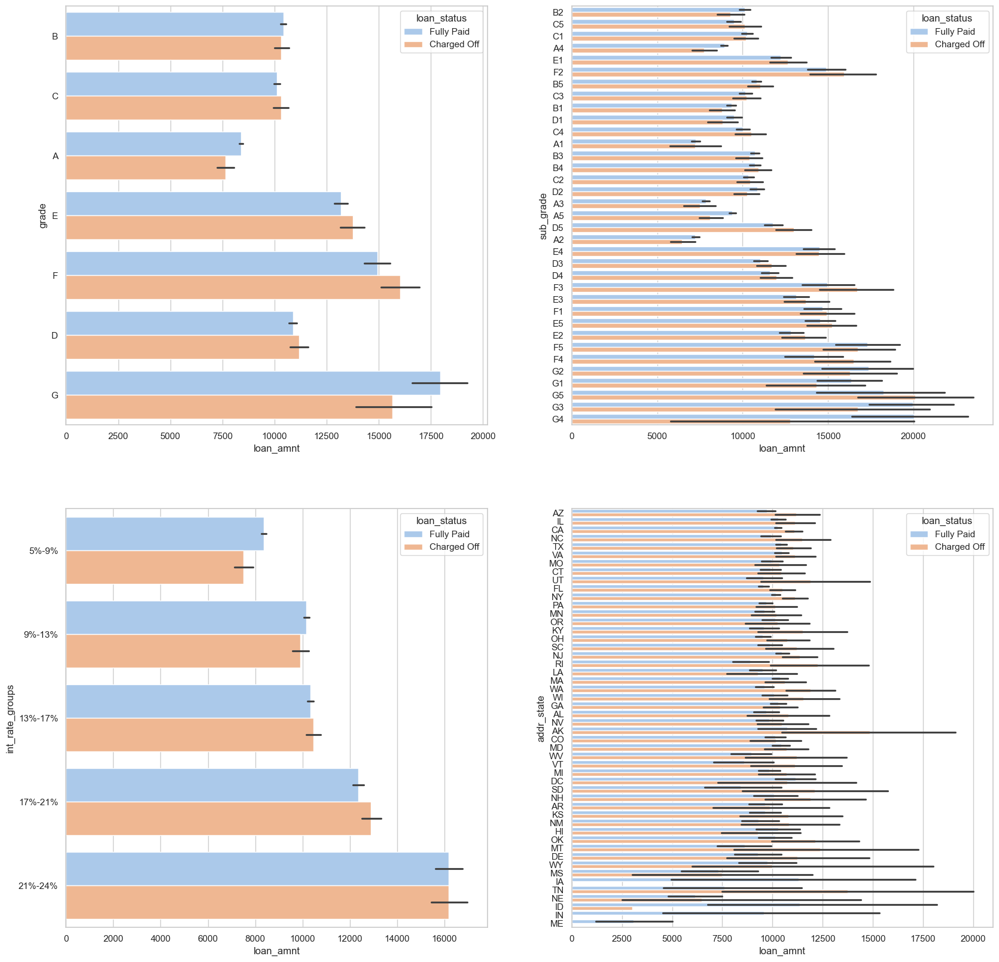

In [295]:
plt.figure(figsize=(20,20))
plt.subplot(221)
sns.barplot(data =loan_df,x='loan_amnt', y='grade', hue ='loan_status',palette="pastel")
plt.subplot(222)
sns.barplot(data =loan_df,x='loan_amnt', y='sub_grade', hue ='loan_status',palette="pastel")
plt.subplot(223)
sns.barplot(data =loan_df,x='loan_amnt', y='int_rate_groups', hue ='loan_status',palette="pastel")
plt.subplot(224)
sns.barplot(data =loan_df,x='loan_amnt', y='addr_state', hue ='loan_status',palette="pastel")
plt.show()

## <a id = 'four-variable-analysis'>B. Four Variable Analysis</a>  [▲](#top)

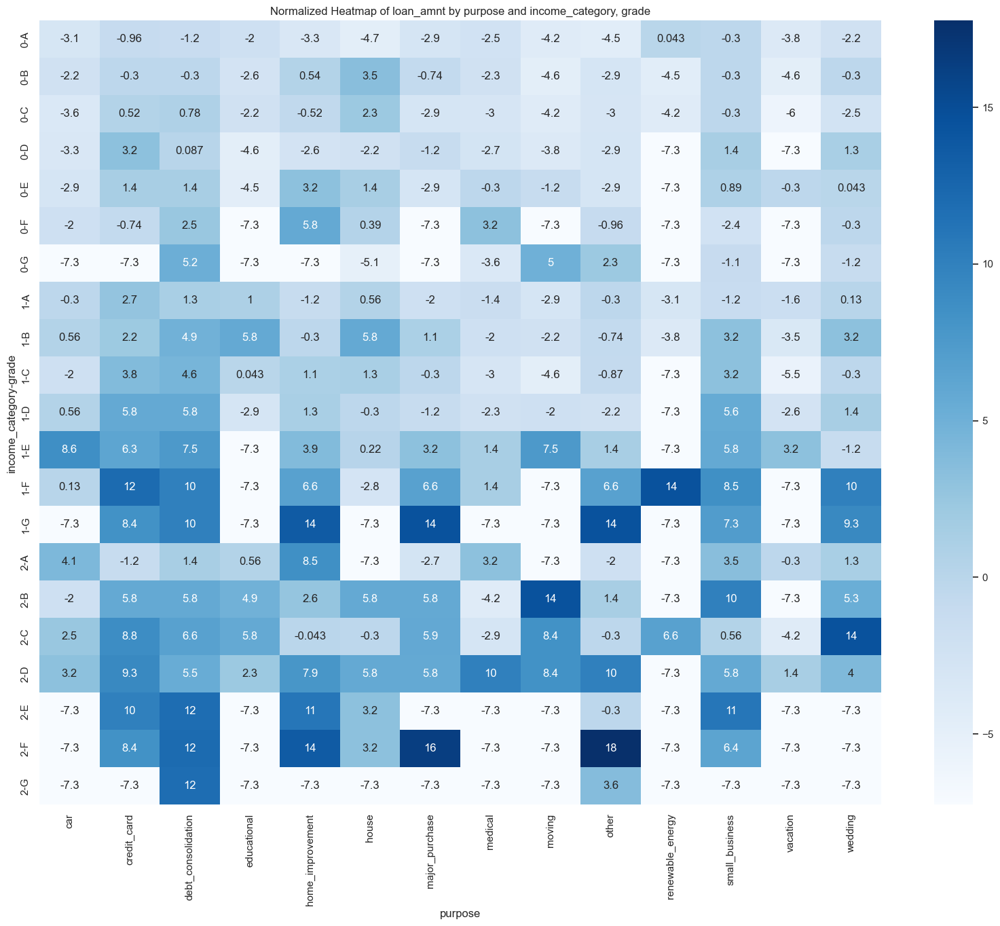

In [296]:
plot_normalized_heatmap(loan[loan['loan_status'] == 'Charged Off'], values_col='loan_amnt', 
                        index_cols=['income_category', 'grade'], columns_col='purpose')

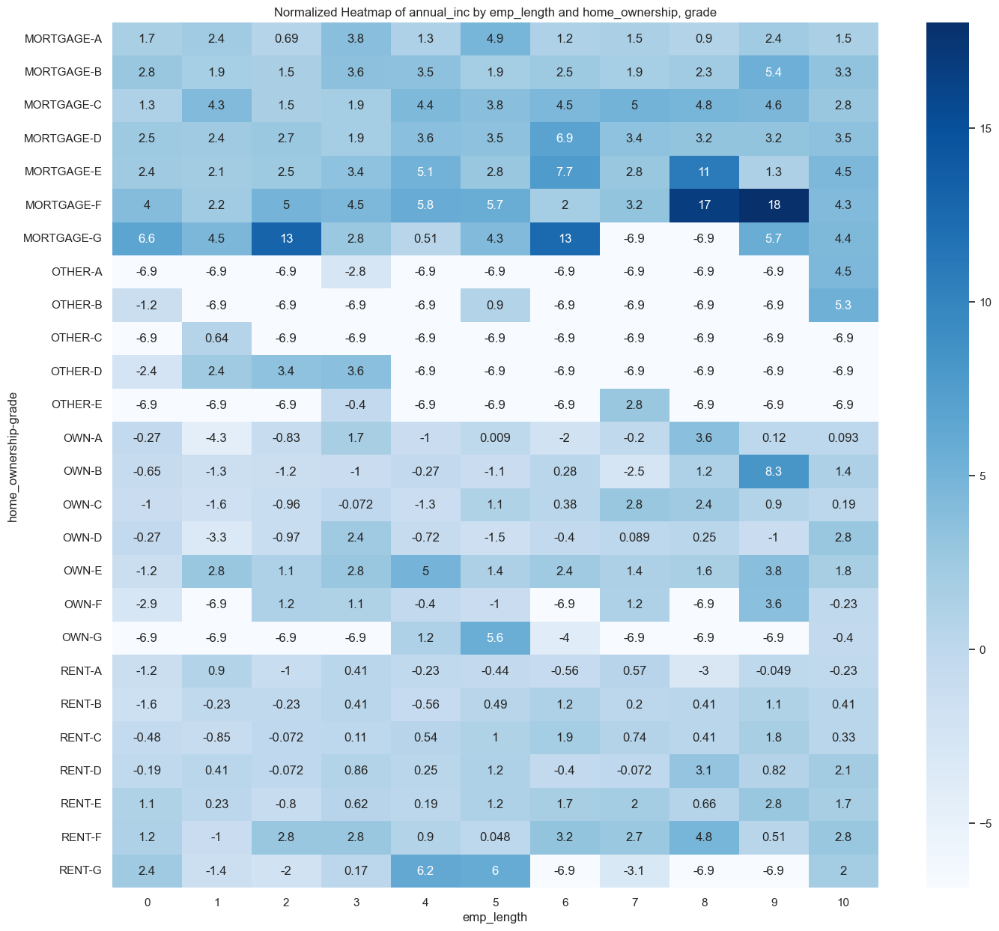

In [297]:
plot_normalized_heatmap(loan[loan['loan_status'] == 'Charged Off'], values_col='annual_inc', 
                        index_cols=['home_ownership', 'grade'], columns_col='emp_length')

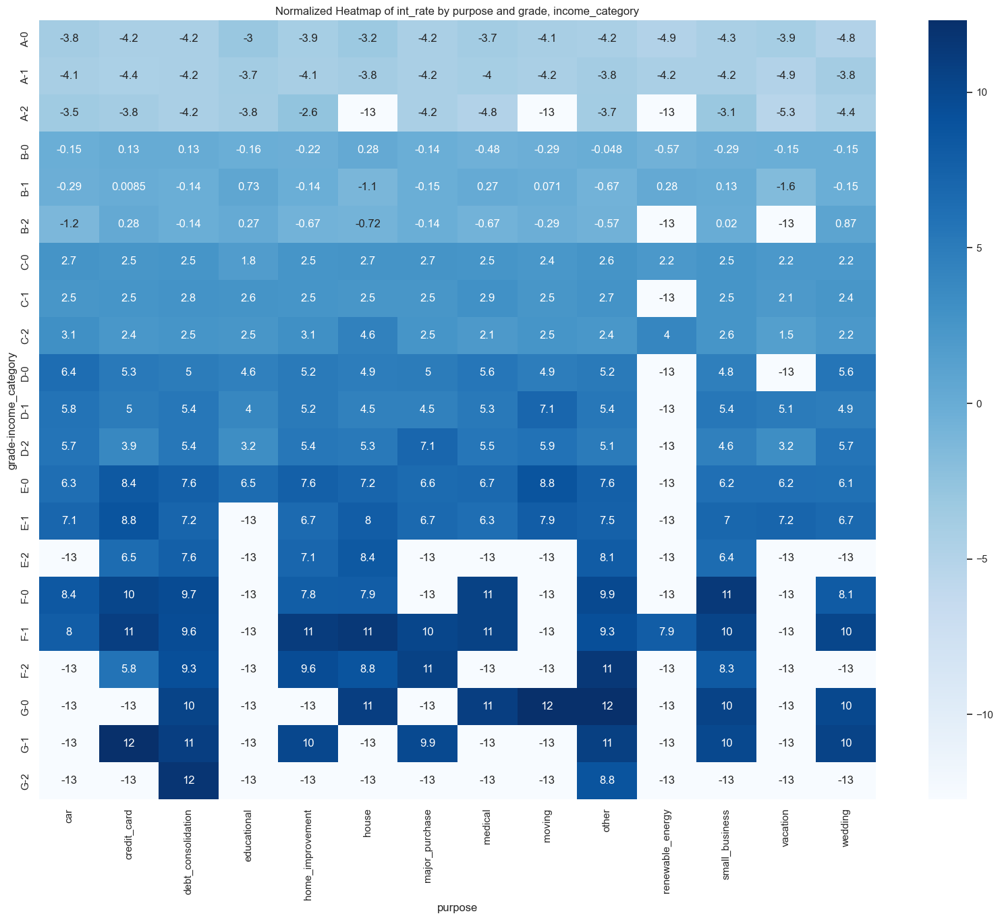

In [298]:
plot_normalized_heatmap(loan[loan['loan_status'] == 'Charged Off'], values_col='int_rate', 
                        index_cols=['grade', 'income_category'], columns_col='purpose')

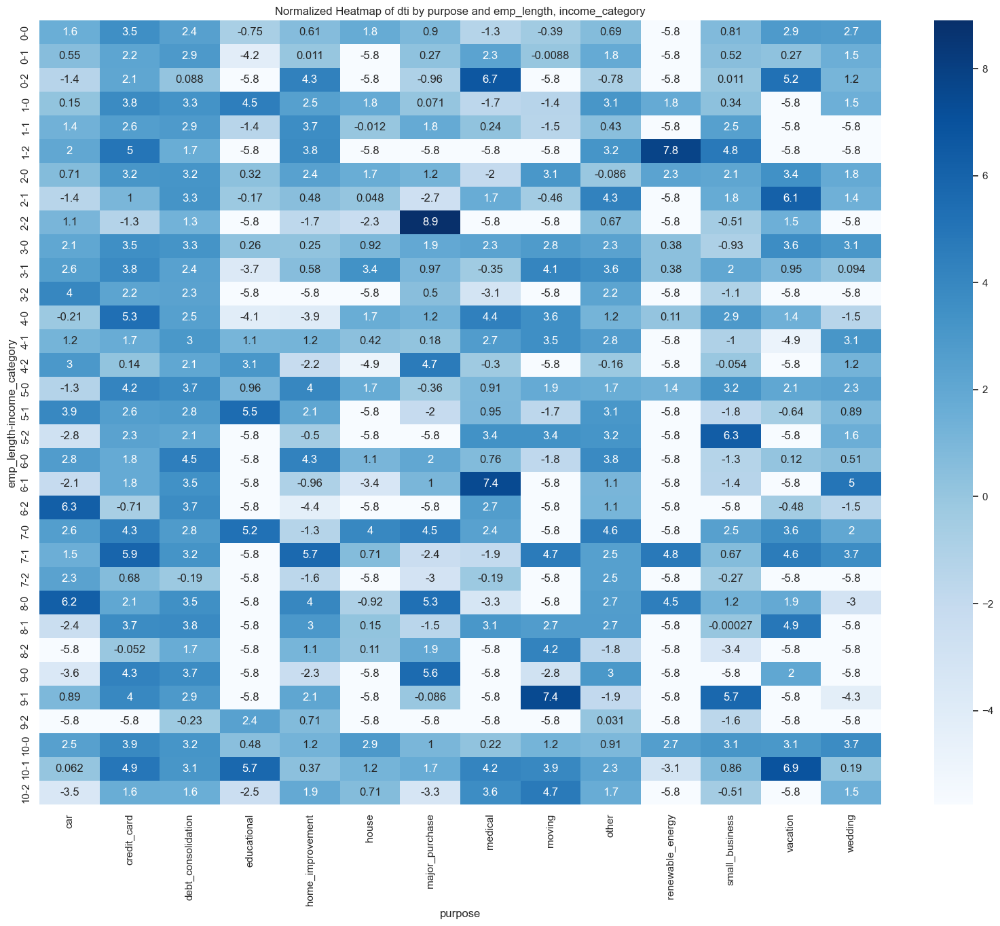

In [299]:
plot_normalized_heatmap(loan[loan['loan_status'] == 'Charged Off'], values_col='dti', 
                        index_cols=['emp_length', 'income_category'], columns_col='purpose')

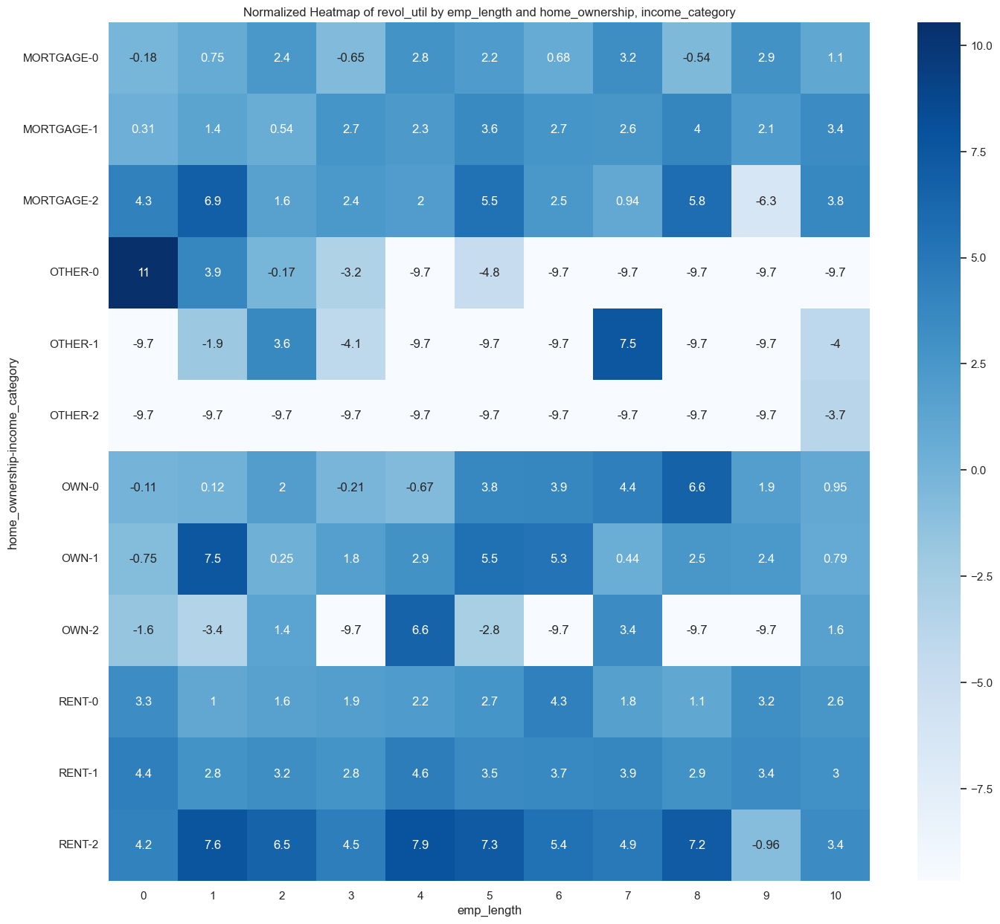

In [300]:
plot_normalized_heatmap(loan[loan['loan_status'] == 'Charged Off'], values_col='revol_util', 
                        index_cols=['home_ownership', 'income_category'], columns_col='emp_length')